In [1]:
# Mov. 1 Cell Data Extraction

# import required libraries/modules
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# import machine learning models & clustering visualization packages
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering
%matplotlib inline
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

# display all columns in dataframe for review
pd.set_option('display.max_columns', None)

# extract file_path 
file_path = "Area and delta.xlsx" 

# read excel file
sheet_1_raw_df = pd.read_excel(file_path)
sheet_1_raw_df.head()

,Slides,Time,Time (20 minutes),Cell 1,Cell 2,Cell 3,Cell 4,cell 5,Cell 6,Cell 7,Cell 9,Cell 10,Cell 11,Cell 12,Cell 13,Cell 14,Cell 15,cell 16,Cell 17,Cell 18,Cell 19,Cell 20,Cell 21,Cell 22,Cell 23,Cell 24,Cell 25,Cell 26,Unnamed: 28,Cell 2.1,Cell 3.1,Cell 4.1,cell 5.1,Cell 6.1,Cell 7.1,Cell 9.1,Cell 10.1,Cell 11.1,Cell 12.1,Cell 13.1,Cell 14.1,Cell 15.1,cell 16.1,M,N,O
0,1,23:00:00,0,NaN,NaN,NaN,NaN,NaN,NaN,8.3789,30.0376,12.4103,11.6988,7.5884,0,NaN,11.6988,NaN,8.3789,18.9711,NaN,11.4617,12.173,23.0025,13.0426,10.0389,9.0113,0,NaN,NaN,NaN,NaN,NaN,NaN,9.612414,9.396629,9.180843,8.965057,8.749271,8.533485,8.317699,8.101913,7.886127,16.0464,16.8368,22.5282
1,2,23:20:00,20,NaN,NaN,NaN,NaN,NaN,NaN,7.5884,30.4328,12.4893,15.6512,11.1455,0,NaN,15.6512,NaN,7.5884,22.4491,NaN,8.6951,10.513,15.6512,13.5169,10.6712,9.4065,8.6951,NaN,NaN,NaN,NaN,NaN,NaN,10.252631,10.024132,9.795633,9.567134,9.338635,9.110136,8.881638,8.653139,8.42464,18.734,17.9435,20.1568
2,3,23:40:00,40,NaN,NaN,NaN,NaN,NaN,NaN,9.9598,22.4491,10.3551,13.675,6.798,0,NaN,13.675,NaN,9.9598,19.4454,NaN,10.197,13.675,25.69,11.0665,9.4065,9.4065,9.7227,NaN,NaN,NaN,NaN,NaN,NaN,12.548892,12.582442,12.615992,12.649542,12.683092,12.716641,12.750191,12.783741,12.817291,16.0464,17.074,20.473
3,4,"1 day, 0:00:00",60,NaN,NaN,NaN,NaN,NaN,NaN,11.6198,29.7214,13.2007,11.6988,8.616,0,NaN,11.6988,NaN,11.6198,24.1091,NaN,9.5646,12.173,14.7026,12.015,8.6951,8.0627,10.7503,NaN,NaN,NaN,NaN,NaN,NaN,10.134064,9.905566,9.677068,9.44857,9.220072,8.991574,8.763076,8.534578,8.30608,13.1217,27.0338,18.1016
4,5,"1 day, 0:20:00",80,NaN,NaN,6.087,NaN,NaN,NaN,8.8532,29.089,12.8055,10.4341,7.9837,0,7.9046,10.4341,12.8055,8.8532,17.5483,7.3513,11.4617,13.122,22.4491,14.7026,8.6951,8.7741,8.3789,NaN,NaN,11.867861,11.913045,11.958229,12.003413,12.048597,12.093781,12.138965,12.18415,12.229334,12.274518,12.319702,12.364886,12.41007,15.335,19.1292,27.8243


In [2]:
# extract the top half of the data representing the cell 'area' measurements & bottom half of the data representing area delta
area_data_mov1_df = sheet_1_raw_df[:39].copy() 
delta_data_mov1_df = sheet_1_raw_df[45:86].copy()

In [3]:
# replace non-standard NaN values with np.nan
area_data_mov1_df.replace(['NaN'], np.nan, inplace=True)
delta_data_mov1_df.replace(['NaN'], np.nan, inplace=True)

/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_9571/203076225.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  area_data_mov1_df.replace(['NaN'], np.nan, inplace=True)
/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_9571/203076225.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  delta_data_mov1_df.replace(['NaN'], np.nan, inplace=True)


In [4]:
# rolling window size for rolling window mean imputation
window_size = 17

# define function to apply rolling window imputations 
def rolling_window_imputation(series, window_size): 
    series = series.astype(float)
    rolling_mean = series.rolling(window=window_size, min_periods=1, center=True).mean()
    return series.fillna(rolling_mean)

# apply rolling window imputation to the numeric (float64 value) columns only
area_numeric_cols = [col for col in area_data_mov1_df.columns if col not in ['Slides', 'Time', 'Time (20 minutes)']]
area_imputation_df = area_data_mov1_df[area_numeric_cols].apply(lambda col: rolling_window_imputation(col, window_size))

delta_numeric_cols = [col for col in delta_data_mov1_df.columns if col not in ['Slides', 'Time', 'Time (20 minutes)']]
delta_imputation_df = delta_data_mov1_df[delta_numeric_cols].apply(lambda col: rolling_window_imputation(col, window_size))

In [5]:
# re-insert back the original 'Time (20 minute)' column for both dataframes
area_imputation_df.insert(0, 'Interval [min]', area_data_mov1_df['Time (20 minutes)'])
delta_imputation_df.insert(0, 'Interval [min]', delta_data_mov1_df['Time (20 minutes)'])

In [6]:
# add title attribute for dataframes
area_imputation_df.title = "Cell Area for Mov. 1"
delta_imputation_df.title = "Delta of Area for Mov. 1"

In [7]:
# special data cleaning/modifications section
# drop Cell 1, Cell 13, & Unnamed: 28 due to excess 'NaN' values
area_imputation_df.drop(columns=['Cell 1', 'Cell 13', 'Unnamed: 28'], axis=1, inplace=True)
delta_imputation_df.drop(columns=['Cell 1', 'Cell 13', 'Unnamed: 28'], axis=1, inplace=True)

In [8]:
# set the 'Interval [min]' as the defacto time series index now and overwrite the original numerical index
area_imputation_df.set_index('Interval [min]', inplace=True)
delta_imputation_df.set_index('Interval [min]', inplace=True)

In [9]:
area_imputation_df

,Cell 2,Cell 3,Cell 4,cell 5,Cell 6,Cell 7,Cell 9,Cell 10,Cell 11,Cell 12,Cell 14,Cell 15,cell 16,Cell 17,Cell 18,Cell 19,Cell 20,Cell 21,Cell 22,Cell 23,Cell 24,Cell 25,Cell 26,Cell 2.1,Cell 3.1,Cell 4.1,cell 5.1,Cell 6.1,Cell 7.1,Cell 9.1,Cell 10.1,Cell 11.1,Cell 12.1,Cell 13.1,Cell 14.1,Cell 15.1,cell 16.1,M,N,O
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,4.604450,5.217,6.284200,6.778250,9.189250,8.3789,30.0376,12.4103,11.6988,7.588400,9.295840,11.6988,13.690800,8.3789,18.9711,7.209020,11.4617,12.173,23.002500,13.0426,10.0389,9.0113,0.0000,12.718065,12.700978,12.862969,13.024960,13.186951,9.612414,9.396629,9.180843,8.965057,8.749271,8.533485,8.317699,8.101913,7.886127,16.0464,16.8368,22.528200
20,4.553060,5.138,6.297367,7.019340,9.137800,7.5884,30.4328,12.4893,15.6512,11.145500,9.406500,15.6512,13.754033,7.5884,22.4491,7.219567,8.6951,10.513,15.651200,13.5169,10.6712,9.4065,8.6951,12.516736,12.558528,12.715997,12.873466,13.030934,10.252631,10.024132,9.795633,9.567134,9.338635,9.110136,8.881638,8.653139,8.424640,18.7340,17.9435,20.156800
40,4.479283,5.409,6.303950,6.982450,9.209000,9.9598,22.4491,10.3551,13.6750,6.798000,9.124186,13.6750,13.483014,9.9598,19.4454,6.989957,10.1970,13.675,25.690000,11.0665,9.4065,9.4065,9.7227,12.180569,12.274160,12.418879,12.563598,12.708317,12.548892,12.582442,12.615992,12.649542,12.683092,12.716641,12.750191,12.783741,12.817291,16.0464,17.0740,20.473000
60,4.550800,5.632,6.149800,6.978686,9.011429,11.6198,29.7214,13.2007,11.6988,8.616000,9.011263,11.6988,13.605825,11.6198,24.1091,6.738700,9.5646,12.173,14.702600,12.0150,8.6951,8.0627,10.7503,12.179663,12.286448,12.437856,12.589264,12.740672,10.134064,9.905566,9.677068,9.448570,9.220072,8.991574,8.763076,8.534578,8.306080,13.1217,27.0338,18.101600
80,4.594563,6.087,6.284183,7.114187,8.902750,8.8532,29.0890,12.8055,10.4341,7.983700,7.904600,10.4341,12.805500,8.8532,17.5483,7.351300,11.4617,13.122,22.449100,14.7026,8.6951,8.7741,8.3789,12.169714,11.867861,11.913045,11.958229,12.003413,12.048597,12.093781,12.138965,12.184150,12.229334,12.274518,12.319702,12.364886,12.410070,15.3350,19.1292,27.824300
100,3.952300,5.059,6.346286,8.141800,9.723000,10.0389,21.5796,13.0426,10.9874,6.798000,9.643600,11.8569,15.255900,10.0389,22.0539,6.244700,10.8293,12.252,16.915900,13.1217,9.9598,11.5407,7.7465,12.975131,13.160907,13.346683,13.532458,13.718234,13.904009,14.089785,14.275561,14.461336,14.647112,14.832887,15.018663,15.204439,15.390214,16.8368,27.1919,16.599700
120,4.742800,5.691,6.264412,6.244700,9.644000,10.9874,19.7616,12.6474,11.3036,6.877000,9.564600,12.1731,14.307400,10.9874,17.9435,7.588400,9.4855,12.726,14.307400,12.6474,10.9874,11.6988,9.9598,12.881515,13.075755,13.269995,13.464234,13.658474,13.852714,14.046954,14.241193,14.435433,14.629673,14.823913,15.018152,15.212392,15.406632,15.8092,25.4529,27.429000
140,5.296100,4.031,7.272300,6.244700,8.616000,11.6988,24.3462,11.9360,10.2760,7.272300,10.355100,11.0665,13.754000,11.6988,16.2045,7.904600,10.3551,11.462,19.682500,12.8055,9.8808,8.6951,9.4855,12.788076,12.976657,13.165239,13.353820,13.542401,13.730983,13.919564,14.108145,14.296727,14.485308,14.673890,14.862471,15.051052,15.239634,24.5043,21.5796,24.425300
160,4.426600,5.217,5.296100,6.481800,8.774000,10.7503,21.6587,9.9598,10.7503,7.035100,9.011300,10.7503,12.331200,10.7503,15.8883,6.956100,9.8808,12.015,17.074000,9.0903,9.8017,10.6712,10.0389,12.227539,12.423712,12.619885,12.816058,13.012231,13.208404,13.404576,13.600749,13.796922,13.993095,14.189268,14.385441,14.581613,14.777786,19.2082,21.6587,21.974800


'Cell Area for Mov. 1'

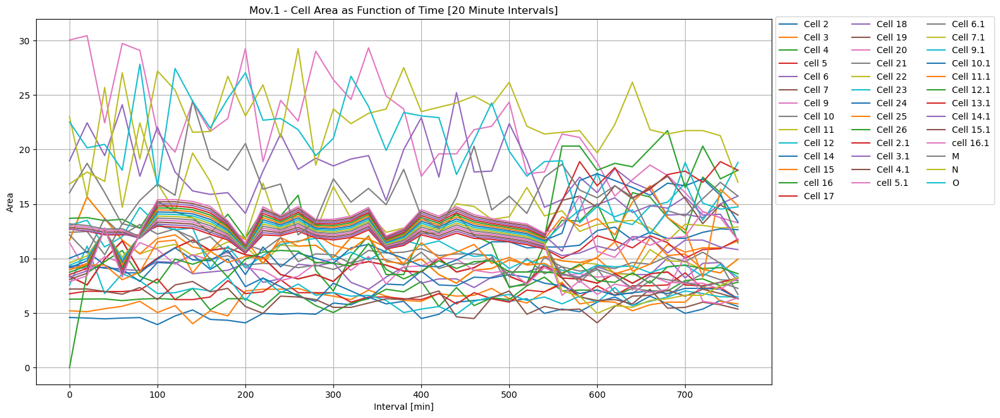

In [10]:
display(area_imputation_df.title)
# plot area_imputation_df for exploratory data analysis
plt.figure(figsize=(15, 7.5))
for col in area_imputation_df.columns: 
    plt.plot(area_imputation_df.index, area_imputation_df[col], label=col)
plt.title('Mov.1 - Cell Area as Function of Time [20 Minute Intervals]')
plt.xlabel('Interval [min]')
plt.ylabel('Area')
plt.legend(loc='center left', bbox_to_anchor=(1,0.75), ncol=3)
plt.grid(True)
plt.show()

In [11]:
delta_imputation_df

,Cell 2,Cell 3,Cell 4,cell 5,Cell 6,Cell 7,Cell 9,Cell 10,Cell 11,Cell 12,Cell 14,Cell 15,cell 16,Cell 17,Cell 18,Cell 19,Cell 20,Cell 21,Cell 22,Cell 23,Cell 24,Cell 25,Cell 26,Cell 2.1,Cell 3.1,Cell 4.1,cell 5.1,Cell 6.1,Cell 7.1,Cell 9.1,Cell 10.1,Cell 11.1,Cell 12.1,Cell 13.1,Cell 14.1,Cell 15.1,cell 16.1,M,N,O
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.158100,-0.21750,-1.976200,-0.553333,-0.316333,0.296425,-1.047363,-0.306312,-0.118563,-0.069163,0.276675,-0.118563,-0.118575,0.296425,-0.38535,-0.098800,-0.197612,-0.01975,-0.741062,-0.494038,-0.02965,0.207488,0.191971,-0.249197,0.138963,0.176710,0.214457,0.252204,0.449499,0.500993,0.552488,0.603983,0.655478,0.706973,0.758468,0.809963,0.861457,0.395225,0.602737,-0.069175
20,0.098800,-0.26880,-0.474300,-0.039525,-0.197750,-0.790500,0.395200,0.079000,3.952400,3.557100,0.411040,3.952400,0.252940,-0.790500,3.47800,-0.015800,-2.766600,-1.66000,-7.351300,0.474300,0.63230,0.395200,-0.049400,-0.315928,-0.004317,0.013618,0.031553,0.049488,0.640216,0.627503,0.614790,0.602077,0.589364,0.576651,0.563938,0.551226,0.538513,2.687600,1.106700,-2.371400
40,0.031620,0.15800,-0.316200,-0.268760,-0.031600,2.371400,-7.983700,-2.134200,-1.976200,-4.347500,-0.079050,-1.976200,-0.158100,2.371400,-3.00370,-0.289833,1.501900,3.16200,10.038800,-2.450400,-1.26470,0.000000,1.027600,-0.495080,-0.216651,-0.212812,-0.208972,-0.205133,2.296262,2.558310,2.820359,3.082408,3.344456,3.606505,3.868554,4.130602,4.392651,-2.687600,-0.869500,0.316200
60,0.171267,0.15800,-0.434775,-0.197617,-0.316167,1.660000,7.272300,2.845600,-1.976200,1.818000,0.045171,-1.976200,0.237143,1.660000,4.66370,-0.338771,-0.632400,-1.50200,-10.987400,0.948500,-0.71140,-1.343800,1.027600,-0.133484,0.072086,0.093950,0.115814,0.137678,-2.414829,-2.676877,-2.938924,-3.200972,-3.463020,-3.725068,-3.987116,-4.249164,-4.511211,-2.924700,9.959800,-2.371400
80,0.135514,0.13825,-0.063240,-0.011300,-0.225857,-2.766600,-0.632400,-0.395200,-1.264700,-0.632300,-0.059288,-1.264700,0.138325,-2.766600,-6.56080,-0.098812,1.897100,0.94900,7.746500,2.687600,0.00000,0.711400,-2.371400,-0.125008,0.046675,0.058675,0.070674,0.082674,1.914534,2.188216,2.461898,2.735580,3.009262,3.282944,3.556626,3.830308,4.103991,2.213300,-7.904600,9.722700
100,0.128450,-1.02800,-0.092233,-0.158100,-0.029625,1.185700,-7.509400,0.237100,0.553300,-1.185700,1.739000,1.422800,2.450400,1.185700,4.50560,-1.106600,-0.632400,-0.87000,-5.533200,-1.580900,1.26470,2.766600,-0.632400,-0.057275,1.293046,1.433638,1.574229,1.714821,1.855412,1.996004,2.136595,2.277187,2.417778,2.558370,2.698961,2.839553,2.980144,1.501800,8.062700,-11.224600
120,0.790500,0.63200,-0.225857,-1.897100,-0.079000,0.948500,-1.818000,-0.395200,0.316200,0.079000,-0.079000,0.316200,-0.948500,0.948500,-4.11040,1.343700,-1.343800,0.47400,-2.608500,-0.474300,1.02760,0.158100,2.213300,-0.093616,-0.085152,-0.076688,-0.068224,-0.059760,-0.051295,-0.042831,-0.034367,-0.025903,-0.017439,-0.008975,-0.000511,0.007954,0.016418,-1.027600,-1.739000,10.829300
140,0.553300,-1.66000,-0.276663,0.000000,-1.028000,0.711400,4.584600,-0.711400,-1.027600,0.395300,0.790500,-1.106600,-0.553400,0.711400,-1.73900,0.316200,0.869600,-1.26400,5.375100,0.158100,-1.10660,-3.003700,-0.474300,-0.093440,-0.099098,-0.104756,-0.110415,-0.116073,-0.121731,-0.127390,-0.133048,-0.138706,-0.144365,-0.150023,-0.155681,-0.161340,-0.166998,8.695100,-3.873300,-3.003700
160,-0.869500,1.18600,-1.976200,0.237100,0.158000,-0.948500,-2.687500,-1.976200,0.474300,-0.237200,-1.343800,-0.316200,-1.422800,-0.948500,-0.31620,-0.948500,-0.474300,0.55300,-2.608500,-3.715200,-0.07910,1.976100,0.553400,-0.560536,-0.552945,-0.545353,-0.537762,-0.530170,-0.522579,-0.514988,-0.507396,-0.499805,-0.492213,-0.484622,-0.477030,-0.469439,-0.461848,-5.296100,0.079100,-2.450500


'Delta of Area for Mov. 1'

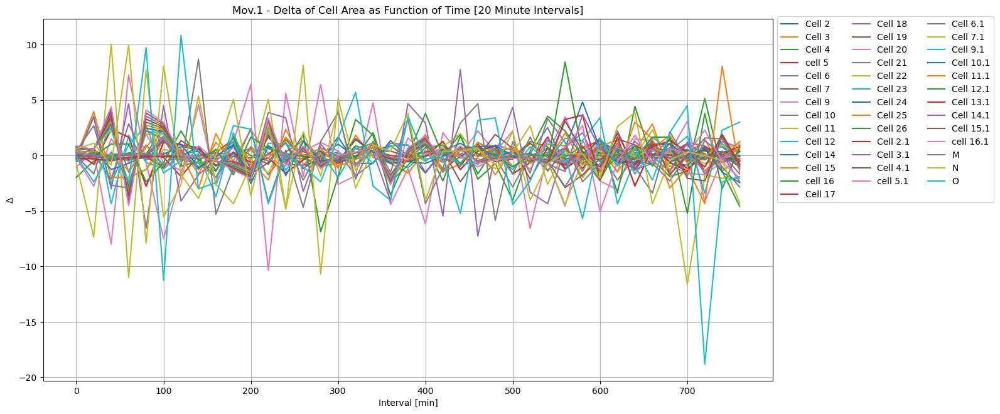

In [12]:
display(delta_imputation_df.title)
# plot delta_imputation_df for exploratory data analysis
plt.figure(figsize=(15, 7.5))
for col in delta_imputation_df.columns: 
    plt.plot(delta_imputation_df.index, delta_imputation_df[col], label=col)
plt.title('Mov.1 - Delta of Cell Area as Function of Time [20 Minute Intervals]')
plt.xlabel('Interval [min]')
plt.ylabel('Δ')
plt.legend(loc='center left', bbox_to_anchor=(1,0.75), ncol=3)
plt.grid(True)
plt.show()

In [13]:
# Mov. 2 Cell Data Extraction
 
# read excel file
sheet_2_raw_df = pd.read_excel(file_path, sheet_name='Mov.2', header = 1)
sheet_2_raw_df.head()

,Slice,Time,Time (20 minutes),P,R,S,T,U,W,V,Y,Z,X,Cell 1,Cell 2,Cell 3,Cell 4,Cell 5,Cell C1,Cell C2,Cell C3,Cell C4,Cell C5,Cell 11,Cell 12,Cell 13,Cell 14,15 (purple),15 (white),Cell 16,Cell 17,Cell 18,Cell 22,Cell 23,Cell 32,Cell 33,Cell 34,Cell 36
0,1,23:00:00,0,11.7779,9.5646,11.2246,7.7465,6.798,9.4065,No data,12.8055,9.1694,9.2484,19.094811,28.168792,No data,19.173715,No data,7.924739,7.297036,9.886307,17.183344,11.612488,25.8481,12.4103,13.9912,9.9598,17.9435,12.6474,15.8883,No data,11.936,23.5558,20.1568,No data,No data,24.3462,32.567
1,2,23:20:00,20,11.4617,9.3275,11.4617,7.0351,7.7465,11.3827,8.3789,12.015,9.4855,9.8808,21.935362,22.250978,No data,13.098094,No data,10.121696,5.021616,12.083265,12.946355,13.966371,17.6273,11.8569,16.4416,13.5959,14.4655,17.3902,18.892,No data,12.3312,23.872,24.5834,No data,No data,28.6147,26.7176
2,3,23:40:00,40,10.9084,8.3789,9.6436,9.2484,6.5608,11.3827,8.2999,10.9874,10.197,8.8532,19.331524,31.561672,No data,14.123848,8.600555,6.277021,5.41393,11.926339,9.807845,10.121696,21.0263,13.5169,19.9196,18.4968,14.7816,11.3827,18.9711,No data,13.9121,21.0263,16.2835,No data,No data,24.1881,21.5006
3,4,"1 day, 0:00:00",60,11.8569,9.7227,12.5683,7.4303,8.0627,9.7227,7.4303,12.4103,10.276,10.0389,21.304128,24.144679,4.576442,16.333165,7.811514,6.433946,7.375499,12.24019,11.612488,13.338669,20.7892,15.8883,17.4692,19.7616,13.9912,14.5445,19.9987,No data,12.0941,22.7653,18.4178,No data,No data,26.4805,33.0413
4,5,"1 day, 0:20:00",80,10.8293,9.4855,10.5922,7.0351,6.0075,9.9598,5.7704,11.2246,9.8808,9.6436,19.804949,28.168792,3.156167,16.885494,8.442747,8.630903,7.297036,9.10168,10.749398,10.984786,20.8682,16.1254,18.734,11.7779,11.7779,15.0978,19.5244,No data,10.5922,32.2509,16.5207,No data,No data,26.2433,36.7565


In [14]:
area_data_mov2_df = sheet_2_raw_df[:42].copy() 
delta_data_mov2_df = sheet_2_raw_df[47:92].copy()

In [15]:
# replace non-standard NaN values with np.nan
area_data_mov2_df.replace(['NaN', 'No data', 'N/A'], np.nan, inplace=True)
delta_data_mov2_df.replace(['NaN', 'No data', 'N/A'], np.nan, inplace=True)

/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/1895820135.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  area_data_mov2_df.replace(['NaN', 'No data', 'N/A'], np.nan, inplace=True)
/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/1895820135.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  delta_data_mov2_df.replace(['NaN', 'No data', 'N/A'], np.nan, inplace=True)


In [16]:
# define function to apply rolling window imputations 
def rolling_window_imputation(series, window_size): 
    series = series.astype(float)
    rolling_mean = series.rolling(window=window_size, min_periods=1, center=True).mean()
    return series.fillna(rolling_mean)

# apply rolling window imputation to the numeric (float64 value) columns only
area_numeric_mov2_cols = [col for col in area_data_mov2_df.columns if col not in ['Slice', 'Time', 'Time (20 minutes)']]
area_imputation_mov2_df = area_data_mov2_df[area_numeric_mov2_cols].apply(lambda col: rolling_window_imputation(col, window_size))

delta_numeric_mov2_cols = [col for col in delta_data_mov2_df.columns if col not in ['Slice', 'Time', 'Time (20 minutes)']]
delta_imputation_mov2_df = delta_data_mov2_df[delta_numeric_mov2_cols].apply(lambda col: rolling_window_imputation(col, window_size))

In [17]:
# re-insert back the original 'Time (20 minute)' column for both dataframes
area_imputation_mov2_df.insert(0, 'Interval [min]', area_data_mov2_df['Time (20 minutes)'])
delta_imputation_mov2_df.insert(0, 'Interval [min]', delta_data_mov2_df['Time (20 minutes)'])

In [18]:
# add title attribute for dataframes
area_imputation_mov2_df.title = "Cell Area for Mov. 2"
delta_imputation_mov2_df.title = "Delta of Area for Mov. 2"

In [19]:
# drop Cell 17, Cell 32, Cell 33,  due to excess 'NaN' values
area_imputation_mov2_df.drop(columns=['Cell 17', 'Cell 32', 'Cell 33'], axis=1, inplace=True)
delta_imputation_mov2_df.drop(columns=['Cell 17', 'Cell 32', 'Cell 33'], axis=1, inplace=True)

In [20]:
# set the 'Interval [min]' as the defacto time series index now and overwrite the original numerical index
area_imputation_mov2_df.set_index('Interval [min]', inplace=True)
delta_imputation_mov2_df.set_index('Interval [min]', inplace=True)

In [21]:
area_imputation_mov2_df

,P,R,S,T,U,W,V,Y,Z,X,Cell 1,Cell 2,Cell 3,Cell 4,Cell 5,Cell C1,Cell C2,Cell C3,Cell C4,Cell C5,Cell 11,Cell 12,Cell 13,Cell 14,15 (purple),15 (white),Cell 16,Cell 18,Cell 22,Cell 23,Cell 34,Cell 36
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,11.7779,9.5646,11.2246,7.7465,6.7980,9.4065,7.884862,12.8055,9.1694,9.2484,19.094811,28.168792,5.220826,19.173715,7.924234,7.924739,7.297036,9.886307,17.183344,11.612488,25.8481,12.4103,13.9912,9.9598,17.9435,12.6474,15.8883,11.936000,23.5558,20.1568,24.3462,32.5670
20,11.4617,9.3275,11.4617,7.0351,7.7465,11.3827,8.378900,12.0150,9.4855,9.8808,21.935362,22.250978,5.376756,13.098094,7.742473,10.121696,5.021616,12.083265,12.946355,13.966371,17.6273,11.8569,16.4416,13.5959,14.4655,17.3902,18.8920,12.331200,23.8720,24.5834,28.6147,26.7176
40,10.9084,8.3789,9.6436,9.2484,6.5608,11.3827,8.299900,10.9874,10.1970,8.8532,19.331524,31.561672,5.592334,14.123848,8.600555,6.277021,5.413930,11.926339,9.807845,10.121696,21.0263,13.5169,19.9196,18.4968,14.7816,11.3827,18.9711,13.912100,21.0263,16.2835,24.1881,21.5006
60,11.8569,9.7227,12.5683,7.4303,8.0627,9.7227,7.430300,12.4103,10.2760,10.0389,21.304128,24.144679,4.576442,16.333165,7.811514,6.433946,7.375499,12.240190,11.612488,13.338669,20.7892,15.8883,17.4692,19.7616,13.9912,14.5445,19.9987,12.094100,22.7653,18.4178,26.4805,33.0413
80,10.8293,9.4855,10.5922,7.0351,6.0075,9.9598,5.770400,11.2246,9.8808,9.6436,19.804949,28.168792,3.156167,16.885494,8.442747,8.630903,7.297036,9.101680,10.749398,10.984786,20.8682,16.1254,18.7340,11.7779,11.7779,15.0978,19.5244,10.592200,32.2509,16.5207,26.2433,36.7565
100,10.3551,9.9598,9.6436,7.6675,6.5608,8.9322,7.825600,12.4103,11.2246,8.4579,18.226865,23.276733,7.259184,17.990153,9.073981,7.846276,9.180143,12.004802,10.906323,11.377100,26.6386,12.3312,15.8092,16.5207,14.6236,14.7026,14.7026,11.382700,23.8720,18.5759,17.2321,26.8757
120,10.4341,9.8808,10.7503,9.0903,7.7465,9.8808,8.932200,10.9874,9.6436,8.2208,25.880571,19.331524,4.892059,18.384674,6.154526,8.160127,10.200158,7.532425,13.809445,14.358685,25.8481,10.1179,15.2559,13.5959,17.5483,12.0941,16.4416,12.252200,27.6662,21.1053,36.3613,28.2195
140,12.0150,7.6675,11.0665,8.5370,7.1932,10.9874,8.616000,13.9121,9.0903,7.4303,18.542482,19.173715,6.706855,16.569878,7.180280,5.806244,5.021616,9.886307,14.829461,18.752599,24.8996,10.0389,15.4931,12.9636,15.7302,12.8055,16.9949,8.062700,25.2157,19.8406,27.1919,22.3701
160,10.6712,11.6988,9.5646,7.5884,5.8494,12.4103,7.825600,12.6474,9.8808,8.0627,24.854816,22.882212,4.734251,18.147961,8.206035,10.592472,6.433946,15.300238,14.515610,18.674136,21.5796,12.7264,14.7816,13.7540,13.5959,13.9121,12.0941,8.220800,26.5595,18.7340,22.4491,25.1367


'Cell Area for Mov. 2'

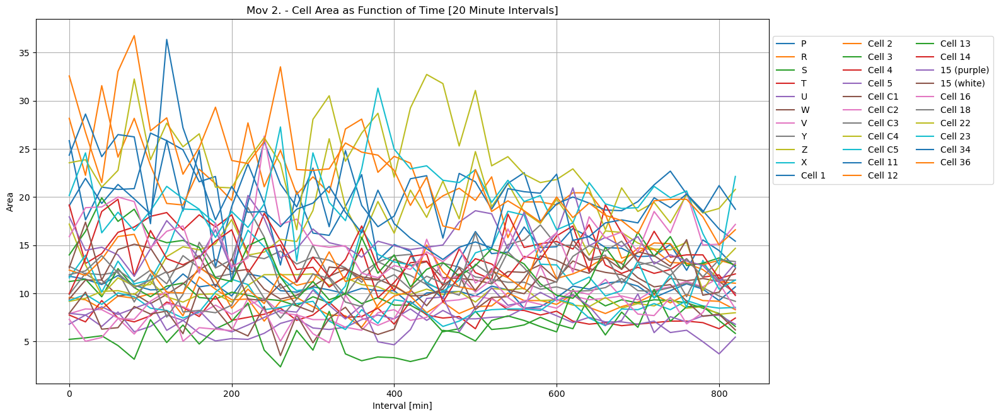

In [22]:
display(area_imputation_mov2_df.title)
# plot area_imputation_mov2_df for exploratory data analysis
plt.figure(figsize=(15, 7.5))
for col in area_imputation_mov2_df.columns: 
    plt.plot(area_imputation_mov2_df.index, area_imputation_mov2_df[col], label=col)
plt.title('Mov 2. - Cell Area as Function of Time [20 Minute Intervals]')
plt.xlabel('Interval [min]')
plt.ylabel('Area')
plt.legend(loc='center left', bbox_to_anchor=(1,0.75), ncol=3)
plt.grid(True)
plt.show()

In [23]:
delta_imputation_mov2_df

,P,R,S,T,U,W,V,Y,Z,X,Cell 1,Cell 2,Cell 3,Cell 4,Cell 5,Cell C1,Cell C2,Cell C3,Cell C4,Cell C5,Cell 11,Cell 12,Cell 13,Cell 14,15 (purple),15 (white),Cell 16,Cell 18,Cell 22,Cell 23,Cell 34,Cell 36
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,-0.316200,-0.237100,0.237100,-0.711400,0.948500,1.976200,0.049400,-0.79050,0.316100,0.632400,2.840550,-5.917813,0.289315,-6.075622,-0.304345,2.196957,-2.275420,2.196957,-4.236989,2.353883,-8.220800,-0.5534,2.450400,3.63610,-3.478000,4.742800,3.00370,0.3952,0.316200,4.4266,4.268500,-5.849400
20,-0.553300,-0.948600,-1.818100,2.213300,-1.185700,0.000000,-0.079000,-1.02760,0.711500,-1.027600,-2.603838,9.310693,0.360705,1.025754,-0.325480,-3.844675,0.392314,-0.156926,-3.138510,-3.844675,3.399000,1.6600,3.478000,4.90090,0.316100,-6.007500,0.07910,1.5809,-2.845700,-8.2999,-4.426600,-5.217000
40,0.948500,1.343800,2.924700,-1.818100,1.501900,-1.660000,-0.869600,1.42290,0.079000,1.185700,1.972604,-7.416993,0.552329,2.209317,-0.789042,0.156926,1.961569,0.313851,1.804643,3.216973,-0.237100,2.3714,-2.450400,1.26480,-0.790400,3.161800,1.02760,-1.8180,1.739000,2.1343,2.292400,11.540700
60,-1.027600,-0.237200,-1.976100,-0.395200,-2.055200,0.237100,-1.659900,-1.18570,-0.395200,-0.395300,-1.499179,4.024113,-1.420275,0.552329,0.631233,2.196957,-0.078463,-3.138510,-0.863090,-2.353883,0.079000,0.2371,1.264800,-7.98370,-2.213300,0.553300,-0.47430,-1.5019,9.485600,-1.8971,-0.237200,3.715200
80,-0.474200,0.474300,-0.948600,0.632400,0.553300,-1.027600,2.055200,1.18570,1.343800,-1.185700,-1.578084,-4.892059,4.103017,1.104659,0.631233,-0.784628,1.883106,2.903122,0.156926,0.392314,5.770400,-3.7942,-2.924800,4.74280,2.845700,-0.395200,-4.82180,0.7905,-8.378900,2.0552,-9.011200,-9.880800
100,0.079000,-0.079000,1.106700,1.422800,1.185700,0.948600,1.106600,-1.42290,-1.581000,-0.237100,7.653705,-3.945209,-2.367125,0.394521,-2.919455,0.313851,1.020016,-4.472377,2.903122,2.981585,-0.790500,-2.2133,-0.553300,-2.92480,2.924700,-2.608500,1.73900,0.8695,3.794200,2.5294,19.129200,1.343800
120,1.580900,-2.213300,0.316200,-0.553300,-0.553300,1.106600,-0.316200,2.92470,-0.553300,-0.790500,-7.338089,-0.157808,1.814796,-1.814796,1.025754,-2.353883,-5.178542,2.353883,1.020016,4.393914,-0.948500,-0.0790,0.237200,-0.63230,-1.818100,0.711400,0.55330,-4.1895,-2.450500,-1.2647,-9.169400,-5.849400
140,-1.343800,4.031300,-1.501900,-0.948600,-1.343800,1.422900,-0.790400,-1.26470,0.790500,0.632400,6.312334,3.708496,-1.972604,1.578084,1.025754,4.786228,1.412330,5.413930,-0.313851,-0.078463,-3.320000,2.6875,-0.711500,0.79040,-2.134300,1.106600,-4.90080,0.1581,1.343800,-1.1066,-4.742800,2.766600
160,0.237200,-1.264700,-0.158100,2.134300,-0.790400,1.106600,0.948500,-0.94860,0.079000,2.055200,-12.151244,-1.499179,1.578084,-1.262467,-1.735892,-2.196957,-0.156926,-2.667734,0.627702,-1.412330,0.553300,-1.2647,-3.161800,1.66000,3.003800,-3.240900,5.21700,-0.2371,-5.533200,-2.9248,-4.821800,4.189400


'Delta of Area for Mov. 2'

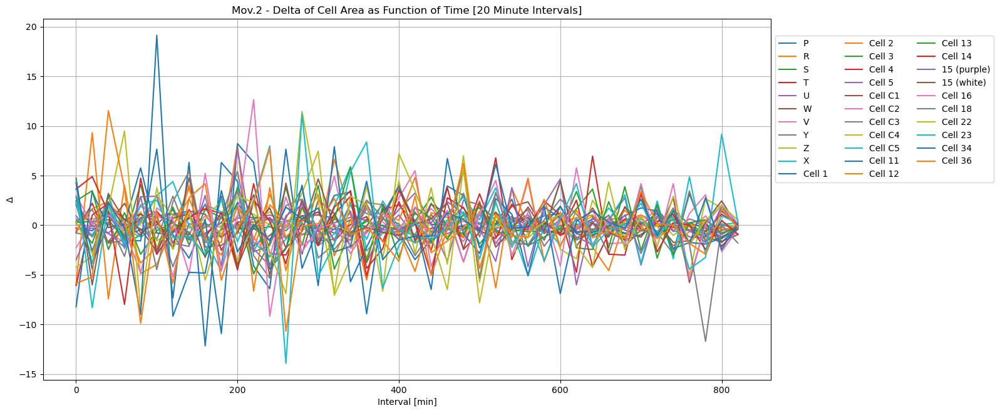

In [24]:
display(delta_imputation_mov2_df.title)
# plot delta_imputation_mov2_df for exploratory data analysis
plt.figure(figsize=(15, 7.5))
for col in delta_imputation_mov2_df.columns: 
    plt.plot(delta_imputation_mov2_df.index, delta_imputation_mov2_df[col], label=col)
plt.title('Mov.2 - Delta of Cell Area as Function of Time [20 Minute Intervals]')
plt.xlabel('Interval [min]')
plt.ylabel('Δ')
plt.legend(loc='center left', bbox_to_anchor=(1,0.75), ncol=3)
plt.grid(True)
plt.show()

In [25]:
# Mov. 3 Cell Data Extraction
 
# read excel file
sheet_3_raw_df = pd.read_excel(file_path, sheet_name='Mov. 3', header=1)
sheet_3_raw_df.head()

,Slice,Time,Time (20 minutes),Cell 1,Cell 2,Cell 3,Cell 4,Cell 5,Cell 6,Cell 7,Cell 8,Cell 9,Cell 10,Cell 11,Cell 12,Cell 13,Cell 14,Cell 15,Cell 21,Cell 22,Cell 23,Cell 24,Cell 25,Cell 26,Cell 27,Cell 28,Cell 29,Cell 30,Cell 31,Cell 32,Cell 33,Cell 34,Cell 35,Cell 36,Cell 37,Cell 38,Cell 39,Cell 40,Cell 41,Cell 42,Cell 43,Cell 44,Cell 45,Cell 46,Cell 47,Cell 48,Cell 49,Cell 50,Cell 51,Cell 52,Cell 53,Cell 54,Cell 55,Cell 56,Cell 57,Cell 58
0,1,20:40:00,0,11.773,6.156,10.388,19.314,22.93,12.6962,13.4657,26.7774,21.622,28.6241,12.542,4.463,10.465,9.541,21.006,19.3136,55.9402,30.6247,32.6254,50.0922,34.3951,19.7753,39.9353,37.2422,21.9298,18.6211,No data,No data,19.4675,No data,No data,15.6971,23.1609,15.6202,29.7783,20.16,28.9319,21.3912,23.4687,13.8504,26.008,29.7014,18.1594,16.6974,23.3148,20.6986,17.6977,25.3154,21.4681,31.9328,15.6971,33.8565,No data
1,2,21:00:00,20,4.925,10.003,7.387,24.084,28.086,10.9264,15.9279,31.3173,19.6214,35.4724,15.697,10.926,8.464,14.697,21.083,30.9325,49.7075,25.6232,38.935,44.706,36.2419,30.0092,40.0892,30.7786,15.7741,22.3915,No data,No data,18.0055,No data,No data,13.8504,16.3896,19.6214,30.3939,24.546,29.3167,18.9289,19.0058,13.4657,25.0846,33.164,18.4672,12.5423,25.8541,22.2376,24.546,25.4693,20.4678,32.0098,18.5441,32.3945,No data
2,3,21:20:00,40,12.465,9.234,7.387,19.544,25.777,9.8492,13.5426,21.1603,18.4672,31.6251,10.926,10.08,8.156,19.16,14.312,23.6226,41.859,28.855,28.778,41.5512,40.1661,26.9313,34.3182,28.5472,21.6989,22.2376,No data,No data,18.698,No data,No data,15.6202,18.775,17.7747,31.6251,19.6214,25.5463,23.3148,19.9292,11.8498,23.6996,32.6254,19.1597,16.3896,20.4678,19.3905,16.6205,26.0849,25.931,26.2388,22.6223,34.4721,No data
3,4,21:40:00,60,10.849,11.08,10.08,19.852,26.777,9.3875,16.9283,26.8544,19.3136,29.2397,9.772,12.388,5.309,11.311,16.159,24.2382,28.7011,29.6244,26.3157,39.1658,46.091,33.0101,26.2388,40.0892,24.6229,27.6238,No data,No data,20.6986,No data,No data,16.6974,14.2351,20.6217,24.3151,24.7768,28.2394,20.7756,16.6205,14.0812,27.0083,25.931,20.0061,15.2354,17.9286,14.0043,18.5441,20.5447,27.393,26.008,18.775,32.0867,No data
4,5,22:00:00,80,8.31,9.695,8.31,13.081,24.546,9.4644,15.3124,29.5475,20.8525,22.7762,11.927,11.311,6.31,9.541,18.313,28.9319,38.3964,20.3139,31.3942,33.9335,40.5509,27.393,31.0095,45.2446,20.16,20.8525,No data,No data,18.3133,No data,No data,18.8519,17.8516,13.004,25.5463,16.5435,32.6254,19.3136,16.1588,12.0037,21.6989,29.5475,19.8522,16.4666,23.3148,16.0049,18.9289,22.2376,27.0852,26.6235,30.6247,32.7023,No data


In [26]:
# extract the top half of the data representing the cell 'area' measurements & bottom half of the data representing area delta
area_data_mov3_df = sheet_3_raw_df[:49].copy() 
delta_data_mov3_df = sheet_3_raw_df[55:106].copy()

In [27]:
# Replace non-standard NaN values with np.nan
area_data_mov3_df.replace(['NaN', 'No data', 'N/A'], np.nan, inplace=True)
delta_data_mov3_df.replace(['NaN', 'No data', 'N/A'], np.nan, inplace=True)

/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/1453994959.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  area_data_mov3_df.replace(['NaN', 'No data', 'N/A'], np.nan, inplace=True)
/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/1453994959.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  delta_data_mov3_df.replace(['NaN', 'No data', 'N/A'], np.nan, inplace=True)


In [28]:
# define function to apply rolling window imputations 
def rolling_window_imputation(series, window_size): 
    series = series.astype(float)
    rolling_mean = series.rolling(window=window_size, min_periods=1, center=True).mean()
    return series.fillna(rolling_mean)

# apply rolling window imputation to the numeric (float64 value) columns only
area_numeric_mov3_cols = [col for col in area_data_mov3_df.columns if col not in ['Slice', 'Time', 'Time (20 minutes)']]
area_imputation_mov3_df = area_data_mov3_df[area_numeric_mov3_cols].apply(lambda col: rolling_window_imputation(col, window_size))

delta_numeric_mov3_cols = [col for col in delta_data_mov3_df.columns if col not in ['Slice', 'Time', 'Time (20 minutes)']]
delta_imputation_mov3_df = delta_data_mov3_df[delta_numeric_mov3_cols].apply(lambda col: rolling_window_imputation(col, window_size))

In [29]:
# re-insert back the original 'Time (20 minute)' column for both dataframes
area_imputation_mov3_df.insert(0, 'Interval [min]', area_data_mov3_df['Time (20 minutes)'])
delta_imputation_mov3_df.insert(0, 'Interval [min]', delta_data_mov3_df['Time (20 minutes)'])

In [30]:
# add title attribute for dataframes
area_imputation_mov3_df.title = "Cell Area for Mov. 3"
delta_imputation_mov3_df.title = "Delta of Area for Mov. 3"

In [31]:
# drop Cell 32, Cell 33, Cell 35, Cell 36, Cell 58 due to excess 'NaN' values
area_imputation_mov3_df.drop(columns=['Cell 32', 'Cell 33', 'Cell 35', 'Cell 36', 'Cell 58'], axis=1, inplace=True)
delta_imputation_mov3_df.drop(columns=['Cell 32', 'Cell 33', 'Cell 35', 'Cell 36', 'Cell 58'], axis=1, inplace=True)

In [32]:
# set the 'Interval [min]' as the defacto time series index now and overwrite the original numerical index
area_imputation_mov3_df.set_index('Interval [min]', inplace=True)
delta_imputation_mov3_df.set_index('Interval [min]', inplace=True)

In [33]:
area_imputation_mov3_df

,Cell 1,Cell 2,Cell 3,Cell 4,Cell 5,Cell 6,Cell 7,Cell 8,Cell 9,Cell 10,Cell 11,Cell 12,Cell 13,Cell 14,Cell 15,Cell 21,Cell 22,Cell 23,Cell 24,Cell 25,Cell 26,Cell 27,Cell 28,Cell 29,Cell 30,Cell 31,Cell 34,Cell 37,Cell 38,Cell 39,Cell 40,Cell 41,Cell 42,Cell 43,Cell 44,Cell 45,Cell 46,Cell 47,Cell 48,Cell 49,Cell 50,Cell 51,Cell 52,Cell 53,Cell 54,Cell 55,Cell 56,Cell 57
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,11.773,6.156,10.388,19.314,22.930,12.6962,13.4657,26.7774,21.6220,28.6241,12.542,4.463,10.465,9.541,21.006,19.313600,55.9402,30.6247,32.6254,50.0922,34.3951,19.7753,39.9353,37.2422,21.9298,18.6211,19.4675,15.6971,23.1609,15.6202,29.7783,20.1600,28.9319,21.3912,23.46870,13.8504,26.008000,29.7014,18.1594,16.6974,23.3148,20.6986,17.6977,25.3154,21.4681,31.9328,15.6971,33.8565
20,4.925,10.003,7.387,24.084,28.086,10.9264,15.9279,31.3173,19.6214,35.4724,15.697,10.926,8.464,14.697,21.083,30.932500,49.7075,25.6232,38.9350,44.7060,36.2419,30.0092,40.0892,30.7786,15.7741,22.3915,18.0055,13.8504,16.3896,19.6214,30.3939,24.5460,29.3167,18.9289,19.00580,13.4657,25.084600,33.1640,18.4672,12.5423,25.8541,22.2376,24.5460,25.4693,20.4678,32.0098,18.5441,32.3945
40,12.465,9.234,7.387,19.544,25.777,9.8492,13.5426,21.1603,18.4672,31.6251,10.926,10.080,8.156,19.160,14.312,23.622600,41.8590,28.8550,28.7780,41.5512,40.1661,26.9313,34.3182,28.5472,21.6989,22.2376,18.6980,15.6202,18.7750,17.7747,31.6251,19.6214,25.5463,23.3148,19.92920,11.8498,23.699600,32.6254,19.1597,16.3896,20.4678,19.3905,16.6205,26.0849,25.9310,26.2388,22.6223,34.4721
60,10.849,11.080,10.080,19.852,26.777,9.3875,16.9283,26.8544,19.3136,29.2397,9.772,12.388,5.309,11.311,16.159,24.238200,28.7011,29.6244,26.3157,39.1658,46.0910,33.0101,26.2388,40.0892,24.6229,27.6238,20.6986,16.6974,14.2351,20.6217,24.3151,24.7768,28.2394,20.7756,16.62050,14.0812,27.008300,25.9310,20.0061,15.2354,17.9286,14.0043,18.5441,20.5447,27.3930,26.0080,18.7750,32.0867
80,8.310,9.695,8.310,13.081,24.546,9.4644,15.3124,29.5475,20.8525,22.7762,11.927,11.311,6.310,9.541,18.313,28.931900,38.3964,20.3139,31.3942,33.9335,40.5509,27.3930,31.0095,45.2446,20.1600,20.8525,18.3133,18.8519,17.8516,13.0040,25.5463,16.5435,32.6254,19.3136,16.15880,12.0037,21.698900,29.5475,19.8522,16.4666,23.3148,16.0049,18.9289,22.2376,27.0852,26.6235,30.6247,32.7023
100,10.234,7.926,10.773,17.390,18.544,15.8510,12.7731,25.0846,18.3133,26.9313,10.926,4.001,5.925,11.850,15.543,17.851600,39.5506,21.3142,24.0073,45.2446,41.4742,24.6229,24.9307,29.2397,16.7744,18.9289,18.7750,15.0815,16.9283,20.7756,26.3157,22.8531,24.9307,18.6211,22.08370,14.3121,21.698900,29.3167,18.5441,11.3881,17.6977,17.1591,28.0086,18.9289,27.0852,28.9319,27.7777,23.3148
120,12.081,7.387,11.850,15.158,25.469,10.6956,16.3896,29.4705,18.5441,28.9319,12.158,7.772,7.387,10.696,20.853,18.005500,27.3160,24.2382,20.2370,36.0880,39.2428,21.3912,25.6232,34.0873,15.3124,17.7747,16.0049,16.5435,10.4647,20.0831,31.0095,18.0825,29.5475,15.0815,16.31270,13.0040,27.700800,32.1637,20.0061,14.0043,19.7753,18.8519,17.5438,18.6211,23.6226,25.8541,18.0055,29.3167
140,6.387,11.388,10.003,14.928,19.698,9.6183,14.6968,23.2379,13.5426,26.3157,13.158,7.618,4.232,10.157,17.929,22.740287,23.4687,25.7002,19.0058,33.4718,37.0113,18.2363,37.5499,30.2400,12.3884,21.8528,13.2348,11.7728,13.3118,13.0809,26.0080,23.8534,21.4681,12.8501,14.61990,16.4666,22.776200,30.3170,16.3127,11.7728,22.8531,20.5447,12.6192,23.7765,25.8541,29.4705,25.7771,31.2403
160,10.003,9.080,8.926,12.619,17.698,10.5417,15.5432,21.5450,18.6211,23.4687,7.387,10.080,7.233,13.773,15.774,16.158800,32.3945,21.0064,20.2370,33.6257,42.7054,18.6980,30.0861,28.3933,13.4657,23.0070,16.3896,10.6956,12.9270,20.0831,19.7753,18.0825,24.6999,16.8513,24.00730,12.0806,19.159700,23.6996,18.8519,13.5426,21.3142,23.6996,16.9283,17.2360,23.4687,32.3945,29.9322,26.8544


'Cell Area for Mov. 3'

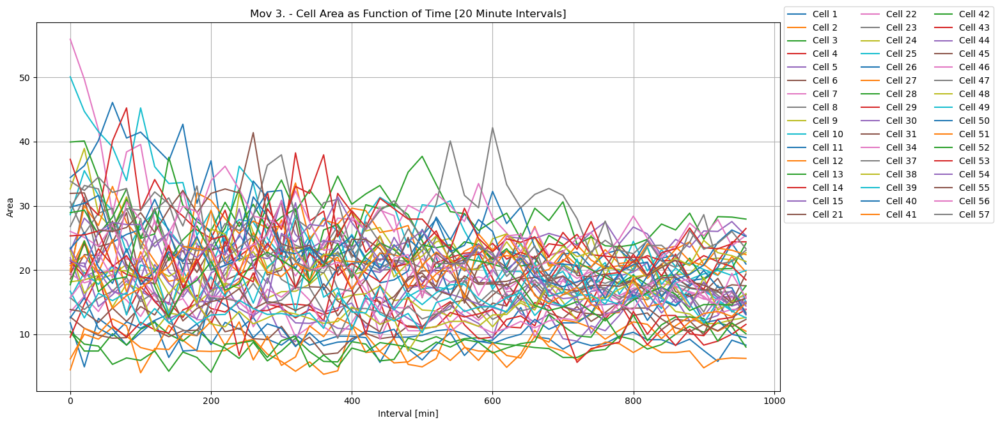

In [34]:
display(area_imputation_mov3_df.title)
# plot area_imputation_mov3_df for exploratory data analysis
plt.figure(figsize=(15, 7.5))
for col in area_imputation_mov3_df.columns: 
    plt.plot(area_imputation_mov3_df.index, area_imputation_mov3_df[col], label=col)
plt.title('Mov 3. - Cell Area as Function of Time [20 Minute Intervals]')
plt.xlabel('Interval [min]')
plt.ylabel('Area')
plt.legend(loc='center left', bbox_to_anchor=(1,0.75), ncol=3)
plt.grid(True)
plt.show()

In [35]:
delta_imputation_mov3_df

,Cell 1,Cell 2,Cell 3,Cell 4,Cell 5,Cell 6,Cell 7,Cell 8,Cell 9,Cell 10,Cell 11,Cell 12,Cell 13,Cell 14,Cell 15,Cell 21,Cell 22,Cell 23,Cell 24,Cell 25,Cell 26,Cell 27,Cell 28,Cell 29,Cell 30,Cell 31,Cell 34,Cell 37,Cell 38,Cell 39,Cell 40,Cell 41,Cell 42,Cell 43,Cell 44,Cell 45,Cell 46,Cell 47,Cell 48,Cell 49,Cell 50,Cell 51,Cell 52,Cell 53,Cell 54,Cell 55,Cell 56,Cell 57
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,-6.848000,3.847000,-3.001000,4.770000,5.15600,-1.769800,2.4622,4.539900,-2.000600,6.8483,3.155000,6.46300,-2.0010,5.156000,0.0770,11.6189,-6.232700,-5.001500,6.309600,-5.386200,1.84680,10.233900,0.153900,-6.463600,-6.1557,3.770400,-1.462000,-1.846700,-6.771300,4.001200,0.6156,4.386000,0.38480,-2.462300,-4.462900,-0.384700,-0.923400,3.462600,0.307800,-4.155100,2.53930,1.53900,6.848300,0.15390,-1.000300,0.077000,2.84700,-1.462000
20,7.540000,-0.769000,0.000000,-4.540000,-2.30900,-1.077200,-2.3853,-10.157000,-1.154200,-3.8473,-4.771000,-0.84600,-0.3080,4.463000,-6.7710,-7.3099,-7.848500,3.231800,-10.157000,-3.154800,3.92420,-3.077900,-5.771000,-2.231400,5.9248,-0.153900,0.692500,1.769800,2.385400,-1.846700,1.2312,-4.924600,-3.77040,4.385900,0.923400,-1.615900,-1.385000,-0.538600,0.692500,3.847300,-5.38630,-2.84710,-7.925500,0.61560,5.463200,-5.771000,4.07820,2.077600
40,-1.616000,1.846000,2.693000,0.308000,1.00000,-0.461700,3.3857,5.694100,0.846400,-2.3854,-1.154000,2.30800,-2.8470,-7.849000,1.8470,0.6156,-13.157900,0.769400,-2.462300,-2.385400,5.92490,6.078800,-8.079400,11.542000,2.9240,5.386200,2.000600,1.077200,-4.539900,2.847000,-7.3100,5.155400,2.69310,-2.539200,-3.308700,2.231400,3.308700,-6.694400,0.846400,-1.154200,-2.53920,-5.38620,1.923600,-5.54020,1.462000,-0.230800,-3.84730,-2.385400
60,-2.539000,-1.385000,-1.770000,-6.771000,-2.23100,0.076900,-1.6159,2.693100,1.538900,-6.4635,2.155000,-1.07700,1.0010,-1.770000,2.1540,4.6937,9.695300,-9.310500,5.078500,-5.232300,-5.54010,-5.617100,4.770700,5.155400,-4.4629,-6.771300,-2.385300,2.154500,3.616500,-7.617700,1.2312,-8.233300,4.38600,-1.462000,-0.461700,-2.077500,-5.309400,3.616500,-0.153900,1.231200,5.38620,2.00060,0.384800,1.69290,-0.307800,0.615500,11.84970,0.615600
80,1.924000,-1.769000,2.463000,4.309000,-6.00200,6.386600,-2.5393,-4.462900,-2.539200,4.1551,-1.001000,-7.31000,-0.3850,2.309000,-2.7700,-11.0803,1.154200,1.000300,-7.386900,11.311100,0.92330,-2.770100,-6.078800,-16.004900,-3.3856,-1.923600,0.461700,-3.770400,-0.923300,7.771600,0.7694,6.309600,-7.69470,-0.692500,5.924900,2.308400,0.000000,-0.230800,-1.308100,-5.078500,-5.61710,1.15420,9.079700,-3.30870,0.000000,2.308400,-2.84700,-9.387500
100,1.847000,-0.539000,1.077000,-2.232000,6.92500,-5.155400,3.6165,4.385900,0.230800,2.0006,1.232000,3.77100,1.4620,-1.154000,5.3100,0.1539,-12.234600,2.924000,-3.770300,-9.156600,-2.23140,-3.231700,0.692500,4.847600,-1.4620,-1.154200,-2.770100,1.462000,-6.463600,-0.692500,4.6938,-4.770600,4.61680,-3.539600,-5.771000,-1.308100,6.001900,2.847000,1.462000,2.616200,2.07760,1.69280,-10.464800,-0.30780,-3.462600,-3.077800,-9.77220,6.001900
120,-5.694000,4.001000,-1.847000,-0.230000,-5.77100,-1.077300,-1.6928,-6.232600,-5.001500,-2.6162,1.000000,-0.15400,-3.1550,-0.539000,-2.9240,-18.0055,-3.847300,1.462000,-1.231200,-2.616200,-2.23150,-3.154900,11.926700,-3.847300,-2.9240,4.078100,-2.770100,-4.770700,2.847100,-7.002200,-5.0015,5.770900,-8.07940,-2.231400,-1.692800,3.462600,-4.924600,-1.846700,-3.693400,-2.231500,3.07780,1.69280,-4.924600,5.15540,2.231500,3.616400,7.77160,1.923600
140,3.616000,-2.308000,-1.077000,-2.309000,-2.00000,0.923400,0.8464,-1.692900,5.078500,-2.8470,-5.771000,2.46200,3.0010,3.616000,-2.1550,16.1588,8.925800,-4.693800,1.231200,0.153900,5.69410,0.461700,-7.463800,-1.846700,1.0773,1.154200,3.154800,-1.077200,-0.384800,7.002200,-6.2327,-5.770900,3.23180,4.001200,9.387400,-4.386000,-3.616500,-6.617400,2.539200,1.769800,-1.53890,3.15490,4.309100,-6.54050,-2.385400,2.924000,4.15510,-4.385900
160,1.616000,-1.693000,1.770000,3.46300

'Delta of Area for Mov. 3'

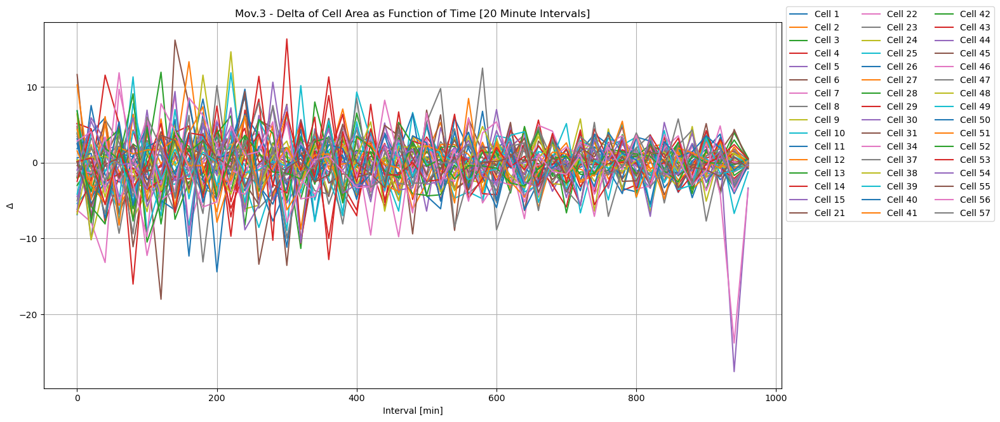

In [36]:
display(delta_imputation_mov3_df.title)
# plot delta_imputation_mov3_df for exploratory data analysis
plt.figure(figsize=(15, 7.5))
for col in delta_imputation_mov3_df.columns: 
    plt.plot(delta_imputation_mov3_df.index, delta_imputation_mov3_df[col], label=col)
plt.title('Mov.3 - Delta of Cell Area as Function of Time [20 Minute Intervals]')
plt.xlabel('Interval [min]')
plt.ylabel('Δ')
plt.legend(loc='center left', bbox_to_anchor=(1,0.75), ncol=3)
plt.grid(True)
plt.show()

In [37]:
# rolling mean stats function 
def rolling_mean(df):
    df_rolling_mean = pd.DataFrame()
    for col in df.columns: 
        df_rolling_mean[col] = df[col].rolling(window=3, min_periods=1).mean()
    return df_rolling_mean

In [38]:
# Mov.1 Rolling Mean Stats results
rolling_mean_area_mov1_results = rolling_mean(area_imputation_df)
rolling_mean_delta_mov1_results = rolling_mean(delta_imputation_df)

In [39]:
# Mov.2 Rolling Mean Stats results
rolling_mean_area_mov2_results = rolling_mean(area_imputation_mov2_df)
rolling_mean_delta_mov2_results = rolling_mean(delta_imputation_mov2_df)

In [40]:
# Mov.3 Rolling Mean Stats results
rolling_mean_area_mov3_results = rolling_mean(area_imputation_mov3_df)
rolling_mean_delta_mov3_results = rolling_mean(delta_imputation_mov3_df)

In [41]:
# rolling median stats function 
def rolling_median(df):
    df_rolling_median = pd.DataFrame()
    for col in df.columns: 
        df_rolling_median[col] = df[col].rolling(window=3, min_periods=1).median()
    return df_rolling_median

In [42]:
# Mov.1 Rolling Median Stats results
rolling_median_area_mov1_results = rolling_median(area_imputation_df)
rolling_median_delta_mov1_results = rolling_median(delta_imputation_df)

In [43]:
# Mov.2 Rolling Median Stats results
rolling_median_area_mov2_results = rolling_median(area_imputation_mov2_df)
rolling_median_delta_mov2_results = rolling_median(delta_imputation_mov2_df)

In [44]:
# Mov.3 Rolling Median Stats results
rolling_median_area_mov3_results = rolling_median(area_imputation_mov3_df)
rolling_median_delta_mov3_results = rolling_median(delta_imputation_mov3_df)

In [45]:
# rolling std. dev stats function 
def rolling_std(df):
    df_rolling_std = pd.DataFrame()
    for col in df.columns: 
        df_rolling_std[col] = df[col].rolling(window=3, min_periods=1).std()
    return df_rolling_std

In [46]:
# Mov.1 Rolling Standard Deviation Stats results
rolling_std_area_mov1_results = rolling_std(area_imputation_df)
rolling_std_delta_mov1_results = rolling_std(delta_imputation_df)

In [47]:
# Mov.2 Rolling Standard Deviation Stats results
rolling_std_area_mov2_results = rolling_std(area_imputation_mov2_df)
rolling_std_delta_mov2_results = rolling_std(delta_imputation_mov2_df)

In [48]:
# Mov.3 Rolling Standard Deviation Stats results
rolling_std_area_mov3_results = rolling_std(area_imputation_mov3_df)
rolling_std_delta_mov3_results = rolling_std(delta_imputation_mov3_df)

In [49]:
# plot rolling mean stats function
def plot_rolling_mean_stats(df):
    plt.figure(figsize=(15, 7.5))
    for col in df.columns:
        plt.plot(df.index, df[col], label=col)
    plt.title('Rolling Mean of Cell Area')
    plt.xlabel('Time [min]')
    plt.ylabel('Rolling Mean')
    plt.legend(bbox_to_anchor=(1, 0.75), loc='center left', ncol=3)
    plt.tight_layout()
    plt.show()

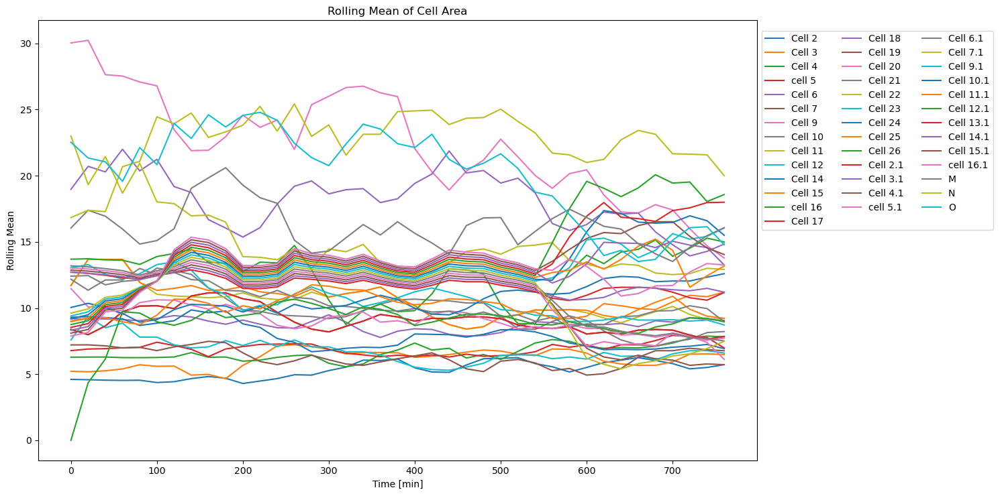

In [50]:
plot_rolling_mean_stats(rolling_mean_area_mov1_results)

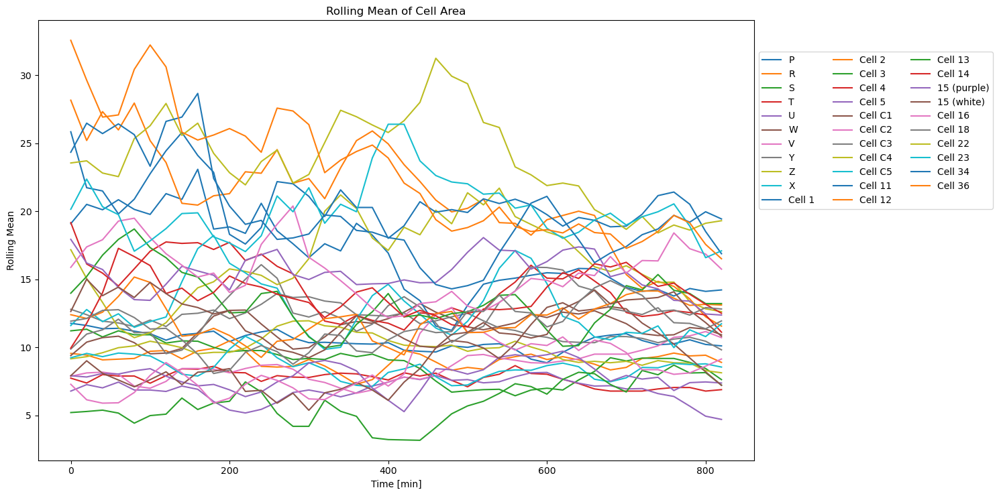

In [51]:
plot_rolling_mean_stats(rolling_mean_area_mov2_results)

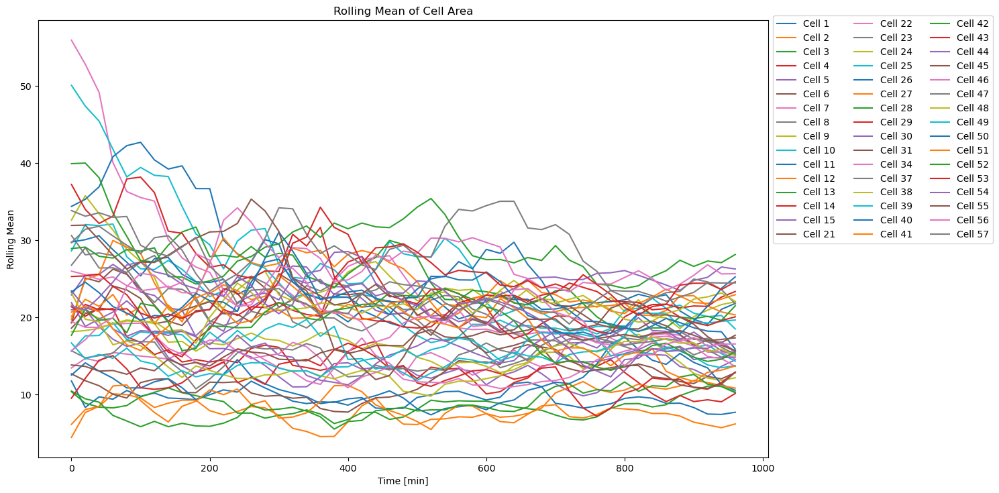

In [52]:
plot_rolling_mean_stats(rolling_mean_area_mov3_results)

### KMeans Clustering Analysis of Rolling Mean Stats Function (Area Trend and Individual Movies)

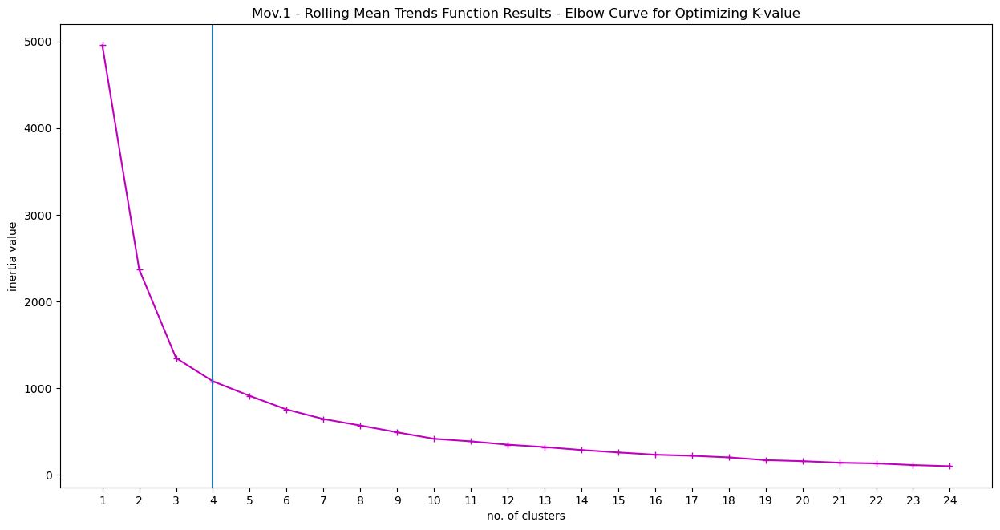

Cell,Cell 2,Cell 3,Cell 4,cell 5,Cell 6,Cell 7,Cell 9,Cell 10,Cell 11,Cell 12,Cell 14,Cell 15,cell 16,Cell 17,Cell 18,Cell 19,Cell 20,Cell 21,Cell 22,Cell 23,Cell 24,Cell 25,Cell 26,Cell 2.1,Cell 3.1,Cell 4.1,cell 5.1,Cell 6.1,Cell 7.1,Cell 9.1,Cell 10.1,Cell 11.1,Cell 12.1,Cell 13.1,Cell 14.1,Cell 15.1,cell 16.1,M,N,O
Cluster,0,0,0,0,3,3,2,3,3,0,0,3,1,3,2,0,3,3,1,3,3,3,3,3,3,3,3,3,3,1,1,1,1,1,1,1,1,1,2,2
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,4.604450,5.217000,6.284200,6.778250,9.189250,8.378900,30.037600,12.410300,11.698800,7.588400,9.295840,11.698800,13.690800,8.378900,18.971100,7.209020,11.461700,12.173000,23.002500,13.042600,10.038900,9.011300,0.000000,12.718065,12.700978,12.862969,13.024960,13.186951,9.612414,9.396629,9.180843,8.965057,8.749271,8.533485,8.317699,8.101913,7.886127,16.046400,16.836800,22.528200
20,4.578755,5.177500,6.290783,6.898795,9.163525,7.983650,30.235200,12.449800,13.675000,9.366950,9.351170,13.675000,13.722417,7.983650,20.710100,7.214293,10.078400,11.343000,19.326850,13.279750,10.355050,9.208900,4.347550,12.617401,12.629753,12.789483,12.949213,13.108942,9.932523,9.710380,9.488238,9.266095,9.043953,8.821811,8.599668,8.377526,8.155384,17.390200,17.390150,21.342500
40,4.545598,5.254667,6.295172,6.926680,9.178683,8.642367,27.639833,11.751567,13.675000,8.510633,9.275509,13.675000,13.642616,8.642367,20.288533,7.139515,10.117933,12.120333,21.447900,12.542000,10.038867,9.274767,6.139267,12.471790,12.511222,12.665948,12.820675,12.975401,10.804646,10.667734,10.530823,10.393911,10.256999,10.120088,9.983176,9.846264,9.709353,16.942267,17.284767,21.052667
60,4.527714,5.393000,6.250372,6.993492,9.119410,9.722667,27.534433,12.015033,13.675000,8.853167,9.180649,13.675000,13.614291,9.722667,22.001200,6.982741,9.485567,12.120333,18.681267,12.199467,9.590933,8.958567,9.722700,12.292323,12.373045,12.524244,12.675443,12.826641,10.978529,10.837380,10.696231,10.555082,10.413933,10.272784,10.131635,9.990486,9.849337,15.967367,20.683767,19.577133
80,4.541549,5.709333,6.245978,7.025108,9.041060,10.144267,27.086500,12.120433,11.935967,7.799233,8.680016,11.935967,13.298113,10.144267,20.367600,7.026652,10.407767,12.990000,20.947233,12.594700,8.932233,8.747767,9.617300,12.176649,12.142823,12.256593,12.370364,12.484134,11.577184,11.527263,11.477342,11.427420,11.377499,11.327578,11.277656,11.227735,11.177814,14.834367,21.079000,22.132967
100,4.365888,5.592667,6.260090,7.411558,9.212393,10.170633,26.796667,13.016267,11.040100,7.799233,8.853154,11.329933,13.889075,10.170633,21.237100,6.778233,10.618533,12.515667,18.022533,13.279767,9.116667,9.459167,8.958567,12.441503,12.438405,12.565861,12.693317,12.820773,12.028890,12.029711,12.030531,12.031352,12.032172,12.032993,12.033813,12.034634,12.035455,15.097833,24.451633,20.841867
120,4.429888,5.612333,6.298294,7.166896,9.423250,9.959833,23.476733,12.831833,10.908367,7.219567,9.037600,11.488033,14.122933,9.959833,19.181900,7.061467,10.592167,12.700000,17.890800,13.490567,9.880767,10.671200,8.695067,12.675454,12.701508,12.843241,12.984974,13.126707,13.268440,13.410173,13.551907,13.693640,13.835373,13.977106,14.118839,14.260572,14.402305,15.993667,23.924667,23.951000
140,4.663733,4.927000,6.627666,6.877067,9.327667,10.908367,21.895800,12.542000,10.855667,6.982433,9.854433,11.698833,14.439100,10.908367,18.733967,7.245900,10.223300,12.146667,16.968600,12.858200,10.276000,10.644867,9.063933,12.881574,13.071106,13.260639,13.450171,13.639703,13.829235,14.018768,14.208300,14.397832,14.587364,14.776897,14.966429,15.155961,15.345493,19.050100,24.741467,22.818000


In [53]:
# Mov.1 - KMeans Clustering Analysis of Rolling Mean Stats Function (Area Trend)
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# elbow curve to determine optimal number of clusters at inflection point
inertia = []
k_cluster_range = range(1,25)
for k in k_cluster_range: 
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=123)
    kmeans.fit(rolling_mean_area_mov1_results)
    inertia.append(kmeans.inertia_)
    
# plot of the inertia elbow curve 
plt.figure(figsize=(15, 7.5))
plt.plot(k_cluster_range, inertia, 'm+-')
plt.axvline(x=4)
plt.xticks(k_cluster_range)
plt.xlabel('no. of clusters')
plt.ylabel('inertia value')
plt.title('Mov.1 - Rolling Mean Trends Function Results - Elbow Curve for Optimizing K-value')
plt.show()

# set optimal_k_value based upon elbow curve inflection point
optimal_k_value = 4
kmeans = KMeans(n_clusters=optimal_k_value, random_state=123, n_init=10)

# transpose the rolling_mean_area_mov1_results dataframe to cluster across cell feature data 
cluster_labels = kmeans.fit_predict(rolling_mean_area_mov1_results.T)

# generate a cell / cluster dataframe separately for quick vertical lookup
cluster_labels_df = pd.DataFrame(cluster_labels, index=rolling_mean_area_mov1_results.columns, columns=['Cluster Labels'])

# create multi-index for columns
new_columns = pd.MultiIndex.from_tuples(
    [(cell, cluster_labels_df.loc[cell, 'Cluster Labels']) for cell in rolling_mean_area_mov1_results.columns],
    names=['Cell', 'Cluster']
)
rolling_mean_area_mov1_results.columns = new_columns
display(rolling_mean_area_mov1_results)

/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/1053415045.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors=plt.cm.get_cmap('tab10', optimal_k_value)


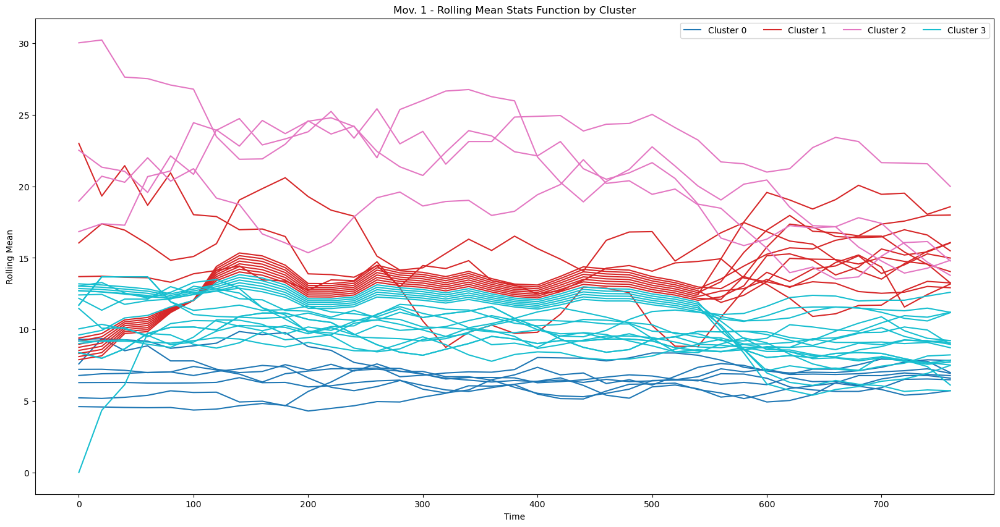

In [54]:
# plot results and color code according to cluster data
plt.figure(figsize=(20, 10))
# create colormap for the x-number of clusters
colors=plt.cm.get_cmap('tab10', optimal_k_value)
for cluster in range(optimal_k_value):
    # return index object of names of cells pertaining to specific cluster number
    cluster_cells = rolling_mean_area_mov1_results.columns.get_level_values('Cell')[rolling_mean_area_mov1_results.columns.get_level_values('Cluster') == cluster]
    for cell in cluster_cells: 
        plt.plot(rolling_mean_area_mov1_results[cell].index, rolling_mean_area_mov1_results[cell], color=colors(cluster), label=f'Cluster {cluster}' if cell == cluster_cells[0] else "")
# plt.legend(ncol=optimal_k_value, bbox_to_anchor=(1, 0.75), loc='center left')
plt.legend(ncol=optimal_k_value)
plt.title('Mov. 1 - Rolling Mean Stats Function by Cluster')
plt.xlabel('Time')
plt.ylabel('Rolling Mean')
plt.show()

In [55]:
print(silhouette_score(rolling_mean_area_mov1_results.T, cluster_labels))

0.43756707130273736


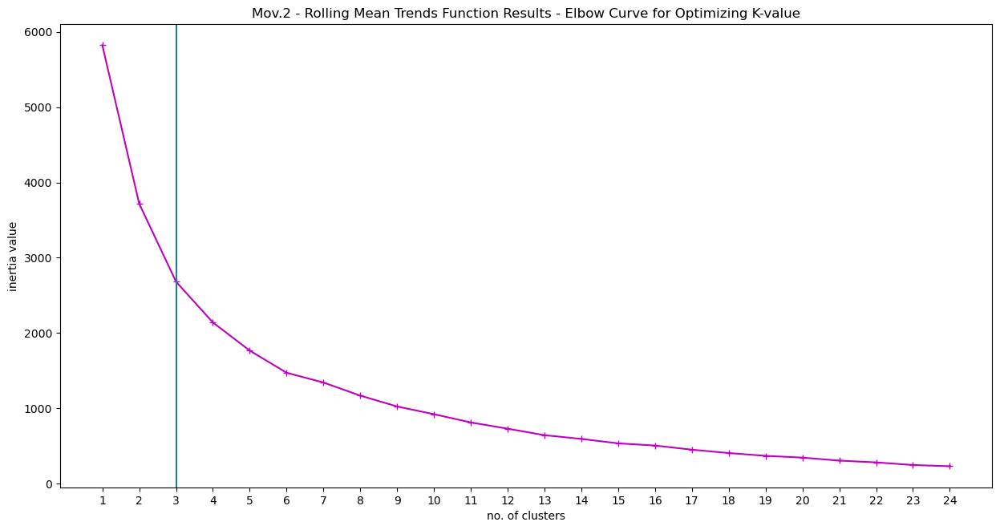

Cell,P,R,S,T,U,W,V,Y,Z,X,Cell 1,Cell 2,Cell 3,Cell 4,Cell 5,Cell C1,Cell C2,Cell C3,Cell C4,Cell C5,Cell 11,Cell 12,Cell 13,Cell 14,15 (purple),15 (white),Cell 16,Cell 18,Cell 22,Cell 23,Cell 34,Cell 36
Cluster,2,2,2,2,2,0,2,0,2,2,0,1,2,0,2,2,2,0,0,0,1,0,0,0,0,0,0,0,1,1,1,1
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,11.777900,9.564600,11.224600,7.746500,6.798000,9.406500,7.884862,12.805500,9.169400,9.248400,19.094811,28.168792,5.220826,19.173715,7.924234,7.924739,7.297036,9.886307,17.183344,11.612488,25.848100,12.410300,13.991200,9.959800,17.943500,12.647400,15.888300,11.936000,23.555800,20.156800,24.346200,32.567000
20,11.619800,9.446050,11.343150,7.390800,7.272250,10.394600,8.131881,12.410250,9.327450,9.564600,20.515086,25.209885,5.298791,16.135905,7.833353,9.023217,6.159326,10.984786,15.064849,12.789429,21.737700,12.133600,15.216400,11.777850,16.204500,15.018800,17.390150,12.133600,23.713900,22.370100,26.480450,29.642300
40,11.382667,9.090333,10.776633,8.010000,7.035100,10.723967,8.187888,11.935967,9.617300,9.327467,20.120566,27.327147,5.396639,15.465219,8.089087,8.107818,5.910861,11.298637,13.312515,11.900185,21.500567,12.594700,16.784133,14.017500,15.730200,13.806767,17.917133,12.726433,22.818033,20.341233,25.716333,26.928400
60,11.409000,9.143033,11.224533,7.904600,7.456667,10.829367,8.036367,11.804233,9.986167,9.590967,20.857005,25.985776,5.181844,14.518369,8.051514,7.610887,5.937015,12.083265,11.455563,12.475578,19.814267,13.754033,17.943467,17.284767,14.412767,14.439133,19.287267,12.779133,22.554533,19.761567,26.427767,27.086500
80,11.198200,9.195700,10.934700,7.904600,6.877000,10.355067,7.166867,11.540767,10.117933,9.511900,20.146867,27.958381,4.441648,15.780836,8.284939,7.113957,6.695489,11.089403,10.723244,11.481717,20.894567,15.176867,18.707600,16.678767,13.516900,13.675000,19.498067,12.199467,25.347500,17.074000,25.637300,30.432800
100,11.013767,9.722667,10.934700,7.377633,6.877000,9.538233,7.008767,12.015067,10.460467,9.380133,19.778647,25.196734,4.997265,17.069604,8.442747,7.637042,7.950893,11.115557,11.089403,11.900185,22.765333,14.781633,17.337467,16.020067,13.464233,14.781633,18.075233,11.356333,26.296067,17.838133,23.318633,32.224500
120,10.539500,9.775367,10.328700,7.930967,6.771600,9.590933,7.509400,11.540767,10.249667,8.774100,21.304128,23.592349,5.102470,17.753440,7.890418,8.212435,8.892446,9.546302,11.821722,12.240190,24.451633,12.858167,16.599700,13.964833,14.649933,13.964833,16.889533,11.409033,27.929700,18.733967,26.612233,30.617233
140,10.934733,9.169367,10.486800,8.431600,7.166833,9.933467,8.457933,12.436600,9.986167,8.036333,20.883306,20.593991,6.286033,17.648235,7.469596,7.270882,8.133973,9.807845,13.181743,14.829461,25.795433,10.829333,15.519400,14.360067,15.967367,13.200733,16.046367,10.565867,25.584633,19.840600,26.928433,25.821767


In [56]:
# Mov.2 - KMeans Clustering Analysis of Rolling Mean Stats Function (Area Trend)
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# elbow curve to determine optimal number of clusters at inflection point
inertia = []
k_cluster_range = range(1,25)
for k in k_cluster_range: 
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=123)
    kmeans.fit(rolling_mean_area_mov2_results)
    inertia.append(kmeans.inertia_)
    
# plot of the inertia elbow curve 
plt.figure(figsize=(15, 7.5))
plt.plot(k_cluster_range, inertia, 'm+-')
plt.axvline(x=3)
plt.xticks(k_cluster_range)
plt.xlabel('no. of clusters')
plt.ylabel('inertia value')
plt.title('Mov.2 - Rolling Mean Trends Function Results - Elbow Curve for Optimizing K-value')
plt.show()

# set optimal_k_value based upon elbow curve inflection point
optimal_k_value = 3 
kmeans = KMeans(n_clusters=optimal_k_value, random_state=123, n_init=10)

# transpose the rolling_mean_area_mov2_results dataframe to cluster across cell feature data 
cluster_labels = kmeans.fit_predict(rolling_mean_area_mov2_results.T)

# generate a cell / cluster dataframe separately for quick vertical lookup
cluster_labels_df = pd.DataFrame(cluster_labels, index=rolling_mean_area_mov2_results.columns, columns=['Cluster Labels'])

# create multi-index for columns
new_columns = pd.MultiIndex.from_tuples(
    [(cell, cluster_labels_df.loc[cell, 'Cluster Labels']) for cell in rolling_mean_area_mov2_results.columns],
    names=['Cell', 'Cluster']
)
rolling_mean_area_mov2_results.columns = new_columns
display(rolling_mean_area_mov2_results)

/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/807709057.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors=plt.cm.get_cmap('tab10', optimal_k_value)


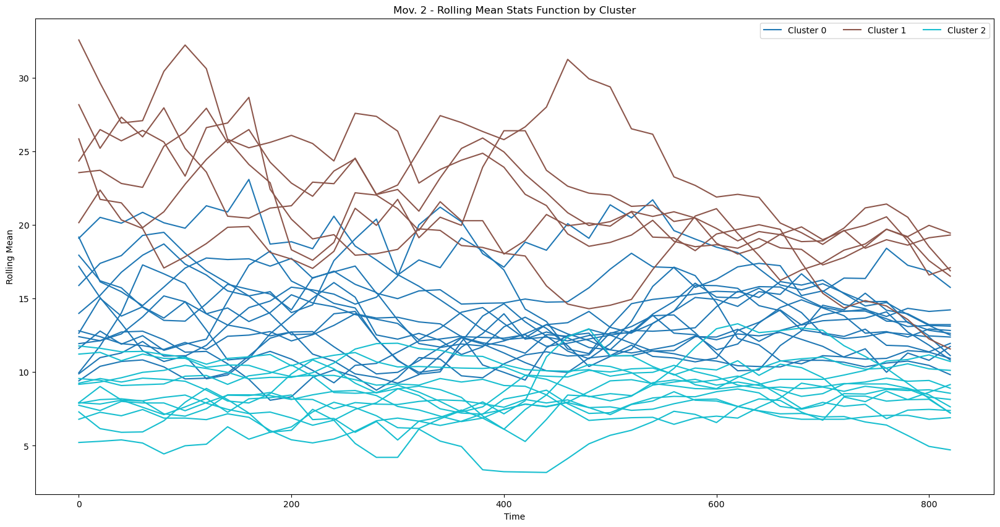

In [57]:
# plot results and color code according to cluster data
plt.figure(figsize=(20, 10))
# create colormap for the x-number of clusters
colors=plt.cm.get_cmap('tab10', optimal_k_value)
for cluster in range(optimal_k_value):
    # return index object of names of cells pertaining to specific cluster number
    cluster_cells = rolling_mean_area_mov2_results.columns.get_level_values('Cell')[rolling_mean_area_mov2_results.columns.get_level_values('Cluster') == cluster]
    for cell in cluster_cells: 
        plt.plot(rolling_mean_area_mov2_results[cell].index, rolling_mean_area_mov2_results[cell], color=colors(cluster), label=f'Cluster {cluster}' if cell == cluster_cells[0] else "")
plt.legend(ncol=optimal_k_value)
plt.title('Mov. 2 - Rolling Mean Stats Function by Cluster')
plt.xlabel('Time')
plt.ylabel('Rolling Mean')
plt.show()

In [58]:
print(silhouette_score(rolling_mean_area_mov2_results.T, cluster_labels))

0.4344747768773026


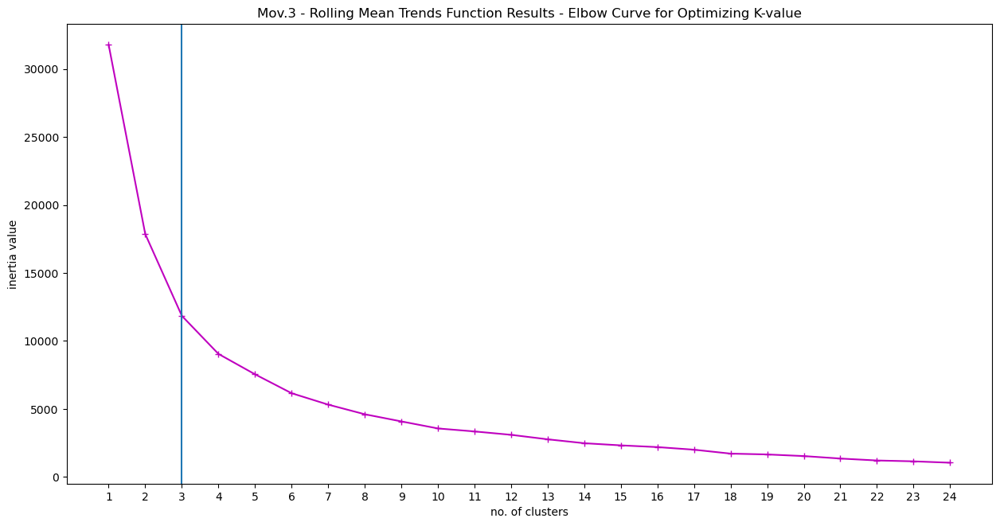

Cell,Cell 1,Cell 2,Cell 3,Cell 4,Cell 5,Cell 6,Cell 7,Cell 8,Cell 9,Cell 10,Cell 11,Cell 12,Cell 13,Cell 14,Cell 15,Cell 21,Cell 22,Cell 23,Cell 24,Cell 25,Cell 26,Cell 27,Cell 28,Cell 29,Cell 30,Cell 31,Cell 34,Cell 37,Cell 38,Cell 39,Cell 40,Cell 41,Cell 42,Cell 43,Cell 44,Cell 45,Cell 46,Cell 47,Cell 48,Cell 49,Cell 50,Cell 51,Cell 52,Cell 53,Cell 54,Cell 55,Cell 56,Cell 57
Cluster,1,1,1,1,1,1,1,0,1,0,1,1,1,1,0,0,2,0,2,2,2,0,2,2,1,0,1,1,1,1,2,0,2,0,0,1,2,2,0,1,0,0,0,0,0,2,0,2
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,11.773000,6.156000,10.388000,19.314000,22.930000,12.696200,13.465700,26.777400,21.622000,28.624100,12.542000,4.463000,10.465000,9.541000,21.006000,19.313600,55.940200,30.624700,32.625400,50.092200,34.395100,19.775300,39.935300,37.242200,21.929800,18.621100,19.467500,15.697100,23.160900,15.620200,29.778300,20.160000,28.931900,21.391200,23.468700,13.850400,26.008000,29.701400,18.159400,16.697400,23.314800,20.698600,17.697700,25.315400,21.468100,31.932800,15.697100,33.856500
20,8.349000,8.079500,8.887500,21.699000,25.508000,11.811300,14.696800,29.047350,20.621700,32.048250,14.119500,7.694500,9.464500,12.119000,21.044500,25.123050,52.823850,28.123950,35.780200,47.399100,35.318500,24.892250,40.012250,34.010400,18.851950,20.506300,18.736500,14.773750,19.775250,17.620800,30.086100,22.353000,29.124300,20.160050,21.237250,13.658050,25.546300,31.432700,18.313300,14.619850,24.584450,21.468100,21.121850,25.392350,20.967950,31.971300,17.120600,33.125500
40,9.721000,8.464333,8.387333,20.980667,25.597667,11.157267,14.312067,26.418333,19.903533,31.907200,13.055000,8.489667,9.028333,14.466000,18.800333,24.622900,49.168900,28.367633,33.446133,45.449800,36.934367,25.571933,38.114233,32.189333,19.800933,21.083400,18.723667,15.055900,19.441833,17.672100,30.599100,21.442467,27.931633,21.211633,20.801233,13.055300,24.930733,31.830267,18.595433,15.209767,23.212233,20.775567,19.621400,25.623200,22.622300,30.060467,18.954500,33.574367
60,9.413000,10.105667,8.284667,21.160000,26.880000,10.054367,15.466267,26.444000,19.134067,32.112400,12.131667,11.131333,7.309667,15.056000,17.184667,26.264433,40.089200,28.034200,31.342900,41.807667,40.833000,29.983533,33.548733,33.138333,20.698633,24.084300,19.134033,15.389333,16.466567,19.339267,28.778033,22.981400,27.700800,21.006433,18.518500,13.132233,25.264167,30.573467,19.211000,14.722433,21.416833,18.544133,19.903533,24.032967,24.597267,28.085533,19.980467,32.984433
80,10.541333,10.003000,8.592333,17.492333,25.700000,9.567033,15.261100,25.854067,19.544433,27.880333,10.875000,11.259667,6.591667,13.337333,16.261333,25.597567,36.318833,26.264433,28.829300,38.216833,42.269333,29.111467,30.522167,37.960333,22.160600,23.571300,19.236633,17.056500,16.953900,17.133467,27.162167,20.313900,28.803700,21.134667,17.569500,12.644900,24.135600,29.367967,19.672667,16.030533,20.570400,16.466567,18.031167,22.955733,26.803067,26.290100,24.007333,33.087033
100,9.797667,9.567000,9.721000,16.774333,23.289000,11.567633,15.004600,27.162167,19.493133,26.315733,10.875000,9.233333,5.848000,10.900667,16.671667,23.673900,35.549367,23.750833,27.239067,39.447967,42.705367,28.342000,27.393000,38.191167,20.519100,22.468400,19.262300,16.876933,16.338333,18.133767,25.392367,21.391133,28.598500,19.570100,18.287667,13.465667,23.468700,28.265067,19.467467,14.363367,19.647033,15.722767,21.827200,20.570400,27.187800,27.187800,25.725800,29.367933
120,10.208333,8.336000,10.311000,15.209667,22.853000,12.003667,14.825033,28.034200,19.236633,26.213133,11.670333,7.694667,6.540667,10.695667,18.236333,21.596333,35.087667,21.955433,25.212833,38.422033,40.422633,24.469033,27.187800,36.190533,17.415600,19.185367,17.697733,16.825633,15.081533,17.954233,27.623833,19.159700,29.034533,17.672067,18.185067,13.106600,23.699533,30.342633,19.467467,13.953000,20.262600,17.338633,21.493767,19.929200,25.931000,27.136500,25.469300,28.444600
140,9.567333,8.900333,10.875333,15.825333,21.237000,12.054967,14.619833,25.931000,16.800000,27.392

In [59]:
# Mov.3 - KMeans Clustering Analysis of Rolling Mean Stats Function (Area Trend)
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# elbow curve to determine optimal number of clusters at inflection point
inertia = []
k_cluster_range = range(1,25)
for k in k_cluster_range: 
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=123)
    kmeans.fit(rolling_mean_area_mov3_results)
    inertia.append(kmeans.inertia_)
    
# plot of the inertia elbow curve 
plt.figure(figsize=(15, 7.5))
plt.plot(k_cluster_range, inertia, 'm+-')
plt.axvline(x=3)
plt.xticks(k_cluster_range)
plt.xlabel('no. of clusters')
plt.ylabel('inertia value')
plt.title('Mov.3 - Rolling Mean Trends Function Results - Elbow Curve for Optimizing K-value')
plt.show()

# set optimal_k_value based upon elbow curve inflection point
optimal_k_value = 3 
kmeans = KMeans(n_clusters=optimal_k_value, random_state=123, n_init=10)

# transpose the rolling_mean_area_mov1_results dataframe to cluster across cell feature data 
cluster_labels = kmeans.fit_predict(rolling_mean_area_mov3_results.T)

# generate a cell / cluster dataframe separately for quick vertical lookup
cluster_labels_df = pd.DataFrame(cluster_labels, index=rolling_mean_area_mov3_results.columns, columns=['Cluster Labels'])

# create multi-index for columns
new_columns = pd.MultiIndex.from_tuples(
    [(cell, cluster_labels_df.loc[cell, 'Cluster Labels']) for cell in rolling_mean_area_mov3_results.columns],
    names=['Cell', 'Cluster']
)
rolling_mean_area_mov3_results.columns = new_columns
display(rolling_mean_area_mov3_results)

/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/56875858.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors=plt.cm.get_cmap('tab10', optimal_k_value)


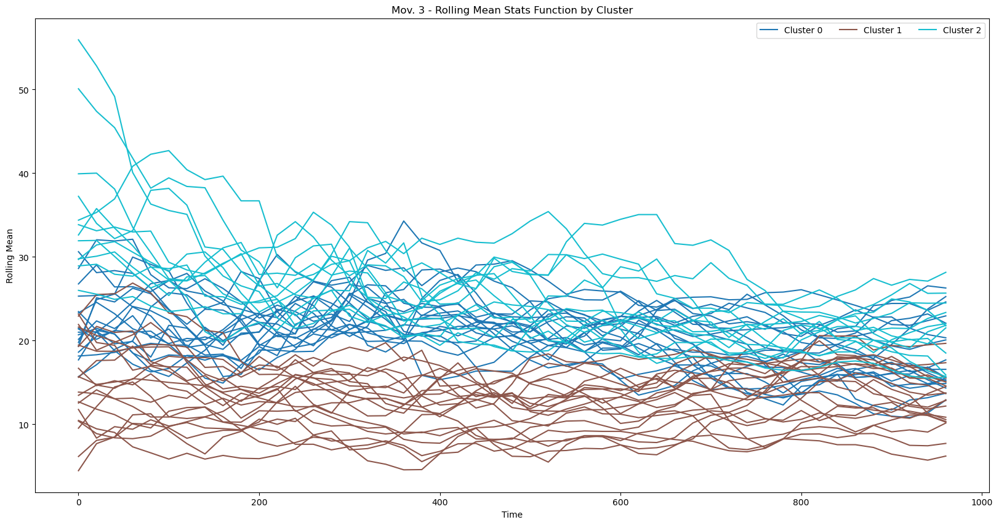

In [60]:
# plot results and color code according to cluster data
plt.figure(figsize=(20, 10))
# create colormap for the x-number of clusters
colors=plt.cm.get_cmap('tab10', optimal_k_value)
for cluster in range(optimal_k_value):
    # return index object of names of cells pertaining to specific cluster number
    cluster_cells = rolling_mean_area_mov3_results.columns.get_level_values('Cell')[rolling_mean_area_mov3_results.columns.get_level_values('Cluster') == cluster]
    for cell in cluster_cells: 
        plt.plot(rolling_mean_area_mov3_results[cell].index, rolling_mean_area_mov3_results[cell], color=colors(cluster), label=f'Cluster {cluster}' if cell == cluster_cells[0] else "")
plt.legend(ncol=optimal_k_value)
plt.title('Mov. 3 - Rolling Mean Stats Function by Cluster')
plt.xlabel('Time')
plt.ylabel('Rolling Mean')
plt.show()

In [61]:
print(silhouette_score(rolling_mean_area_mov3_results.T, cluster_labels))

0.32871010462397915


### KMeans Clustering Analysis of Rolling Mean Stats Function (Delta Trend and Individual Movies)¶

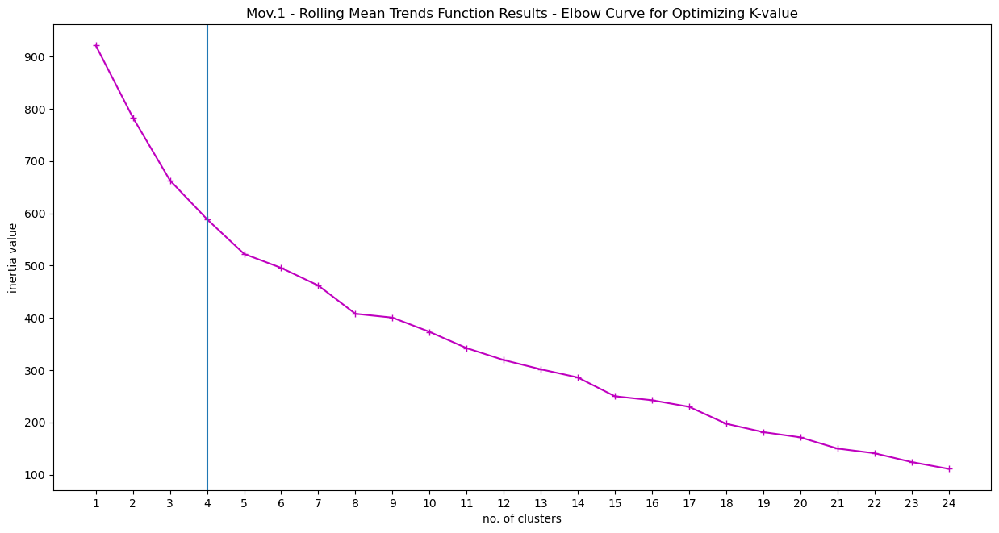

Cell,Cell 2,Cell 3,Cell 4,cell 5,Cell 6,Cell 7,Cell 9,Cell 10,Cell 11,Cell 12,Cell 14,Cell 15,cell 16,Cell 17,Cell 18,Cell 19,Cell 20,Cell 21,Cell 22,Cell 23,Cell 24,Cell 25,Cell 26,Cell 2.1,Cell 3.1,Cell 4.1,cell 5.1,Cell 6.1,Cell 7.1,Cell 9.1,Cell 10.1,Cell 11.1,Cell 12.1,Cell 13.1,Cell 14.1,Cell 15.1,cell 16.1,M,N,O
Cluster,3,3,3,3,3,3,0,3,3,3,3,3,1,3,3,3,3,3,2,3,3,3,3,3,3,3,3,3,3,1,1,1,1,1,1,1,1,0,3,2
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.158100,-0.217500,-1.976200,-0.553333,-0.316333,0.296425,-1.047363,-0.306312,-1.185625e-01,-0.069163,0.276675,-1.185625e-01,-0.118575,0.296425,-0.385350,-0.098800,-0.197612,-0.019750,-0.741062,-0.494038,-0.029650,0.207488,0.191971,-0.249197,0.138963,0.176710,0.214457,0.252204,0.449499,0.500993,0.552488,0.603983,0.655478,0.706973,0.758468,0.809963,0.861457,0.395225,0.602737,-0.069175
20,0.128450,-0.243150,-1.225250,-0.296429,-0.257042,-0.247037,-0.326081,-0.113656,1.916919e+00,1.743969,0.343857,1.916919e+00,0.067183,-0.247037,1.546325,-0.057300,-1.482106,-0.839875,-4.046181,-0.009869,0.301325,0.301344,0.071286,-0.282563,0.067323,0.095164,0.123005,0.150846,0.544857,0.564248,0.583639,0.603030,0.622421,0.641812,0.661203,0.680594,0.699985,1.541413,0.854719,-1.220287
40,0.096173,-0.109433,-0.922233,-0.287206,-0.181894,0.625775,-2.878621,-0.787171,6.192125e-01,-0.286521,0.202888,6.192125e-01,-0.007912,0.625775,0.029650,-0.134811,-0.487438,0.494083,0.648813,-0.823379,-0.220683,0.200896,0.390057,-0.353402,-0.027335,-0.007495,0.012346,0.032187,1.128659,1.228936,1.329212,1.429489,1.529766,1.630043,1.730320,1.830597,1.930874,0.131742,0.279979,-0.708125
60,0.100562,0.015733,-0.408425,-0.168634,-0.181839,1.080300,-0.105400,0.263467,-7.401487e-17,0.342533,0.125720,-7.401487e-17,0.110661,1.080300,1.712667,-0.214802,-0.632367,0.000000,-2.766633,-0.342533,-0.447933,-0.316200,0.668600,-0.314831,-0.049627,-0.035081,-0.020535,-0.005989,0.173883,0.169646,0.165408,0.161171,0.156934,0.152696,0.148459,0.144221,0.139984,-0.974900,3.399000,-1.475533
80,0.112800,0.151417,-0.271405,-0.159226,-0.191208,0.421600,-0.447933,0.105400,-1.739033e+00,-1.053933,-0.031055,-1.739033e+00,0.072456,0.421600,-1.633600,-0.242472,0.922200,0.869667,2.265967,0.395233,-0.658700,-0.210800,-0.105400,-0.251191,-0.032630,-0.020063,-0.007495,0.005073,0.598656,0.689883,0.781111,0.872338,0.963566,1.054794,1.146021,1.237249,1.328477,-1.133000,0.395233,2.555833
100,0.145077,-0.243917,-0.196749,-0.122339,-0.190550,0.026367,-0.289833,0.895833,-8.958667e-01,0.000000,0.574961,-6.060333e-01,0.941956,0.026367,0.869500,-0.514728,0.210767,-0.474333,-2.924700,0.685067,0.184433,0.711400,-0.658733,-0.105256,0.470602,0.528754,0.586906,0.645058,0.451706,0.502448,0.553190,0.603932,0.654673,0.705415,0.756157,0.806899,0.857641,0.263467,3.372633,-1.291100
120,0.351488,-0.085917,-0.127110,-0.688833,-0.111494,-0.210800,-3.319933,-0.184433,-1.317333e-01,-0.579667,0.533571,1.581000e-01,0.546742,-0.210800,-2.055200,0.046096,-0.026367,0.184333,-0.131733,0.210800,0.764100,1.212033,-0.263500,-0.091966,0.418190,0.471875,0.525560,0.579245,1.239550,1.380463,1.521375,1.662288,1.803200,1.944113,2.085026,2.225938,2.366851,0.895833,-0.526967,3.109133
140,0.490750,-0.685333,-0.198251,-0.685067,-0.378875,0.948533,-1.580933,-0.289833,-5.270000e-02,-0.237133,0.816833,2.108000e-01,0.316167,0.948533,-0.447933,0.184433,-0.368867,-0.553333,-0.922200,-0.632367,0.395233,-0.026333,0.368867,-0.081444,0.369599,0.417398,0.465197,0.512996,0.560795,0.608594,0.656393,0.704192,0.751992,0.799791,0.847590,0.895389,0.943188,3.056433,0.816800,-1.133000


In [62]:
# Mov.1 - KMeans Clustering Analysis of Rolling Mean Stats Function (Delta Trend)
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# elbow curve to determine optimal number of clusters at inflection point
inertia = []
k_cluster_range = range(1,25)
for k in k_cluster_range: 
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=123)
    kmeans.fit(rolling_mean_delta_mov1_results)
    inertia.append(kmeans.inertia_)    
    
# plot of the inertia elbow curve 
plt.figure(figsize=(15, 7.5))
plt.plot(k_cluster_range, inertia, 'm+-')
plt.axvline(x=4)
plt.xticks(k_cluster_range)
plt.xlabel('no. of clusters')
plt.ylabel('inertia value')
plt.title('Mov.1 - Rolling Mean Trends Function Results - Elbow Curve for Optimizing K-value')
plt.show()

# set optimal_k_value based upon elbow curve inflection point
optimal_k_value = 4
kmeans = KMeans(n_clusters=optimal_k_value, random_state=123, n_init=10)

# transpose the rolling_mean_delta_mov1_results dataframe to cluster across cell feature data 
cluster_labels = kmeans.fit_predict(rolling_mean_delta_mov1_results.T)

# generate a cell / cluster dataframe separately for quick vertical lookup
cluster_labels_df = pd.DataFrame(cluster_labels, index=rolling_mean_delta_mov1_results.columns, columns=['Cluster Labels'])

# create multi-index for columns
new_columns = pd.MultiIndex.from_tuples(
    [(cell, cluster_labels_df.loc[cell, 'Cluster Labels']) for cell in rolling_mean_delta_mov1_results.columns],
    names=['Cell', 'Cluster']
)
rolling_mean_delta_mov1_results.columns = new_columns
display(rolling_mean_delta_mov1_results)

/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/3173421134.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors=plt.cm.get_cmap('tab10', optimal_k_value)


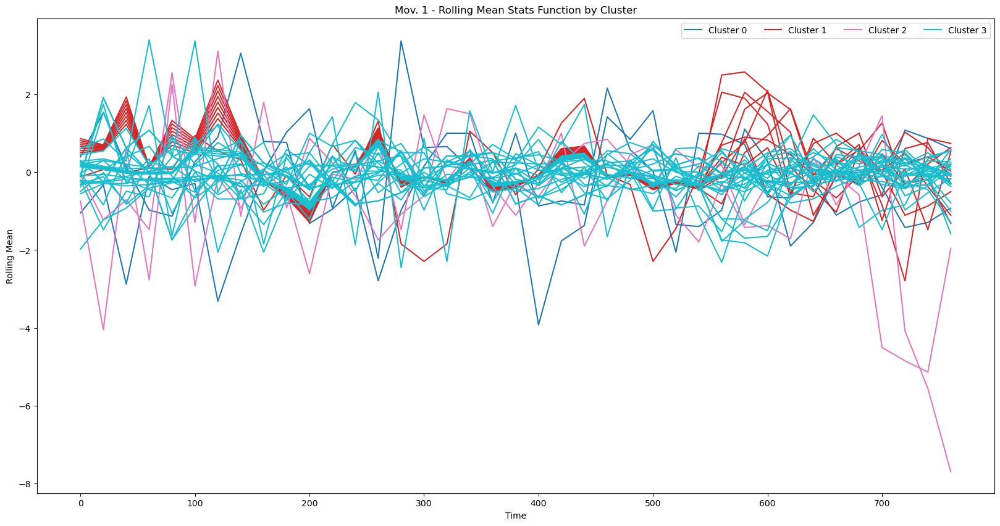

In [63]:
# plot results and color code according to cluster data
plt.figure(figsize=(20, 10))
# create colormap for the x-number of clusters
colors=plt.cm.get_cmap('tab10', optimal_k_value)
for cluster in range(optimal_k_value):
    # return index object of names of cells pertaining to specific cluster number
    cluster_cells = rolling_mean_delta_mov1_results.columns.get_level_values('Cell')[rolling_mean_delta_mov1_results.columns.get_level_values('Cluster') == cluster]
    for cell in cluster_cells: 
        plt.plot(rolling_mean_delta_mov1_results[cell].index, rolling_mean_delta_mov1_results[cell], color=colors(cluster), label=f'Cluster {cluster}' if cell == cluster_cells[0] else "")
plt.legend(ncol=optimal_k_value)
plt.title('Mov. 1 - Rolling Mean Stats Function by Cluster')
plt.xlabel('Time')
plt.ylabel('Rolling Mean')
plt.show()

In [64]:
print(silhouette_score(rolling_mean_delta_mov1_results.T, cluster_labels))

0.2241142067208159


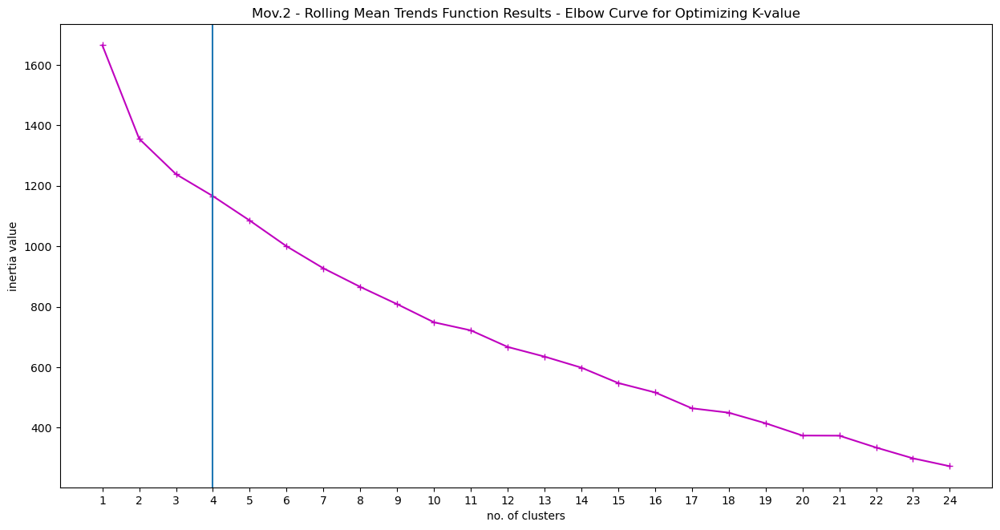

Cell,P,R,S,T,U,W,V,Y,Z,X,Cell 1,Cell 2,Cell 3,Cell 4,Cell 5,Cell C1,Cell C2,Cell C3,Cell C4,Cell C5,Cell 11,Cell 12,Cell 13,Cell 14,15 (purple),15 (white),Cell 16,Cell 18,Cell 22,Cell 23,Cell 34,Cell 36
Cluster,1,1,1,1,1,1,1,1,1,1,2,3,1,3,1,1,1,1,1,0,3,1,0,0,1,0,0,1,1,0,2,3
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,-0.316200,-0.237100,0.237100,-0.711400,0.948500,1.976200,0.049400,-0.790500,0.316100,0.632400,2.840550,-5.917813,0.289315,-6.075622,-0.304345,2.196957,-2.275420,2.196957,-4.236989,2.353883,-8.220800,-0.553400,2.450400,3.636100,-3.478000,4.742800,3.003700,0.395200,0.316200,4.426600,4.268500,-5.849400
20,-0.434750,-0.592850,-0.790500,0.750950,-0.118600,0.988100,-0.014800,-0.909050,0.513800,-0.197600,0.118356,1.696440,0.325010,-2.524934,-0.314912,-0.823859,-0.941553,1.020016,-3.687750,-0.745396,-2.410900,0.553300,2.964200,4.268500,-1.580950,-0.632350,1.541400,0.988050,-1.264750,-1.936650,-0.079050,-5.533200
40,0.026333,0.052700,0.447900,-0.105400,0.421567,0.105400,-0.299733,-0.131733,0.368867,0.263500,0.736439,-1.341371,0.400783,-0.946850,-0.472955,-0.496931,0.026154,0.784628,-1.856952,0.575394,-1.686300,1.159333,1.159333,3.267267,-1.317433,0.632367,1.370133,0.052700,-0.263500,-0.579667,0.711433,0.158100
60,-0.210800,0.052667,-0.289833,0.000000,-0.579667,-0.474300,-0.869500,-0.263467,0.131767,-0.079067,-0.710138,1.972604,-0.169080,1.262467,-0.161096,-0.496931,0.758473,-0.993862,-0.732319,-0.993862,1.080300,1.422833,0.764133,-0.606000,-0.895867,-0.764133,0.210800,-0.579667,2.792967,-2.687567,-0.790467,3.346300
80,-0.184433,0.526967,0.000000,-0.526967,0.000000,-0.816833,-0.158100,0.474300,0.342533,-0.131767,-0.368220,-2.761646,1.078357,1.288768,0.157808,0.523085,1.255404,0.026154,0.366160,0.418468,1.870767,-0.395233,-1.370133,-0.658700,-0.052667,1.106633,-1.422833,-0.843133,0.948567,0.764133,-2.318667,1.791700
100,-0.474267,0.052700,-0.606000,0.553333,-0.105400,0.052700,0.500633,-0.474300,-0.210800,-0.606033,1.525481,-1.604385,0.105206,0.683836,-0.552329,0.575394,0.941553,-1.569255,0.732319,0.340005,1.686300,-1.923467,-0.737767,-2.055233,1.185700,-0.816800,-1.185700,0.052700,1.633633,0.895833,3.293600,-1.607267
120,0.395233,-0.606000,0.158100,0.500633,0.395233,0.342533,0.948533,0.895833,-0.263500,-0.737767,-0.420822,-2.998359,1.183563,-0.105206,-0.420822,-0.941553,-0.758473,0.261543,1.360021,2.589271,1.343800,-2.028833,-1.080300,0.395233,1.317433,-0.764100,-0.843167,-0.843167,-2.345067,1.106633,0.316200,-4.795467
140,0.105367,0.579667,-0.026333,-0.026367,-0.237133,1.159367,0.000000,0.079033,-0.447933,-0.131733,2.209317,-0.131507,-0.841645,0.052603,-0.289315,0.915399,-0.915399,1.098479,1.203096,2.432345,-1.686333,0.131733,-0.342533,-0.922233,-0.342567,-0.263500,-0.869500,-1.053967,0.895833,0.052700,1.739000,-0.579667


In [65]:
# Mov.2 - KMeans Clustering Analysis of Rolling Mean Stats Function (Delta Trend)
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# elbow curve to determine optimal number of clusters at inflection point
inertia = []
k_cluster_range = range(1,25)
for k in k_cluster_range: 
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=123)
    kmeans.fit(rolling_mean_delta_mov2_results)
    inertia.append(kmeans.inertia_)
    
# plot of the inertia elbow curve 
plt.figure(figsize=(15, 7.5))
plt.plot(k_cluster_range, inertia, 'm+-')
plt.axvline(x=4)
plt.xticks(k_cluster_range)
plt.xlabel('no. of clusters')
plt.ylabel('inertia value')
plt.title('Mov.2 - Rolling Mean Trends Function Results - Elbow Curve for Optimizing K-value')
plt.show()

# set optimal_k_value based upon elbow curve inflection point
optimal_k_value = 4
kmeans = KMeans(n_clusters=optimal_k_value, random_state=123, n_init=10)

# transpose the rolling_mean_delta_mov2_results dataframe to cluster across cell feature data 
cluster_labels = kmeans.fit_predict(rolling_mean_delta_mov2_results.T)

# generate a cell / cluster dataframe separately for quick vertical lookup
cluster_labels_df = pd.DataFrame(cluster_labels, index=rolling_mean_delta_mov2_results.columns, columns=['Cluster Labels'])

# create multi-index for columns
new_columns = pd.MultiIndex.from_tuples(
    [(cell, cluster_labels_df.loc[cell, 'Cluster Labels']) for cell in rolling_mean_delta_mov2_results.columns],
    names=['Cell', 'Cluster']
)
rolling_mean_delta_mov2_results.columns = new_columns
display(rolling_mean_delta_mov2_results)

/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/140188950.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors=plt.cm.get_cmap('tab10', optimal_k_value)


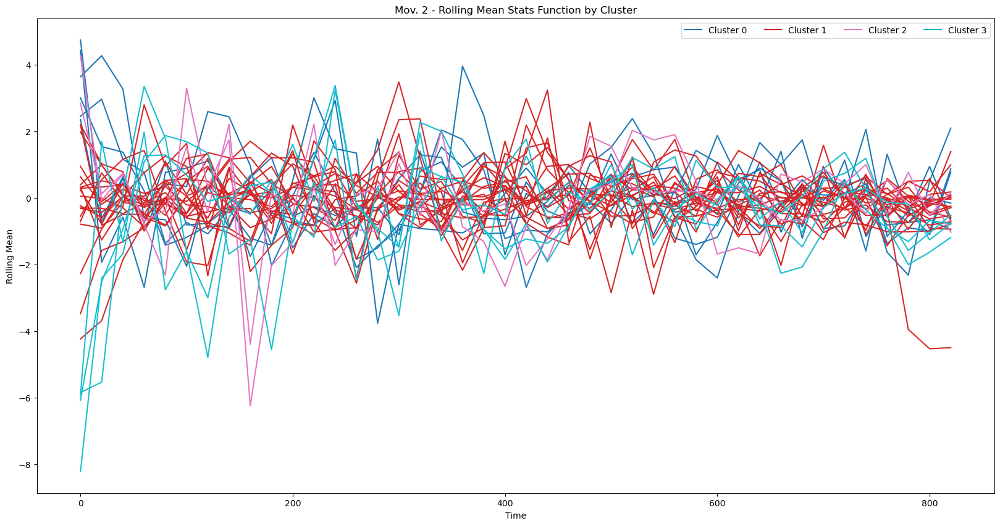

In [66]:
# plot results and color code according to cluster data
plt.figure(figsize=(20, 10))
# create colormap for the x-number of clusters
colors=plt.cm.get_cmap('tab10', optimal_k_value)
for cluster in range(optimal_k_value):
    # return index object of names of cells pertaining to specific cluster number
    cluster_cells = rolling_mean_delta_mov2_results.columns.get_level_values('Cell')[rolling_mean_delta_mov2_results.columns.get_level_values('Cluster') == cluster]
    for cell in cluster_cells: 
        plt.plot(rolling_mean_delta_mov2_results[cell].index, rolling_mean_delta_mov2_results[cell], color=colors(cluster), label=f'Cluster {cluster}' if cell == cluster_cells[0] else "")
plt.legend(ncol=optimal_k_value)
plt.title('Mov. 2 - Rolling Mean Stats Function by Cluster')
plt.xlabel('Time')
plt.ylabel('Rolling Mean')
plt.show()

In [67]:
print(silhouette_score(rolling_mean_delta_mov2_results.T, cluster_labels))

0.18516733591858628


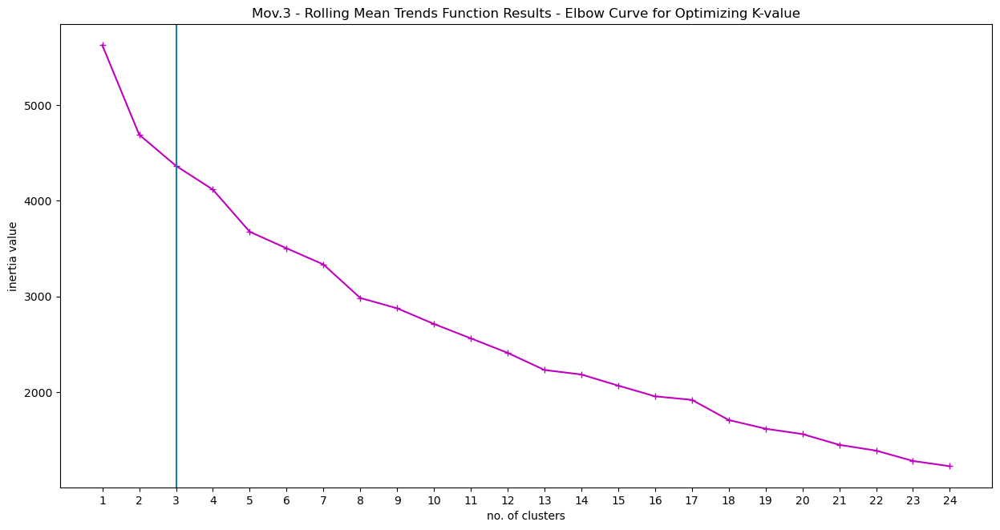

Cell,Cell 1,Cell 2,Cell 3,Cell 4,Cell 5,Cell 6,Cell 7,Cell 8,Cell 9,Cell 10,Cell 11,Cell 12,Cell 13,Cell 14,Cell 15,Cell 21,Cell 22,Cell 23,Cell 24,Cell 25,Cell 26,Cell 27,Cell 28,Cell 29,Cell 30,Cell 31,Cell 34,Cell 37,Cell 38,Cell 39,Cell 40,Cell 41,Cell 42,Cell 43,Cell 44,Cell 45,Cell 46,Cell 47,Cell 48,Cell 49,Cell 50,Cell 51,Cell 52,Cell 53,Cell 54,Cell 55,Cell 56,Cell 57
Cluster,2,1,2,1,1,2,1,1,2,1,1,1,2,1,2,0,2,2,1,2,1,0,1,2,2,1,2,2,2,1,1,1,2,2,2,2,2,1,2,2,1,1,1,2,2,1,1,1
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,-6.848000,3.847000,-3.001000,4.770000,5.156000,-1.769800,2.462200,4.539900,-2.000600,6.848300,3.155000,6.463000,-2.001000,5.156000,0.077000,11.618900,-6.232700,-5.001500,6.309600,-5.386200,1.846800,10.233900,0.153900,-6.463600,-6.155700,3.770400,-1.462000,-1.846700,-6.771300,4.001200,0.615600,4.386000,0.384800,-2.462300,-4.462900,-0.384700,-0.923400,3.462600,0.307800,-4.155100,2.539300,1.539000,6.848300,0.153900,-1.000300,0.077000,2.847000,-1.462000
20,0.346000,1.539000,-1.500500,0.115000,1.423500,-1.423500,0.038450,-2.808550,-1.577400,1.500500,-0.808000,2.808500,-1.154500,4.809500,-3.347000,2.154500,-7.040600,-0.884850,-1.923700,-4.270500,2.885500,3.578000,-2.808550,-4.347500,-0.115450,1.808250,-0.384750,-0.038450,-2.192950,1.077250,0.923400,-0.269300,-1.692800,0.961800,-1.769750,-1.000300,-1.154200,1.462000,0.500150,-0.153900,-1.423500,-0.654050,-0.538600,0.384750,2.231450,-2.847000,3.462600,0.307800
40,-0.308000,1.641333,-0.102667,0.179333,1.282333,-1.102900,1.154200,0.025667,-0.769467,0.205200,-0.923333,2.641667,-1.718667,0.590000,-1.615667,1.641533,-9.079700,-0.333433,-2.103233,-3.642133,3.898633,4.411600,-4.565500,0.949000,0.897700,3.000900,0.410367,0.333433,-2.975267,1.667167,-1.821067,1.538933,-0.230833,-0.205200,-2.282733,0.076933,0.333433,-1.256800,0.615567,-0.487333,-1.795400,-2.231433,0.282133,-1.590233,1.974967,-1.974933,1.025967,-0.589933
60,1.128333,-0.102667,0.307667,-3.667667,-1.180000,-0.487333,-0.205167,-0.589933,0.410367,-4.232067,-1.256667,0.128333,-0.718000,-1.718667,-0.923333,-0.666867,-3.770367,-1.769767,-2.513600,-3.590833,1.436333,-0.872067,-3.026567,4.822000,1.461967,-0.513000,0.102600,1.667167,0.487333,-2.205800,-1.615867,-2.667500,1.102900,0.128233,-0.949000,-0.487333,-1.128567,-1.205500,0.461667,1.308100,-0.846433,-2.077567,-1.872367,-1.077233,2.205800,-1.795433,4.026867,0.102600
80,-0.743667,-0.436000,1.128667,-0.718000,-2.411000,2.000600,-0.256500,1.308100,-0.051300,-1.564600,0.000000,-2.026333,-0.743667,-2.436667,0.410333,-1.923667,-0.769467,-2.513600,-1.590233,1.231133,0.436033,-0.769467,-3.129167,0.230833,-1.641500,-1.102900,0.025667,-0.179567,-0.615567,1.000300,-1.769800,1.077233,-0.205200,-1.564567,0.718167,0.820767,-0.666900,-1.102900,-0.205200,-1.667167,-0.923367,-0.743800,3.796033,-2.385333,0.384733,0.897700,1.718467,-3.719100
100,0.410667,-1.231000,0.590000,-1.564667,-0.436000,0.436033,-0.179567,0.872033,-0.256500,-0.102600,0.795333,-1.538667,0.692667,-0.205000,1.564667,-2.077567,-0.461700,-1.795400,-2.026233,-1.025933,-2.282733,-3.872967,-0.205200,-2.000633,-3.103500,-3.283033,-1.564567,-0.051300,-1.256800,-0.179533,2.231467,-2.231433,0.436033,-1.898033,-0.102600,-0.359067,0.230833,2.077567,0.000000,-0.410367,0.615567,1.615867,-0.333433,-0.641200,-1.256800,-0.051300,-0.256500,-0.923333
120,-0.641000,0.564333,0.564333,0.615667,-1.616000,0.051300,-0.205200,-2.103200,-2.436633,1.179833,0.410333,-1.231000,-0.692667,0.205333,-0.128000,-9.643967,-4.975900,1.795433,-4.129467,-0.153900,-1.179867,-3.052233,2.180133,-5.001533,-2.590533,0.333433,-1.692833,-2.359700,-1.513267,0.025633,0.153900,2.436633,-3.719100,-2.154500,-0.512967,1.487633,0.359100,0.256500,-1.179833,-1.564600,-0.153900,1.513267,-2.103233,0.512967,-0.410367,0.949000,-1.615867,-0.487333
140,-0.077000,0.384667,-0.615667,-1.590333,-0.282000,-1.769767,0.923367,-1.179867,0.102600,-1.154200,-1.179667,2.026333,0.436000,0.641000,0.077000,-0.564267,-2.385367,-0.102600,-1.256767,-3.872967,0.410400,-1.

In [68]:
# Mov.3 - KMeans Clustering Analysis of Rolling Mean Stats Function (Delta Trend)
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# elbow curve to determine optimal number of clusters at inflection point
inertia = []
k_cluster_range = range(1,25)
for k in k_cluster_range: 
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=123)
    kmeans.fit(rolling_mean_delta_mov3_results)
    inertia.append(kmeans.inertia_)
    
# plot of the inertia elbow curve 
plt.figure(figsize=(15, 7.5))
plt.plot(k_cluster_range, inertia, 'm+-')
plt.axvline(x=3)
plt.xticks(k_cluster_range)
plt.xlabel('no. of clusters')
plt.ylabel('inertia value')
plt.title('Mov.3 - Rolling Mean Trends Function Results - Elbow Curve for Optimizing K-value')
plt.show()

# set optimal_k_value based upon elbow curve inflection point
optimal_k_value = 3 
kmeans = KMeans(n_clusters=optimal_k_value, random_state=123, n_init=10)

# transpose the rolling_mean_delta_mov3_results dataframe to cluster across cell feature data 
cluster_labels = kmeans.fit_predict(rolling_mean_delta_mov3_results.T)

# generate a cell / cluster dataframe separately for quick vertical lookup
cluster_labels_df = pd.DataFrame(cluster_labels, index=rolling_mean_delta_mov3_results.columns, columns=['Cluster Labels'])

# create multi-index for columns
new_columns = pd.MultiIndex.from_tuples(
    [(cell, cluster_labels_df.loc[cell, 'Cluster Labels']) for cell in rolling_mean_delta_mov3_results.columns],
    names=['Cell', 'Cluster']
)
rolling_mean_delta_mov3_results.columns = new_columns
display(rolling_mean_delta_mov3_results)

/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/3309330294.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors=plt.cm.get_cmap('tab10', optimal_k_value)


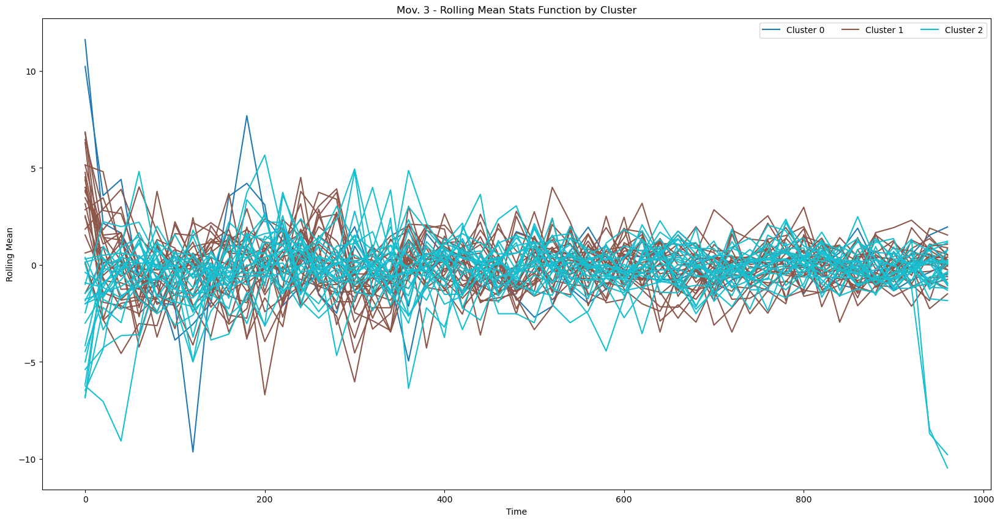

In [69]:
# plot results and color code according to cluster data
plt.figure(figsize=(20, 10))
# create colormap for the x-number of clusters
colors=plt.cm.get_cmap('tab10', optimal_k_value)
for cluster in range(optimal_k_value):
    # return index object of names of cells pertaining to specific cluster number
    cluster_cells = rolling_mean_delta_mov3_results.columns.get_level_values('Cell')[rolling_mean_delta_mov3_results.columns.get_level_values('Cluster') == cluster]
    for cell in cluster_cells: 
        plt.plot(rolling_mean_delta_mov3_results[cell].index, rolling_mean_delta_mov3_results[cell], color=colors(cluster), label=f'Cluster {cluster}' if cell == cluster_cells[0] else "")
plt.legend(ncol=optimal_k_value)
plt.title('Mov. 3 - Rolling Mean Stats Function by Cluster')
plt.xlabel('Time')
plt.ylabel('Rolling Mean')
plt.show()

In [70]:
print(silhouette_score(rolling_mean_delta_mov3_results.T, cluster_labels))

0.12380557347009075


In [71]:
# # Dropping one level of MultiIndex
# rolling_mean_area_mov1_results.columns = rolling_mean_area_mov1_results.columns.droplevel(1)
# rolling_mean_area_mov2_results.columns = rolling_mean_area_mov2_results.columns.droplevel(1)
# rolling_mean_area_mov3_results.columns = rolling_mean_area_mov3_results.columns.droplevel(1)

In [72]:
#Downloading the combined dataset that is preprocessed and imputed using the rolling mean
check_combined_df_movie_level = pd.read_csv('multi_level_combined_imputed_final_movie_level.csv', header=[0, 1, 2], index_col=0)

In [73]:
check_combined_df_movie_level.columns.names = ['Movie', 'Cell', 'Trend'] 
display(check_combined_df_movie_level.head(5))

Movie            Movie 1                                                \
Cell              Cell 2           Cell 3             Cell 4             
Trend               area     delta   area    delta      area     delta   
Interval [min]                                                           
0               4.604450  0.158100  5.217 -0.21750  6.284200 -1.976200   
20              4.553060  0.098800  5.138 -0.26880  6.297367 -0.474300   
40              4.479283  0.031620  5.409  0.15800  6.303950 -0.316200   
60              4.550800  0.171267  5.632  0.15800  6.149800 -0.434775   
80              4.594563  0.135514  6.087  0.13825  6.284183 -0.063240   

Movie                                                                      \
Cell              cell 5              Cell 6             Cell 7             
Trend               area     delta      area     delta     area     delta   
Interval [min]                                                              
0               6.778250 -0.553333  9.189250 -0.316333   8.3789  0.296425   
20              7.019340 -0.039525  9.137800 -0.197750   7.5884 -0.790500   
40              6.982450 -0.268760  9.209000 -0.031600   9.9598  2.371400   
60              6.978686 -0.197617  9.011429 -0.316167  11.6198  1.660000   
80              7.114187 -0.011300  8.902750 -0.225857   8.8532 -2.766600   

Movie                                                                    \
Cell             Cell 9            Cell 10            Cell 11             
Trend              area     delta     area     delta     area     delta   
Interval [min]                                                            
0               30.0376 -1.047363  12.4103 -0.306312  11.6988 -0.118563   
20              30.4328  0.395200  12.4893  0.079000  15.6512  3.952400   
40              22.4491 -7.983700  10.3551 -2.134200  13.6750 -1.976200   
60              29.7214  7.272300  13.2007  2.845600  11.6988 -1.976200   
80              29.0890 -0.632400  12.8055 -0.395200  10.4341 -1.264700   

Movie                                                                     \
Cell            Cell 12             Cell 14            Cell 15             
Trend              area     delta      area     delta     area     delta   
Interval [min]                                                             
0                7.5884 -0.069163  9.295840  0.276675  11.6988 -0.118563   
20              11.1455  3.557100  9.406500  0.411040  15.6512  3.952400   
40               6.7980 -4.347500  9.124186 -0.079050  13.6750 -1.976200   
60               8.6160  1.818000  9.011263  0.045171  11.6988 -1.976200   
80               7.9837 -0.632300  7.904600 -0.059287  10.4341 -1.264700   

Movie                                                                     \
Cell              cell 16            Cell 17            Cell 18            
Trend                area     delta     area     delta     area    delta   
Interval [min]                                                             
0               13.690800 -0.118575   8.3789  0.296425  18.9711 -0.38535   
20              13.754033  0.252940   7.5884 -0.790500  22.4491  3.47800   
40              13.483014 -0.158100   9.9598  2.371400  19.4454 -3.00370   
60              13.605825  0.237143  11.6198  1.660000  24.1091  4.66370   
80              12.805500  0.138325   8.8532 -2.766600  17.5483 -6.56080   

Movie                                                                   \
Cell             Cell 19            Cell 20           Cell 21            
Trend               area     delta     area     delta    area    delta   
Interval [min]                                                           
0               7.209020 -0.098800  11.4617 -0.197612  12.173 -0.01975   
20              7.219567 -0.015800   8.6951 -2.766600  10.513 -1.66000   
40              6.989957 -0.289833  10.1970  1.501900  13.675  3.16200   
60              6.738700 -0.338771   9.5646 -0.632400  12.173 -1.50200   
8

### KMeans Clustering Analysis of Rolling Mean Stats Function (Area Trend and Combined Movies)

In [74]:
area_combined = check_combined_df_movie_level.xs('area', level='Trend', axis=1)

In [75]:
area_combined.head()

Movie            Movie 1                                                \
Cell              Cell 2 Cell 3    Cell 4    cell 5    Cell 6   Cell 7   
Interval [min]                                                           
0               4.604450  5.217  6.284200  6.778250  9.189250   8.3789   
20              4.553060  5.138  6.297367  7.019340  9.137800   7.5884   
40              4.479283  5.409  6.303950  6.982450  9.209000   9.9598   
60              4.550800  5.632  6.149800  6.978686  9.011429  11.6198   
80              4.594563  6.087  6.284183  7.114187  8.902750   8.8532   

Movie                                                                  \
Cell             Cell 9  Cell 10  Cell 11  Cell 12   Cell 14  Cell 15   
Interval [min]                                                          
0               30.0376  12.4103  11.6988   7.5884  9.295840  11.6988   
20              30.4328  12.4893  15.6512  11.1455  9.406500  15.6512   
40              22.4491  10.3551  13.6750   6.7980  9.124186  13.6750   
60              29.7214  13.2007  11.6988   8.6160  9.011263  11.6988   
80              29.0890  12.8055  10.4341   7.9837  7.904600  10.4341   

Movie                                                                   \
Cell              cell 16  Cell 17  Cell 18   Cell 19  Cell 20 Cell 21   
Interval [min]                                                           
0               13.690800   8.3789  18.9711  7.209020  11.4617  12.173   
20              13.754033   7.5884  22.4491  7.219567   8.6951  10.513   
40              13.483014   9.9598  19.4454  6.989957  10.1970  13.675   
60              13.605825  11.6198  24.1091  6.738700   9.5646  12.173   
80              12.805500   8.8532  17.5483  7.351300  11.4617  13.122   

Movie                                                                  \
Cell            Cell 22  Cell 23  Cell 24 Cell 25  Cell 26   Cell 2.1   
Interval [min]                                                          
0               23.0025  13.0426  10.0389  9.0113   0.0000  12.718065   
20              15.6512  13.5169  10.6712  9.4065   8.6951  12.516736   
40              25.6900  11.0665   9.4065  9.4065   9.7227  12.180569   
60              14.7026  12.0150   8.6951  8.0627  10.7503  12.179663   
80              22.4491  14.7026   8.6951  8.7741   8.3789  12.169714   

Movie                                                                  \
Cell             Cell 3.1   Cell 4.1   cell 5.1   Cell 6.1   Cell 7.1   
Interval [min]                                                          
0               12.700978  12.862969  13.024960  13.186951   9.612414   
20              12.558528  12.715997  12.873466  13.030934  10.252631   
40              12.274160  12.418879  12.563598  12.708317  12.548892   
60              12.286448  12.437856  12.589264  12.740672  10.134064   
80              11.867861  11.913045  11.958229  12.003413  12.048597   

Movie                                                                  \
Cell             Cell 9.1  Cell 10.1  Cell 11.1  Cell 12.1  Cell 13.1   
Interval [min]                                                          
0                9.396629   9.180843   8.965057   8.749271   8.533485   
20              10.024132   9.795633   9.567134   9.338635   9.110136   
40              12.582442  12.615992  12.649542  12.683092  12.716641   
60               9.905566   9.677068   9.448570   9.220072   8.991574   
80              12.093781  12.138965  12.184150  12.229334  12.274518   

Movie                                                                       \
Cell            Cell 14.1  Cell 15.1  cell 16.1        M        N        O   
Interval [min]                                                               
0                8.317699   8.101913   7.886127  16.0464  16.8368  22.5282   
20               8.881638   8.653139   8.424640  18.7340  17.9435  20.1568   
40              12.750191  12.783741  12.817291  16.0464  17.0740  20.4730   
60    

In [76]:
area_combined.columns = ['_'.join(col).strip() for col in area_combined.columns.values]

In [77]:
area_combined.head()

,Movie 1_Cell 2,Movie 1_Cell 3,Movie 1_Cell 4,Movie 1_cell 5,Movie 1_Cell 6,Movie 1_Cell 7,Movie 1_Cell 9,Movie 1_Cell 10,Movie 1_Cell 11,Movie 1_Cell 12,Movie 1_Cell 14,Movie 1_Cell 15,Movie 1_cell 16,Movie 1_Cell 17,Movie 1_Cell 18,Movie 1_Cell 19,Movie 1_Cell 20,Movie 1_Cell 21,Movie 1_Cell 22,Movie 1_Cell 23,Movie 1_Cell 24,Movie 1_Cell 25,Movie 1_Cell 26,Movie 1_Cell 2.1,Movie 1_Cell 3.1,Movie 1_Cell 4.1,Movie 1_cell 5.1,Movie 1_Cell 6.1,Movie 1_Cell 7.1,Movie 1_Cell 9.1,Movie 1_Cell 10.1,Movie 1_Cell 11.1,Movie 1_Cell 12.1,Movie 1_Cell 13.1,Movie 1_Cell 14.1,Movie 1_Cell 15.1,Movie 1_cell 16.1,Movie 1_M,Movie 1_N,Movie 1_O,Movie 2_P,Movie 2_R,Movie 2_S,Movie 2_T,Movie 2_U,Movie 2_W,Movie 2_V,Movie 2_Y,Movie 2_Z,Movie 2_X,Movie 2_Cell 1,Movie 2_Cell 2,Movie 2_Cell 3,Movie 2_Cell 4,Movie 2_Cell 5,Movie 2_Cell C1,Movie 2_Cell C2,Movie 2_Cell C3,Movie 2_Cell C4,Movie 2_Cell C5,Movie 2_Cell 11,Movie 2_Cell 12,Movie 2_Cell 13,Movie 2_Cell 14,Movie 2_15 (purple),Movie 2_15 (white),Movie 2_Cell 16,Movie 2_Cell 18,Movie 2_Cell 22,Movie 2_Cell 23,Movie 2_Cell 34,Movie 2_Cell 36,Movie 3_Cell 1,Movie 3_Cell 2,Movie 3_Cell 3,Movie 3_Cell 4,Movie 3_Cell 5,Movie 3_Cell 6,Movie 3_Cell 7,Movie 3_Cell 8,Movie 3_Cell 9,Movie 3_Cell 10,Movie 3_Cell 11,Movie 3_Cell 12,Movie 3_Cell 13,Movie 3_Cell 14,Movie 3_Cell 15,Movie 3_Cell 21,Movie 3_Cell 22,Movie 3_Cell 23,Movie 3_Cell 24,Movie 3_Cell 25,Movie 3_Cell 26,Movie 3_Cell 27,Movie 3_Cell 28,Movie 3_Cell 29,Movie 3_Cell 30,Movie 3_Cell 31,Movie 3_Cell 34,Movie 3_Cell 37,Movie 3_Cell 38,Movie 3_Cell 39,Movie 3_Cell 40,Movie 3_Cell 41,Movie 3_Cell 42,Movie 3_Cell 43,Movie 3_Cell 44,Movie 3_Cell 45,Movie 3_Cell 46,Movie 3_Cell 47,Movie 3_Cell 48,Movie 3_Cell 49,Movie 3_Cell 50,Movie 3_Cell 51,Movie 3_Cell 52,Movie 3_Cell 53,Movie 3_Cell 54,Movie 3_Cell 55,Movie 3_Cell 56,Movie 3_Cell 57
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,4.604450,5.217,6.284200,6.778250,9.189250,8.3789,30.0376,12.4103,11.6988,7.5884,9.295840,11.6988,13.690800,8.3789,18.9711,7.209020,11.4617,12.173,23.0025,13.0426,10.0389,9.0113,0.0000,12.718065,12.700978,12.862969,13.024960,13.186951,9.612414,9.396629,9.180843,8.965057,8.749271,8.533485,8.317699,8.101913,7.886127,16.0464,16.8368,22.5282,11.7779,9.5646,11.2246,7.7465,6.7980,9.4065,7.884862,12.8055,9.1694,9.2484,19.094811,28.168792,5.220826,19.173715,7.924234,7.924739,7.297036,9.886307,17.183344,11.612488,25.8481,12.4103,13.9912,9.9598,17.9435,12.6474,15.8883,11.9360,23.5558,20.1568,24.3462,32.5670,11.773,6.156,10.388,19.314,22.930,12.6962,13.4657,26.7774,21.6220,28.6241,12.542,4.463,10.465,9.541,21.006,19.3136,55.9402,30.6247,32.6254,50.0922,34.3951,19.7753,39.9353,37.2422,21.9298,18.6211,19.4675,15.6971,23.1609,15.6202,29.7783,20.1600,28.9319,21.3912,23.4687,13.8504,26.0080,29.7014,18.1594,16.6974,23.3148,20.6986,17.6977,25.3154,21.4681,31.9328,15.6971,33.8565
20,4.553060,5.138,6.297367,7.019340,9.137800,7.5884,30.4328,12.4893,15.6512,11.1455,9.406500,15.6512,13.754033,7.5884,22.4491,7.219567,8.6951,10.513,15.6512,13.5169,10.6712,9.4065,8.6951,12.516736,12.558528,12.715997,12.873466,13.030934,10.252631,10.024132,9.795633,9.567134,9.338635,9.110136,8.881638,8.653139,8.424640,18.7340,17.9435,20.1568,11.4617,9.3275,11.4617,7.0351,7.7465,11.3827,8.378900,12.0150,9.4855,9.8808,21.935362,22.250978,5.376756,13.098094,7.742473,10.121696,5.021616,12.083265,12.946355,13.966371,17.6273,11.8569,16.4416,13.5959,14.4655,17.3902,18.8920,12.3312,23.8720,24.5834,28.6147,26.7176,4.925,10.003,7.387,24.084,28.086,10.9264,15.9279,31.3173,19.6214,35.4724,15.697,10.926,8.464,14.697,21.083,30.9325,49.7075,25.6232,38.9350,44.7060,36.2419,30.0092,40.0892,30.7786,15.7741,22.3915,18.0055,13.8504,16.3896,19.6214,30.3939,24.5460,29.3167,18.9289,19.0058,13.4657,25.0846,33.1640,18.4672,12.5423,25.8541,22.2376,24.5460,25.4693,20.4678,32.0098,18.5441,32.3945
40,4.479283,5.409,6.303950,6.982450,9.209000,9.9598,22

In [78]:
# rolling mean stats function 
def rolling_mean_combined(df):
    df_rolling_mean_combined = pd.DataFrame()
    for col in df.columns: 
        df_rolling_mean_combined[col] = df[col].rolling(window=3, min_periods=1).mean()
    return df_rolling_mean_combined

In [79]:
#Combined Rolling Mean Stats results
rolling_mean_area_results = rolling_mean_combined(area_combined)

/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/1079516689.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_rolling_mean_combined[col] = df[col].rolling(window=3, min_periods=1).mean()
/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/1079516689.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_rolling_mean_combined[col] = df[col].rolling(window=3, min_periods=1).mean()
/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/1079516689.py:5: PerformanceWarning: DataFrame is hig

In [80]:
rolling_mean_area_results.head()

,Movie 1_Cell 2,Movie 1_Cell 3,Movie 1_Cell 4,Movie 1_cell 5,Movie 1_Cell 6,Movie 1_Cell 7,Movie 1_Cell 9,Movie 1_Cell 10,Movie 1_Cell 11,Movie 1_Cell 12,Movie 1_Cell 14,Movie 1_Cell 15,Movie 1_cell 16,Movie 1_Cell 17,Movie 1_Cell 18,Movie 1_Cell 19,Movie 1_Cell 20,Movie 1_Cell 21,Movie 1_Cell 22,Movie 1_Cell 23,Movie 1_Cell 24,Movie 1_Cell 25,Movie 1_Cell 26,Movie 1_Cell 2.1,Movie 1_Cell 3.1,Movie 1_Cell 4.1,Movie 1_cell 5.1,Movie 1_Cell 6.1,Movie 1_Cell 7.1,Movie 1_Cell 9.1,Movie 1_Cell 10.1,Movie 1_Cell 11.1,Movie 1_Cell 12.1,Movie 1_Cell 13.1,Movie 1_Cell 14.1,Movie 1_Cell 15.1,Movie 1_cell 16.1,Movie 1_M,Movie 1_N,Movie 1_O,Movie 2_P,Movie 2_R,Movie 2_S,Movie 2_T,Movie 2_U,Movie 2_W,Movie 2_V,Movie 2_Y,Movie 2_Z,Movie 2_X,Movie 2_Cell 1,Movie 2_Cell 2,Movie 2_Cell 3,Movie 2_Cell 4,Movie 2_Cell 5,Movie 2_Cell C1,Movie 2_Cell C2,Movie 2_Cell C3,Movie 2_Cell C4,Movie 2_Cell C5,Movie 2_Cell 11,Movie 2_Cell 12,Movie 2_Cell 13,Movie 2_Cell 14,Movie 2_15 (purple),Movie 2_15 (white),Movie 2_Cell 16,Movie 2_Cell 18,Movie 2_Cell 22,Movie 2_Cell 23,Movie 2_Cell 34,Movie 2_Cell 36,Movie 3_Cell 1,Movie 3_Cell 2,Movie 3_Cell 3,Movie 3_Cell 4,Movie 3_Cell 5,Movie 3_Cell 6,Movie 3_Cell 7,Movie 3_Cell 8,Movie 3_Cell 9,Movie 3_Cell 10,Movie 3_Cell 11,Movie 3_Cell 12,Movie 3_Cell 13,Movie 3_Cell 14,Movie 3_Cell 15,Movie 3_Cell 21,Movie 3_Cell 22,Movie 3_Cell 23,Movie 3_Cell 24,Movie 3_Cell 25,Movie 3_Cell 26,Movie 3_Cell 27,Movie 3_Cell 28,Movie 3_Cell 29,Movie 3_Cell 30,Movie 3_Cell 31,Movie 3_Cell 34,Movie 3_Cell 37,Movie 3_Cell 38,Movie 3_Cell 39,Movie 3_Cell 40,Movie 3_Cell 41,Movie 3_Cell 42,Movie 3_Cell 43,Movie 3_Cell 44,Movie 3_Cell 45,Movie 3_Cell 46,Movie 3_Cell 47,Movie 3_Cell 48,Movie 3_Cell 49,Movie 3_Cell 50,Movie 3_Cell 51,Movie 3_Cell 52,Movie 3_Cell 53,Movie 3_Cell 54,Movie 3_Cell 55,Movie 3_Cell 56,Movie 3_Cell 57
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,4.604450,5.217000,6.284200,6.778250,9.189250,8.378900,30.037600,12.410300,11.698800,7.588400,9.295840,11.698800,13.690800,8.378900,18.971100,7.209020,11.461700,12.173000,23.002500,13.042600,10.038900,9.011300,0.000000,12.718065,12.700978,12.862969,13.024960,13.186951,9.612414,9.396629,9.180843,8.965057,8.749271,8.533485,8.317699,8.101913,7.886127,16.046400,16.836800,22.528200,11.777900,9.564600,11.224600,7.7465,6.798000,9.406500,7.884862,12.805500,9.169400,9.248400,19.094811,28.168792,5.220826,19.173715,7.924234,7.924739,7.297036,9.886307,17.183344,11.612488,25.848100,12.410300,13.991200,9.959800,17.943500,12.647400,15.888300,11.936000,23.555800,20.156800,24.346200,32.5670,11.773000,6.156000,10.388000,19.314000,22.930000,12.696200,13.465700,26.777400,21.622000,28.624100,12.542000,4.463000,10.465000,9.541000,21.006000,19.313600,55.940200,30.624700,32.625400,50.092200,34.395100,19.775300,39.935300,37.242200,21.929800,18.6211,19.467500,15.697100,23.160900,15.620200,29.778300,20.160000,28.931900,21.391200,23.468700,13.850400,26.008000,29.701400,18.159400,16.697400,23.314800,20.698600,17.697700,25.315400,21.468100,31.932800,15.697100,33.856500
20,4.578755,5.177500,6.290783,6.898795,9.163525,7.983650,30.235200,12.449800,13.675000,9.366950,9.351170,13.675000,13.722417,7.983650,20.710100,7.214293,10.078400,11.343000,19.326850,13.279750,10.355050,9.208900,4.347550,12.617401,12.629753,12.789483,12.949213,13.108942,9.932523,9.710380,9.488238,9.266095,9.043953,8.821811,8.599668,8.377526,8.155384,17.390200,17.390150,21.342500,11.619800,9.446050,11.343150,7.3908,7.272250,10.394600,8.131881,12.410250,9.327450,9.564600,20.515086,25.209885,5.298791,16.135905,7.833353,9.023217,6.159326,10.984786,15.064849,12.789429,21.737700,12.133600,15.216400,11.777850,16.204500,15.018800,17.390150,12.133600,23.713900,22.370100,26.480450,29.6423,8.349000,8.079500,8.887500,21.699000,25.508000,11.811300,14.696800,29.047350,20.621700,32.048250,14.119500,7.694500,9.464500,12.119000,21.044500,25.123050,52.823850,28.

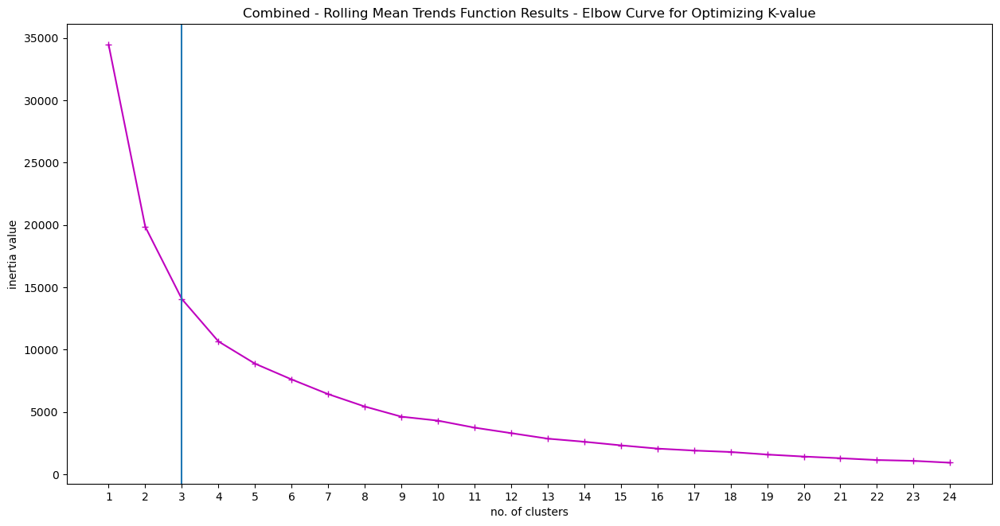

Cell,Movie 1_Cell 2,Movie 1_Cell 3,Movie 1_Cell 4,Movie 1_cell 5,Movie 1_Cell 6,Movie 1_Cell 7,Movie 1_Cell 9,Movie 1_Cell 10,Movie 1_Cell 11,Movie 1_Cell 12,Movie 1_Cell 14,Movie 1_Cell 15,Movie 1_cell 16,Movie 1_Cell 17,Movie 1_Cell 18,Movie 1_Cell 19,Movie 1_Cell 20,Movie 1_Cell 21,Movie 1_Cell 22,Movie 1_Cell 23,Movie 1_Cell 24,Movie 1_Cell 25,Movie 1_Cell 26,Movie 1_Cell 2.1,Movie 1_Cell 3.1,Movie 1_Cell 4.1,Movie 1_cell 5.1,Movie 1_Cell 6.1,Movie 1_Cell 7.1,Movie 1_Cell 9.1,Movie 1_Cell 10.1,Movie 1_Cell 11.1,Movie 1_Cell 12.1,Movie 1_Cell 13.1,Movie 1_Cell 14.1,Movie 1_Cell 15.1,Movie 1_cell 16.1,Movie 1_M,Movie 1_N,Movie 1_O,Movie 2_P,Movie 2_R,Movie 2_S,Movie 2_T,Movie 2_U,Movie 2_W,Movie 2_V,Movie 2_Y,Movie 2_Z,Movie 2_X,Movie 2_Cell 1,Movie 2_Cell 2,Movie 2_Cell 3,Movie 2_Cell 4,Movie 2_Cell 5,Movie 2_Cell C1,Movie 2_Cell C2,Movie 2_Cell C3,Movie 2_Cell C4,Movie 2_Cell C5,Movie 2_Cell 11,Movie 2_Cell 12,Movie 2_Cell 13,Movie 2_Cell 14,Movie 2_15 (purple),Movie 2_15 (white),Movie 2_Cell 16,Movie 2_Cell 18,Movie 2_Cell 22,Movie 2_Cell 23,Movie 2_Cell 34,Movie 2_Cell 36,Movie 3_Cell 1,Movie 3_Cell 2,Movie 3_Cell 3,Movie 3_Cell 4,Movie 3_Cell 5,Movie 3_Cell 6,Movie 3_Cell 7,Movie 3_Cell 8,Movie 3_Cell 9,Movie 3_Cell 10,Movie 3_Cell 11,Movie 3_Cell 12,Movie 3_Cell 13,Movie 3_Cell 14,Movie 3_Cell 15,Movie 3_Cell 21,Movie 3_Cell 22,Movie 3_Cell 23,Movie 3_Cell 24,Movie 3_Cell 25,Movie 3_Cell 26,Movie 3_Cell 27,Movie 3_Cell 28,Movie 3_Cell 29,Movie 3_Cell 30,Movie 3_Cell 31,Movie 3_Cell 34,Movie 3_Cell 37,Movie 3_Cell 38,Movie 3_Cell 39,Movie 3_Cell 40,Movie 3_Cell 41,Movie 3_Cell 42,Movie 3_Cell 43,Movie 3_Cell 44,Movie 3_Cell 45,Movie 3_Cell 46,Movie 3_Cell 47,Movie 3_Cell 48,Movie 3_Cell 49,Movie 3_Cell 50,Movie 3_Cell 51,Movie 3_Cell 52,Movie 3_Cell 53,Movie 3_Cell 54,Movie 3_Cell 55,Movie 3_Cell 56,Movie 3_Cell 57
Cluster,0,0,0,0,0,0,1,0,0,0,0,0,2,0,2,0,0,0,2,0,0,0,0,2,2,0,0,0,0,2,2,2,2,2,2,2,2,2,1,1,0,0,0,0,0,0,0,2,0,0,2,1,0,2,0,0,0,2,2,2,1,2,2,2,2,2,2,2,1,1,1,1,0,0,0,2,2,2,2,1,2,1,0,0,0,2,1,1,1,1,1,1,1,1,1,1,2,1,2,2,2,2,1,1,1,1,1,2,1,1,1,2,1,1,1,1,1,1,1,1
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,4.604450,5.217000,6.284200,6.778250,9.189250,8.378900,30.037600,12.410300,11.698800,7.588400,9.295840,11.698800,13.690800,8.378900,18.971100,7.209020,11.461700,12.173000,23.002500,13.042600,10.038900,9.011300,0.000000,12.718065,12.700978,12.862969,13.024960,13.186951,9.612414,9.396629,9.180843,8.965057,8.749271,8.533485,8.317699,8.101913,7.886127,16.046400,16.836800,22.528200,11.777900,9.564600,11.224600,7.746500,6.798000,9.406500,7.884862,12.805500,9.169400,9.248400,19.094811,28.168792,5.220826,19.173715,7.924234,7.924739,7.297036,9.886307,17.183344,11.612488,25.848100,12.410300,13.991200,9.959800,17.943500,12.647400,15.888300,11.936000,23.555800,20.156800,24.346200,32.567000,11.773000,6.156000,10.388000,19.314000,22.930000,12.696200,13.465700,26.777400,21.622000,28.624100,12.542000,4.463000,10.465000,9.541000,21.006000,19.313600,55.940200,30.624700,32.625400,50.092200,34.395100,19.775300,39.935300,37.242200,21.929800,18.621100,19.467500,15.697100,23.160900,15.620200,29.778300,20.160000,28.931900,21.391200,23.468700,13.850400,26.008000,29.701400,18.159400,16.697400,23.314800,20.698600,17.697700,25.315400,21.468100,31.932800,15.697100,33.856500
20,4.578755,5.177500,6.290783,6.898795,9.163525,7.983650,30.235200,12.449800,13.675000,9.366950,9.351170,13.675000,13.722417,7.983650,20.710100,7.214293,10.078400,11.343000,19.326850,13.279750,10.355050,9.208900,4.347550,12.617401,12.629753,12.789483,12.949213,13.108942,9.932523,9.710380,9.488238,9.266095,9.043953,8.821811,8.599668,8.377526,8.155384,17.390200,17.390150,21.342500,11.619800,9.446050,11.343150,7.390800,7.272250,10.394600,8.131881,12.410250,9.327450,9.564600,20.515086,25.209885,5.298791,16.135905,7.833353,9.023217,6.159326,10.984786,15.064849,12.789429,21.737700,12.133600,15.216

In [81]:
#Combined - KMeans Clustering Analysis of Rolling Mean Stats Function
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# elbow curve to determine optimal number of clusters at inflection point
inertia = []
k_cluster_range = range(1,25)
for k in k_cluster_range: 
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=123)
    kmeans.fit(rolling_mean_area_results)
    inertia.append(kmeans.inertia_)
    
# plot of the inertia elbow curve 
plt.figure(figsize=(15, 7.5))
plt.plot(k_cluster_range, inertia, 'm+-')
plt.axvline(x=3)
plt.xticks(k_cluster_range)
plt.xlabel('no. of clusters')
plt.ylabel('inertia value')
plt.title('Combined - Rolling Mean Trends Function Results - Elbow Curve for Optimizing K-value')
plt.show()

# set optimal_k_value based upon elbow curve inflection point
optimal_k_value = 3
kmeans = KMeans(n_clusters=optimal_k_value, random_state=123, n_init=10)

# transpose the rolling_mean_area_results dataframe to cluster across cell feature data 
cluster_labels = kmeans.fit_predict(rolling_mean_area_results.T)

# generate a cell / cluster dataframe separately for quick vertical lookup
cluster_labels_df = pd.DataFrame(cluster_labels, index=rolling_mean_area_results.columns, columns=['Cluster Labels'])

# create multi-index for columns
new_columns = pd.MultiIndex.from_tuples(
    [(cell, cluster_labels_df.loc[cell, 'Cluster Labels']) for cell in rolling_mean_area_results.columns],
    names=['Cell', 'Cluster']
)
rolling_mean_area_results.columns = new_columns
display(rolling_mean_area_results)

/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/61650661.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors=plt.cm.get_cmap('tab10', optimal_k_value)


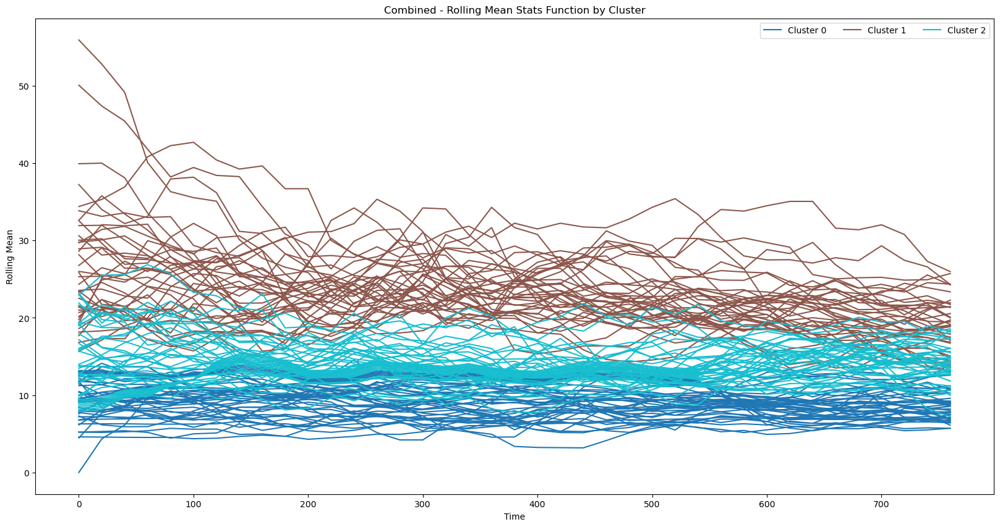

In [82]:
# plot results and color code according to cluster data
plt.figure(figsize=(20, 10))
# create colormap for the x-number of clusters
colors=plt.cm.get_cmap('tab10', optimal_k_value)
for cluster in range(optimal_k_value):
    # return index object of names of cells pertaining to specific cluster number
    cluster_cells = rolling_mean_area_results.columns.get_level_values('Cell')[rolling_mean_area_results.columns.get_level_values('Cluster') == cluster]
    for cell in cluster_cells: 
        plt.plot(rolling_mean_area_results[cell].index, rolling_mean_area_results[cell], color=colors(cluster), label=f'Cluster {cluster}' if cell == cluster_cells[0] else "")
plt.legend(ncol=optimal_k_value)
plt.title('Combined - Rolling Mean Stats Function by Cluster')
plt.xlabel('Time')
plt.ylabel('Rolling Mean')
plt.show()

In [83]:
print(silhouette_score(rolling_mean_area_results.T, cluster_labels))

0.41243880242273884


### KMeans Clustering Analysis of Rolling Mean Stats Function (Delta Trend and Combined Movies)

In [84]:
delta_combined = check_combined_df_movie_level.xs('delta', level='Trend', axis=1)

In [85]:
delta_combined.head()

Movie            Movie 1                                                   \
Cell              Cell 2   Cell 3    Cell 4    cell 5    Cell 6    Cell 7   
Interval [min]                                                              
0               0.158100 -0.21750 -1.976200 -0.553333 -0.316333  0.296425   
20              0.098800 -0.26880 -0.474300 -0.039525 -0.197750 -0.790500   
40              0.031620  0.15800 -0.316200 -0.268760 -0.031600  2.371400   
60              0.171267  0.15800 -0.434775 -0.197617 -0.316167  1.660000   
80              0.135514  0.13825 -0.063240 -0.011300 -0.225857 -2.766600   

Movie                                                                       \
Cell              Cell 9   Cell 10   Cell 11   Cell 12   Cell 14   Cell 15   
Interval [min]                                                               
0              -1.047363 -0.306312 -0.118563 -0.069163  0.276675 -0.118563   
20              0.395200  0.079000  3.952400  3.557100  0.411040  3.952400   
40             -7.983700 -2.134200 -1.976200 -4.347500 -0.079050 -1.976200   
60              7.272300  2.845600 -1.976200  1.818000  0.045171 -1.976200   
80             -0.632400 -0.395200 -1.264700 -0.632300 -0.059287 -1.264700   

Movie                                                                     \
Cell             cell 16   Cell 17  Cell 18   Cell 19   Cell 20  Cell 21   
Interval [min]                                                             
0              -0.118575  0.296425 -0.38535 -0.098800 -0.197612 -0.01975   
20              0.252940 -0.790500  3.47800 -0.015800 -2.766600 -1.66000   
40             -0.158100  2.371400 -3.00370 -0.289833  1.501900  3.16200   
60              0.237143  1.660000  4.66370 -0.338771 -0.632400 -1.50200   
80              0.138325 -2.766600 -6.56080 -0.098812  1.897100  0.94900   

Movie                                                                       \
Cell              Cell 22   Cell 23  Cell 24   Cell 25   Cell 26  Cell 2.1   
Interval [min]                                                               
0               -0.741062 -0.494038 -0.02965  0.207487  0.191971 -0.249197   
20              -7.351300  0.474300  0.63230  0.395200 -0.049400 -0.315928   
40              10.038800 -2.450400 -1.26470  0.000000  1.027600 -0.495080   
60             -10.987400  0.948500 -0.71140 -1.343800  1.027600 -0.133484   
80               7.746500  2.687600  0.00000  0.711400 -2.371400 -0.125008   

Movie                                                                       \
Cell            Cell 3.1  Cell 4.1  cell 5.1  Cell 6.1  Cell 7.1  Cell 9.1   
Interval [min]                                                               
0               0.138963  0.176710  0.214457  0.252204  0.449499  0.500993   
20             -0.004317  0.013618  0.031553  0.049488  0.640216  0.627503   
40             -0.216651 -0.212812 -0.208972 -0.205133  2.296262  2.558310   
60              0.072086  0.093950  0.115814  0.137678 -2.414829 -2.676877   
80              0.046675  0.058675  0.070674  0.082674  1.914534  2.188216   

Movie                                                                       \
Cell           Cell 10.1 Cell 11.1 Cell 12.1 Cell 13.1 Cell 14.1 Cell 15.1   
Interval [min]                                                               
0               0.552488  0.603983  0.655478  0.706973  0.758468  0.809963   
20              0.614790  0.602077  0.589364  0.576651  0.563938  0.551226   
40              2.820359  3.082408  3.344456  3.606505  3.868554  4.130602   
60             -2.938924 -3.200972 -3.463020 -3.725068 -3.987116 -4.249164   
80              2.461898  2.735580  3.009262  3.282944  3.556626  3.830308   

Movie                                                  Movie 2          \
Cell           cell 16.1         M         N         O       P       R   
Interval [min]                                                           
0               0.861457  0.395225  0.602737 -0.0691

In [86]:
delta_combined.columns = ['_'.join(col).strip() for col in delta_combined.columns.values]

In [87]:
#Combined Rolling Mean Stats results (Delta)
rolling_mean_delta_results = rolling_mean_combined(delta_combined)

/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/1079516689.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_rolling_mean_combined[col] = df[col].rolling(window=3, min_periods=1).mean()
/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/1079516689.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_rolling_mean_combined[col] = df[col].rolling(window=3, min_periods=1).mean()
/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/1079516689.py:5: PerformanceWarning: DataFrame is hig

In [88]:
rolling_mean_delta_results.head()

,Movie 1_Cell 2,Movie 1_Cell 3,Movie 1_Cell 4,Movie 1_cell 5,Movie 1_Cell 6,Movie 1_Cell 7,Movie 1_Cell 9,Movie 1_Cell 10,Movie 1_Cell 11,Movie 1_Cell 12,Movie 1_Cell 14,Movie 1_Cell 15,Movie 1_cell 16,Movie 1_Cell 17,Movie 1_Cell 18,Movie 1_Cell 19,Movie 1_Cell 20,Movie 1_Cell 21,Movie 1_Cell 22,Movie 1_Cell 23,Movie 1_Cell 24,Movie 1_Cell 25,Movie 1_Cell 26,Movie 1_Cell 2.1,Movie 1_Cell 3.1,Movie 1_Cell 4.1,Movie 1_cell 5.1,Movie 1_Cell 6.1,Movie 1_Cell 7.1,Movie 1_Cell 9.1,Movie 1_Cell 10.1,Movie 1_Cell 11.1,Movie 1_Cell 12.1,Movie 1_Cell 13.1,Movie 1_Cell 14.1,Movie 1_Cell 15.1,Movie 1_cell 16.1,Movie 1_M,Movie 1_N,Movie 1_O,Movie 2_P,Movie 2_R,Movie 2_S,Movie 2_T,Movie 2_U,Movie 2_W,Movie 2_V,Movie 2_Y,Movie 2_Z,Movie 2_X,Movie 2_Cell 1,Movie 2_Cell 2,Movie 2_Cell 3,Movie 2_Cell 4,Movie 2_Cell 5,Movie 2_Cell C1,Movie 2_Cell C2,Movie 2_Cell C3,Movie 2_Cell C4,Movie 2_Cell C5,Movie 2_Cell 11,Movie 2_Cell 12,Movie 2_Cell 13,Movie 2_Cell 14,Movie 2_15 (purple),Movie 2_15 (white),Movie 2_Cell 16,Movie 2_Cell 18,Movie 2_Cell 22,Movie 2_Cell 23,Movie 2_Cell 34,Movie 2_Cell 36,Movie 3_Cell 1,Movie 3_Cell 2,Movie 3_Cell 3,Movie 3_Cell 4,Movie 3_Cell 5,Movie 3_Cell 6,Movie 3_Cell 7,Movie 3_Cell 8,Movie 3_Cell 9,Movie 3_Cell 10,Movie 3_Cell 11,Movie 3_Cell 12,Movie 3_Cell 13,Movie 3_Cell 14,Movie 3_Cell 15,Movie 3_Cell 21,Movie 3_Cell 22,Movie 3_Cell 23,Movie 3_Cell 24,Movie 3_Cell 25,Movie 3_Cell 26,Movie 3_Cell 27,Movie 3_Cell 28,Movie 3_Cell 29,Movie 3_Cell 30,Movie 3_Cell 31,Movie 3_Cell 34,Movie 3_Cell 37,Movie 3_Cell 38,Movie 3_Cell 39,Movie 3_Cell 40,Movie 3_Cell 41,Movie 3_Cell 42,Movie 3_Cell 43,Movie 3_Cell 44,Movie 3_Cell 45,Movie 3_Cell 46,Movie 3_Cell 47,Movie 3_Cell 48,Movie 3_Cell 49,Movie 3_Cell 50,Movie 3_Cell 51,Movie 3_Cell 52,Movie 3_Cell 53,Movie 3_Cell 54,Movie 3_Cell 55,Movie 3_Cell 56,Movie 3_Cell 57
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.158100,-0.217500,-1.976200,-0.553333,-0.316333,0.296425,-1.047363,-0.306312,-1.185625e-01,-0.069163,0.276675,-1.185625e-01,-0.118575,0.296425,-0.385350,-0.098800,-0.197612,-0.019750,-0.741062,-0.494038,-0.029650,0.207487,0.191971,-0.249197,0.138963,0.176710,0.214457,0.252204,0.449499,0.500993,0.552488,0.603983,0.655478,0.706973,0.758468,0.809963,0.861457,0.395225,0.602737,-0.069175,-0.316200,-0.237100,2.371000e-01,-7.114000e-01,0.948500,1.976200,0.049400,-0.790500,0.316100,0.632400,2.840550,-5.917813,0.289315,-6.075622,-0.304345,2.196957,-2.275420,2.196957,-4.236989,2.353883,-8.220800,-0.553400,2.450400,3.636100,-3.478000,4.742800,3.003700,0.395200,0.316200,4.426600,4.268500,-5.8494,-6.848000,3.847000,-3.001000,4.770000,5.156000,-1.769800,2.462200,4.539900,-2.000600,6.848300,3.155000e+00,6.463000,-2.001000,5.156000,0.077000,11.618900,-6.232700,-5.001500,6.309600,-5.386200,1.846800,10.233900,0.153900,-6.463600,-6.155700,3.77040,-1.462000,-1.846700,-6.771300,4.001200,0.615600,4.386000,0.384800,-2.462300,-4.462900,-0.384700,-0.923400,3.4626,0.307800,-4.155100,2.539300,1.539000,6.848300,0.153900,-1.000300,0.077000,2.847000,-1.462000
20,0.128450,-0.243150,-1.225250,-0.296429,-0.257042,-0.247037,-0.326081,-0.113656,1.916919e+00,1.743969,0.343857,1.916919e+00,0.067183,-0.247037,1.546325,-0.057300,-1.482106,-0.839875,-4.046181,-0.009869,0.301325,0.301344,0.071286,-0.282563,0.067323,0.095164,0.123005,0.150846,0.544857,0.564248,0.583639,0.603030,0.622421,0.641812,0.661203,0.680594,0.699985,1.541413,0.854719,-1.220287,-0.434750,-0.592850,-7.905000e-01,7.509500e-01,-0.118600,0.988100,-0.014800,-0.909050,0.513800,-0.197600,0.118356,1.696440,0.325010,-2.524934,-0.314912,-0.823859,-0.941553,1.020016,-3.687750,-0.745396,-2.410900,0.553300,2.964200,4.268500,-1.580950,-0.632350,1.541400,0.988050,-1.264750,-1.936650,-0.079050,-5.5332,0.346000,1.539000,-1.500500,0.115000,1.423500,-1.423500,0.038450,-2.808550,-1.577400,1.500500,-8.080000e-01,2.808500,-1.154500,4.809500,-3.347000,2.154500,-7.040600

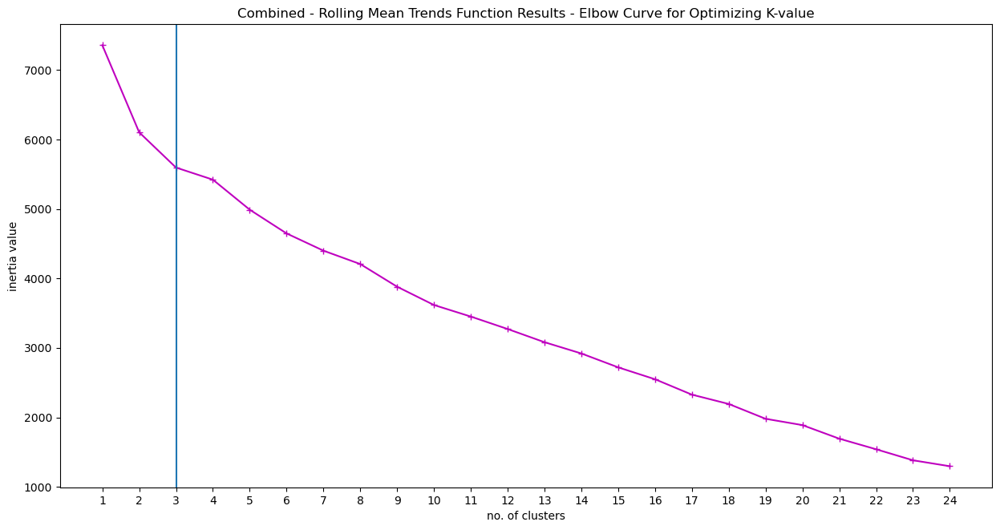

Cell,Movie 1_Cell 2,Movie 1_Cell 3,Movie 1_Cell 4,Movie 1_cell 5,Movie 1_Cell 6,Movie 1_Cell 7,Movie 1_Cell 9,Movie 1_Cell 10,Movie 1_Cell 11,Movie 1_Cell 12,Movie 1_Cell 14,Movie 1_Cell 15,Movie 1_cell 16,Movie 1_Cell 17,Movie 1_Cell 18,Movie 1_Cell 19,Movie 1_Cell 20,Movie 1_Cell 21,Movie 1_Cell 22,Movie 1_Cell 23,Movie 1_Cell 24,Movie 1_Cell 25,Movie 1_Cell 26,Movie 1_Cell 2.1,Movie 1_Cell 3.1,Movie 1_Cell 4.1,Movie 1_cell 5.1,Movie 1_Cell 6.1,Movie 1_Cell 7.1,Movie 1_Cell 9.1,Movie 1_Cell 10.1,Movie 1_Cell 11.1,Movie 1_Cell 12.1,Movie 1_Cell 13.1,Movie 1_Cell 14.1,Movie 1_Cell 15.1,Movie 1_cell 16.1,Movie 1_M,Movie 1_N,Movie 1_O,Movie 2_P,Movie 2_R,Movie 2_S,Movie 2_T,Movie 2_U,Movie 2_W,Movie 2_V,Movie 2_Y,Movie 2_Z,Movie 2_X,Movie 2_Cell 1,Movie 2_Cell 2,Movie 2_Cell 3,Movie 2_Cell 4,Movie 2_Cell 5,Movie 2_Cell C1,Movie 2_Cell C2,Movie 2_Cell C3,Movie 2_Cell C4,Movie 2_Cell C5,Movie 2_Cell 11,Movie 2_Cell 12,Movie 2_Cell 13,Movie 2_Cell 14,Movie 2_15 (purple),Movie 2_15 (white),Movie 2_Cell 16,Movie 2_Cell 18,Movie 2_Cell 22,Movie 2_Cell 23,Movie 2_Cell 34,Movie 2_Cell 36,Movie 3_Cell 1,Movie 3_Cell 2,Movie 3_Cell 3,Movie 3_Cell 4,Movie 3_Cell 5,Movie 3_Cell 6,Movie 3_Cell 7,Movie 3_Cell 8,Movie 3_Cell 9,Movie 3_Cell 10,Movie 3_Cell 11,Movie 3_Cell 12,Movie 3_Cell 13,Movie 3_Cell 14,Movie 3_Cell 15,Movie 3_Cell 21,Movie 3_Cell 22,Movie 3_Cell 23,Movie 3_Cell 24,Movie 3_Cell 25,Movie 3_Cell 26,Movie 3_Cell 27,Movie 3_Cell 28,Movie 3_Cell 29,Movie 3_Cell 30,Movie 3_Cell 31,Movie 3_Cell 34,Movie 3_Cell 37,Movie 3_Cell 38,Movie 3_Cell 39,Movie 3_Cell 40,Movie 3_Cell 41,Movie 3_Cell 42,Movie 3_Cell 43,Movie 3_Cell 44,Movie 3_Cell 45,Movie 3_Cell 46,Movie 3_Cell 47,Movie 3_Cell 48,Movie 3_Cell 49,Movie 3_Cell 50,Movie 3_Cell 51,Movie 3_Cell 52,Movie 3_Cell 53,Movie 3_Cell 54,Movie 3_Cell 55,Movie 3_Cell 56,Movie 3_Cell 57
Cluster,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,1,2,1,2,2,2,2,1,2,1,2,2,0,2,0,2,2,2,2,2,1,1,0,2,0,0,2,2,2,1,0,2,0,2,0,2,0,1,1,0,1,2,0,2,1,1,0,2,2,1,0,2,0,2,2,1,2,2,2,2,1,2,2,0,2,2,2,2,2
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.158100,-2.175000e-01,-1.976200,-0.553333,-0.316333,2.964250e-01,-1.047363,-3.063125e-01,-1.185625e-01,-6.916250e-02,2.766750e-01,-1.185625e-01,-0.118575,2.964250e-01,-0.385350,-0.098800,-1.976125e-01,-0.019750,-0.741062,-4.940375e-01,-0.029650,2.074875e-01,1.919714e-01,-0.249197,0.138963,0.176710,0.214457,0.252204,0.449499,0.500993,0.552488,0.603983,0.655478,0.706973,0.758468,8.099625e-01,0.861457,0.395225,0.602737,-0.069175,-0.316200,-0.237100,2.371000e-01,-7.114000e-01,0.948500,1.976200,4.940000e-02,-7.905000e-01,0.316100,0.632400,2.840550,-5.917813,0.289315,-6.075622,-0.304345,2.196957,-2.275420e+00,2.196957,-4.236989,2.353883,-8.220800,-5.534000e-01,2.450400,3.636100,-3.478000,4.742800,3.003700,0.395200,0.316200,4.426600,4.268500,-5.849400,-6.848000,3.847000,-3.001000,4.770000,5.156000,-1.769800e+00,2.462200,4.539900,-2.000600,6.848300e+00,3.155000e+00,6.463000,-2.001000,5.156000,0.077000,1.161890e+01,-6.232700,-5.001500,6.309600,-5.386200e+00,1.846800e+00,10.233900,0.153900,-6.463600,-6.155700,3.770400,-1.462000,-1.846700,-6.771300e+00,4.001200,0.615600,4.386000,0.384800,-2.462300,-4.462900,-0.384700,-9.234000e-01,3.462600,3.078000e-01,-4.155100,2.539300,1.539000,6.848300,0.153900,-1.000300,7.700000e-02,2.847000,-1.462000
20,0.128450,-2.431500e-01,-1.225250,-0.296429,-0.257042,-2.470375e-01,-0.326081,-1.136562e-01,1.916919e+00,1.743969e+00,3.438575e-01,1.916919e+00,0.067183,-2.470375e-01,1.546325,-0.057300,-1.482106e+00,-0.839875,-4.046181,-9.868750e-03,0.301325,3.013437e-01,7.128571e-02,-0.282563,0.067323,0.095164,0.123005,0.150846,0.544857,0.564248,0.583639,0.603030,0.622421,0.641812,0.661203,6.805940e-01,0.699985,1.541413,0.854719,-1.220287,-0.434750,-0.592850,-7.905000e-01,7.509500e-01,-0.118600,0.988100,-1.480000e-02,-9

In [89]:
#Combined - KMeans Clustering Analysis of Rolling Mean Stats Function (Delta)
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# elbow curve to determine optimal number of clusters at inflection point
inertia = []
k_cluster_range = range(1,25)
for k in k_cluster_range: 
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=123)
    kmeans.fit(rolling_mean_delta_results)
    inertia.append(kmeans.inertia_)
    
# plot of the inertia elbow curve 
plt.figure(figsize=(15, 7.5))
plt.plot(k_cluster_range, inertia, 'm+-')
plt.axvline(x=3)
plt.xticks(k_cluster_range)
plt.xlabel('no. of clusters')
plt.ylabel('inertia value')
plt.title('Combined - Rolling Mean Trends Function Results - Elbow Curve for Optimizing K-value')
plt.show()

# set optimal_k_value based upon elbow curve inflection point
optimal_k_value = 3
kmeans = KMeans(n_clusters=optimal_k_value, random_state=123, n_init=10)

# transpose the rolling_mean_area_results dataframe to cluster across cell feature data 
cluster_labels = kmeans.fit_predict(rolling_mean_delta_results.T)

# generate a cell / cluster dataframe separately for quick vertical lookup
cluster_labels_df = pd.DataFrame(cluster_labels, index=rolling_mean_delta_results.columns, columns=['Cluster Labels'])

# create multi-index for columns
new_columns = pd.MultiIndex.from_tuples(
    [(cell, cluster_labels_df.loc[cell, 'Cluster Labels']) for cell in rolling_mean_delta_results.columns],
    names=['Cell', 'Cluster']
)
rolling_mean_delta_results.columns = new_columns
display(rolling_mean_delta_results)

/var/folders/cm/tktrtlqx28b5h_5dmq9wsy0h0000gn/T/ipykernel_57425/1580863325.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors=plt.cm.get_cmap('tab10', optimal_k_value)


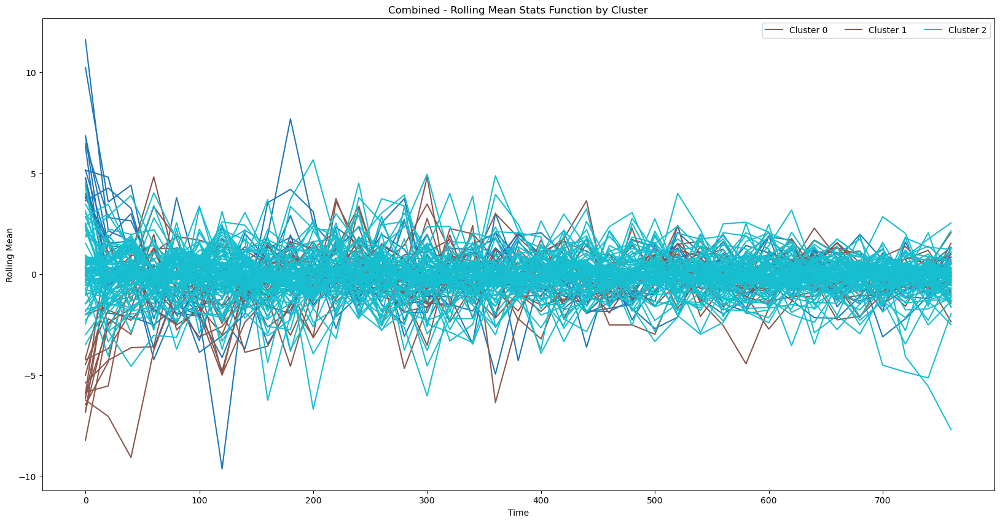

In [90]:
# plot results and color code according to cluster data
plt.figure(figsize=(20, 10))
# create colormap for the x-number of clusters
colors=plt.cm.get_cmap('tab10', optimal_k_value)
for cluster in range(optimal_k_value):
    # return index object of names of cells pertaining to specific cluster number
    cluster_cells = rolling_mean_delta_results.columns.get_level_values('Cell')[rolling_mean_delta_results.columns.get_level_values('Cluster') == cluster]
    for cell in cluster_cells: 
        plt.plot(rolling_mean_delta_results[cell].index, rolling_mean_delta_results[cell], color=colors(cluster), label=f'Cluster {cluster}' if cell == cluster_cells[0] else "")
plt.legend(ncol=optimal_k_value)
plt.title('Combined - Rolling Mean Stats Function by Cluster')
plt.xlabel('Time')
plt.ylabel('Rolling Mean')
plt.show()

In [91]:
print(silhouette_score(rolling_mean_delta_results.T, cluster_labels))

0.20469636088060572


#### From the above results of KMeans clustering we can observe the following:
#### 1. When using rolling mean statistics function feature on cell area data, kmeans clustering for combined data gives three clusters. However, the silhouette score is low (< 0.5), hence the clusters are not well separated. So, it's not a good idea to use kmeans in this case.
#### 2. Similarly, by using rolling mean statistics function feature on delta trend data, kmeans clustering for combined data gives three clusters. However, the silhouette score is too low (closer to 0), hence the clusters are not well separated. So, it's not a good idea to use kmeans in this case.

### Hierarchical Clustering
### Combined data for area trend  - Rolling Mean Statistical Function

In [92]:
rolling_mean_area_results.columns = rolling_mean_area_results.columns.droplevel(1)

In [93]:
rolling_mean_area_results.head()

Cell,Movie 1_Cell 2,Movie 1_Cell 3,Movie 1_Cell 4,Movie 1_cell 5,Movie 1_Cell 6,Movie 1_Cell 7,Movie 1_Cell 9,Movie 1_Cell 10,Movie 1_Cell 11,Movie 1_Cell 12,Movie 1_Cell 14,Movie 1_Cell 15,Movie 1_cell 16,Movie 1_Cell 17,Movie 1_Cell 18,Movie 1_Cell 19,Movie 1_Cell 20,Movie 1_Cell 21,Movie 1_Cell 22,Movie 1_Cell 23,Movie 1_Cell 24,Movie 1_Cell 25,Movie 1_Cell 26,Movie 1_Cell 2.1,Movie 1_Cell 3.1,Movie 1_Cell 4.1,Movie 1_cell 5.1,Movie 1_Cell 6.1,Movie 1_Cell 7.1,Movie 1_Cell 9.1,Movie 1_Cell 10.1,Movie 1_Cell 11.1,Movie 1_Cell 12.1,Movie 1_Cell 13.1,Movie 1_Cell 14.1,Movie 1_Cell 15.1,Movie 1_cell 16.1,Movie 1_M,Movie 1_N,Movie 1_O,Movie 2_P,Movie 2_R,Movie 2_S,Movie 2_T,Movie 2_U,Movie 2_W,Movie 2_V,Movie 2_Y,Movie 2_Z,Movie 2_X,Movie 2_Cell 1,Movie 2_Cell 2,Movie 2_Cell 3,Movie 2_Cell 4,Movie 2_Cell 5,Movie 2_Cell C1,Movie 2_Cell C2,Movie 2_Cell C3,Movie 2_Cell C4,Movie 2_Cell C5,Movie 2_Cell 11,Movie 2_Cell 12,Movie 2_Cell 13,Movie 2_Cell 14,Movie 2_15 (purple),Movie 2_15 (white),Movie 2_Cell 16,Movie 2_Cell 18,Movie 2_Cell 22,Movie 2_Cell 23,Movie 2_Cell 34,Movie 2_Cell 36,Movie 3_Cell 1,Movie 3_Cell 2,Movie 3_Cell 3,Movie 3_Cell 4,Movie 3_Cell 5,Movie 3_Cell 6,Movie 3_Cell 7,Movie 3_Cell 8,Movie 3_Cell 9,Movie 3_Cell 10,Movie 3_Cell 11,Movie 3_Cell 12,Movie 3_Cell 13,Movie 3_Cell 14,Movie 3_Cell 15,Movie 3_Cell 21,Movie 3_Cell 22,Movie 3_Cell 23,Movie 3_Cell 24,Movie 3_Cell 25,Movie 3_Cell 26,Movie 3_Cell 27,Movie 3_Cell 28,Movie 3_Cell 29,Movie 3_Cell 30,Movie 3_Cell 31,Movie 3_Cell 34,Movie 3_Cell 37,Movie 3_Cell 38,Movie 3_Cell 39,Movie 3_Cell 40,Movie 3_Cell 41,Movie 3_Cell 42,Movie 3_Cell 43,Movie 3_Cell 44,Movie 3_Cell 45,Movie 3_Cell 46,Movie 3_Cell 47,Movie 3_Cell 48,Movie 3_Cell 49,Movie 3_Cell 50,Movie 3_Cell 51,Movie 3_Cell 52,Movie 3_Cell 53,Movie 3_Cell 54,Movie 3_Cell 55,Movie 3_Cell 56,Movie 3_Cell 57
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,4.604450,5.217000,6.284200,6.778250,9.189250,8.378900,30.037600,12.410300,11.698800,7.588400,9.295840,11.698800,13.690800,8.378900,18.971100,7.209020,11.461700,12.173000,23.002500,13.042600,10.038900,9.011300,0.000000,12.718065,12.700978,12.862969,13.024960,13.186951,9.612414,9.396629,9.180843,8.965057,8.749271,8.533485,8.317699,8.101913,7.886127,16.046400,16.836800,22.528200,11.777900,9.564600,11.224600,7.7465,6.798000,9.406500,7.884862,12.805500,9.169400,9.248400,19.094811,28.168792,5.220826,19.173715,7.924234,7.924739,7.297036,9.886307,17.183344,11.612488,25.848100,12.410300,13.991200,9.959800,17.943500,12.647400,15.888300,11.936000,23.555800,20.156800,24.346200,32.5670,11.773000,6.156000,10.388000,19.314000,22.930000,12.696200,13.465700,26.777400,21.622000,28.624100,12.542000,4.463000,10.465000,9.541000,21.006000,19.313600,55.940200,30.624700,32.625400,50.092200,34.395100,19.775300,39.935300,37.242200,21.929800,18.6211,19.467500,15.697100,23.160900,15.620200,29.778300,20.160000,28.931900,21.391200,23.468700,13.850400,26.008000,29.701400,18.159400,16.697400,23.314800,20.698600,17.697700,25.315400,21.468100,31.932800,15.697100,33.856500
20,4.578755,5.177500,6.290783,6.898795,9.163525,7.983650,30.235200,12.449800,13.675000,9.366950,9.351170,13.675000,13.722417,7.983650,20.710100,7.214293,10.078400,11.343000,19.326850,13.279750,10.355050,9.208900,4.347550,12.617401,12.629753,12.789483,12.949213,13.108942,9.932523,9.710380,9.488238,9.266095,9.043953,8.821811,8.599668,8.377526,8.155384,17.390200,17.390150,21.342500,11.619800,9.446050,11.343150,7.3908,7.272250,10.394600,8.131881,12.410250,9.327450,9.564600,20.515086,25.209885,5.298791,16.135905,7.833353,9.023217,6.159326,10.984786,15.064849,12.789429,21.737700,12.133600,15.216400,11.777850,16.204500,15.018800,17.390150,12.133600,23.713900,22.370100,26.480450,29.6423,8.349000,8.079500,8.887500,21.699000,25.508000,11.811300,14.696800,29.047350,20.621700,32.048250,14.119500,7.694500,9.464500,12.119000,21.044500,25.123050,52.823850

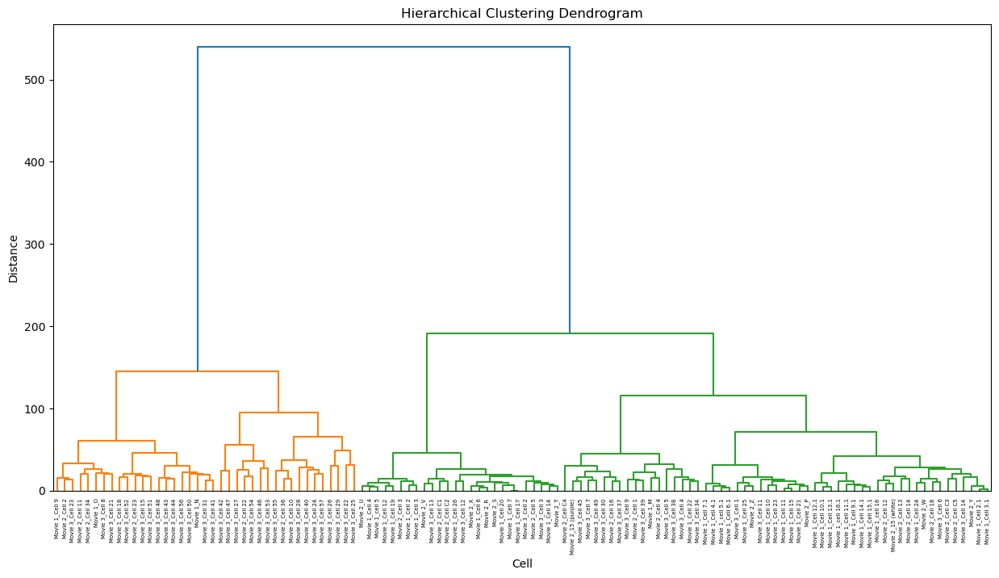

In [94]:
# Hierarchical Clustering using Ward's method
Z = linkage(rolling_mean_area_results.T, method='ward', metric='euclidean')

# Plot the Dendrogram
plt.figure(figsize=(15, 7.5))
dendrogram(Z, labels=rolling_mean_area_results.columns, leaf_rotation=90)
plt.xlabel('Cell')
plt.ylabel('Distance')
plt.title('Hierarchical Clustering Dendrogram')
plt.show()

In [95]:
# Determine clusters - here, we choose to form 4 clusters
optimal_k_value = 4
cluster_labels = fcluster(Z, optimal_k_value, criterion='maxclust')

# Assign the hierarchical cluster labels
cluster_labels_df = pd.DataFrame(cluster_labels, index=rolling_mean_area_results.columns, columns=['Cluster Labels'])

# Create multi-index for columns as you did before
new_columns = pd.MultiIndex.from_tuples(
    [(cell, cluster_labels_df.loc[cell, 'Cluster Labels']) for cell in rolling_mean_area_results.columns],
    names=['Cell', 'Cluster']
)
rolling_mean_area_results.columns = new_columns

In [96]:
rolling_mean_area_results

Cell,Movie 1_Cell 2,Movie 1_Cell 3,Movie 1_Cell 4,Movie 1_cell 5,Movie 1_Cell 6,Movie 1_Cell 7,Movie 1_Cell 9,Movie 1_Cell 10,Movie 1_Cell 11,Movie 1_Cell 12,Movie 1_Cell 14,Movie 1_Cell 15,Movie 1_cell 16,Movie 1_Cell 17,Movie 1_Cell 18,Movie 1_Cell 19,Movie 1_Cell 20,Movie 1_Cell 21,Movie 1_Cell 22,Movie 1_Cell 23,Movie 1_Cell 24,Movie 1_Cell 25,Movie 1_Cell 26,Movie 1_Cell 2.1,Movie 1_Cell 3.1,Movie 1_Cell 4.1,Movie 1_cell 5.1,Movie 1_Cell 6.1,Movie 1_Cell 7.1,Movie 1_Cell 9.1,Movie 1_Cell 10.1,Movie 1_Cell 11.1,Movie 1_Cell 12.1,Movie 1_Cell 13.1,Movie 1_Cell 14.1,Movie 1_Cell 15.1,Movie 1_cell 16.1,Movie 1_M,Movie 1_N,Movie 1_O,Movie 2_P,Movie 2_R,Movie 2_S,Movie 2_T,Movie 2_U,Movie 2_W,Movie 2_V,Movie 2_Y,Movie 2_Z,Movie 2_X,Movie 2_Cell 1,Movie 2_Cell 2,Movie 2_Cell 3,Movie 2_Cell 4,Movie 2_Cell 5,Movie 2_Cell C1,Movie 2_Cell C2,Movie 2_Cell C3,Movie 2_Cell C4,Movie 2_Cell C5,Movie 2_Cell 11,Movie 2_Cell 12,Movie 2_Cell 13,Movie 2_Cell 14,Movie 2_15 (purple),Movie 2_15 (white),Movie 2_Cell 16,Movie 2_Cell 18,Movie 2_Cell 22,Movie 2_Cell 23,Movie 2_Cell 34,Movie 2_Cell 36,Movie 3_Cell 1,Movie 3_Cell 2,Movie 3_Cell 3,Movie 3_Cell 4,Movie 3_Cell 5,Movie 3_Cell 6,Movie 3_Cell 7,Movie 3_Cell 8,Movie 3_Cell 9,Movie 3_Cell 10,Movie 3_Cell 11,Movie 3_Cell 12,Movie 3_Cell 13,Movie 3_Cell 14,Movie 3_Cell 15,Movie 3_Cell 21,Movie 3_Cell 22,Movie 3_Cell 23,Movie 3_Cell 24,Movie 3_Cell 25,Movie 3_Cell 26,Movie 3_Cell 27,Movie 3_Cell 28,Movie 3_Cell 29,Movie 3_Cell 30,Movie 3_Cell 31,Movie 3_Cell 34,Movie 3_Cell 37,Movie 3_Cell 38,Movie 3_Cell 39,Movie 3_Cell 40,Movie 3_Cell 41,Movie 3_Cell 42,Movie 3_Cell 43,Movie 3_Cell 44,Movie 3_Cell 45,Movie 3_Cell 46,Movie 3_Cell 47,Movie 3_Cell 48,Movie 3_Cell 49,Movie 3_Cell 50,Movie 3_Cell 51,Movie 3_Cell 52,Movie 3_Cell 53,Movie 3_Cell 54,Movie 3_Cell 55,Movie 3_Cell 56,Movie 3_Cell 57
Cluster,3,3,3,3,3,3,1,4,4,3,3,4,4,3,1,3,3,4,4,4,4,4,3,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,1,1,4,3,3,3,3,4,3,4,4,3,4,1,3,4,3,3,3,4,4,4,1,4,4,4,4,4,4,4,2,1,1,2,4,3,3,4,4,4,4,1,4,2,4,3,3,4,1,1,2,1,2,2,2,2,2,2,4,1,4,4,4,4,2,1,2,1,1,4,2,2,1,4,1,1,1,2,2,2,1,2
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,4.604450,5.217000,6.284200,6.778250,9.189250,8.378900,30.037600,12.410300,11.698800,7.588400,9.295840,11.698800,13.690800,8.378900,18.971100,7.209020,11.461700,12.173000,23.002500,13.042600,10.038900,9.011300,0.000000,12.718065,12.700978,12.862969,13.024960,13.186951,9.612414,9.396629,9.180843,8.965057,8.749271,8.533485,8.317699,8.101913,7.886127,16.046400,16.836800,22.528200,11.777900,9.564600,11.224600,7.746500,6.798000,9.406500,7.884862,12.805500,9.169400,9.248400,19.094811,28.168792,5.220826,19.173715,7.924234,7.924739,7.297036,9.886307,17.183344,11.612488,25.848100,12.410300,13.991200,9.959800,17.943500,12.647400,15.888300,11.936000,23.555800,20.156800,24.346200,32.567000,11.773000,6.156000,10.388000,19.314000,22.930000,12.696200,13.465700,26.777400,21.622000,28.624100,12.542000,4.463000,10.465000,9.541000,21.006000,19.313600,55.940200,30.624700,32.625400,50.092200,34.395100,19.775300,39.935300,37.242200,21.929800,18.621100,19.467500,15.697100,23.160900,15.620200,29.778300,20.160000,28.931900,21.391200,23.468700,13.850400,26.008000,29.701400,18.159400,16.697400,23.314800,20.698600,17.697700,25.315400,21.468100,31.932800,15.697100,33.856500
20,4.578755,5.177500,6.290783,6.898795,9.163525,7.983650,30.235200,12.449800,13.675000,9.366950,9.351170,13.675000,13.722417,7.983650,20.710100,7.214293,10.078400,11.343000,19.326850,13.279750,10.355050,9.208900,4.347550,12.617401,12.629753,12.789483,12.949213,13.108942,9.932523,9.710380,9.488238,9.266095,9.043953,8.821811,8.599668,8.377526,8.155384,17.390200,17.390150,21.342500,11.619800,9.446050,11.343150,7.390800,7.272250,10.394600,8.131881,12.410250,9.327450,9.564600,20.515086,25.209885,5.298791,16.135905,7.833353,9.023217,6.159326,10.984786,15.064849,12.789429,21.737700,12.133600,15.216

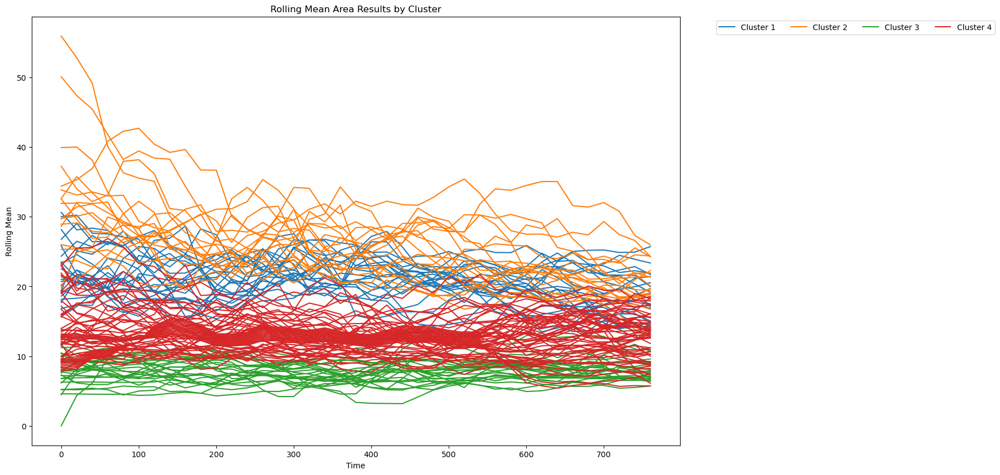

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the color palette (one color for each cluster)
palette = sns.color_palette("tab10", optimal_k_value)

plt.figure(figsize=(15, 10))

# Loop through each cluster and plot the data
for cluster in range(1, optimal_k_value + 1):
    # Get the data for the current cluster
    cluster_cells = rolling_mean_area_results.columns.get_level_values('Cell')[
        rolling_mean_area_results.columns.get_level_values('Cluster') == cluster]
    
    # Plot each cell in the current cluster
    for cell in cluster_cells:
        plt.plot(rolling_mean_area_results[cell].index, rolling_mean_area_results[cell], 
                 color=palette[cluster-1], label=f'Cluster {cluster}' if cell == cluster_cells[0] else "")
        
# Customize the plot
plt.title('Rolling Mean Area Results by Cluster')
plt.xlabel('Time')
plt.ylabel('Rolling Mean')
plt.legend(ncol=optimal_k_value, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

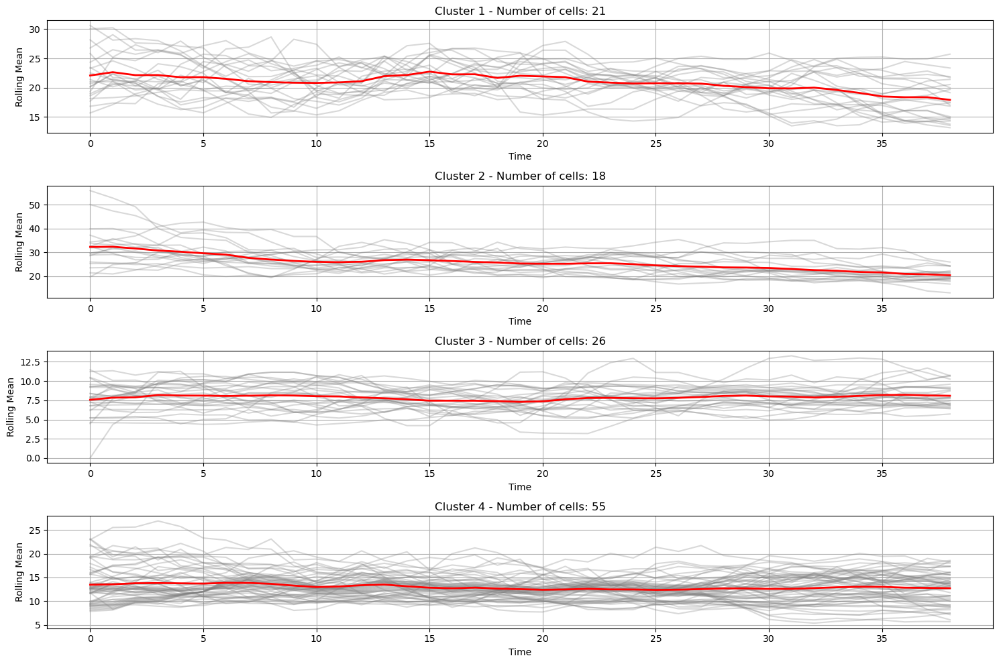

In [98]:
X = rolling_mean_area_results.T.values  # Transpose the data to match your use case

# Calculate the cluster centers (centroids) by averaging the data points within each cluster
n_clusters = 4 
cluster_centers = []

for i in range(1, n_clusters + 1):
    cluster_centers.append(X[cluster_labels_df['Cluster Labels'] == i].mean(axis=0))

# Plot the clusters
plt.figure(figsize=(15, 10))
for i in range(1, n_clusters + 1):
    plt.subplot(n_clusters, 1, i)
    plt.title(f'Cluster {i} - Number of cells: {(cluster_labels_df["Cluster Labels"] == i).sum()}')
    
    # Plot all curves in the cluster
    for client in X[cluster_labels_df['Cluster Labels'] == i]:
        plt.plot(client, color='grey', alpha=0.3)
    
    # Plot the centroid curve
    plt.plot(cluster_centers[i-1], color='red', linewidth=2)

    plt.xlabel('Time')
    plt.ylabel('Rolling Mean')
    plt.grid(True)

plt.tight_layout()
plt.show()

### Combined data for delta trend - Rolling Mean Statistical Function

In [99]:
rolling_mean_delta_results.columns = rolling_mean_delta_results.columns.droplevel(1)

In [100]:
rolling_mean_delta_results.head()

Cell,Movie 1_Cell 2,Movie 1_Cell 3,Movie 1_Cell 4,Movie 1_cell 5,Movie 1_Cell 6,Movie 1_Cell 7,Movie 1_Cell 9,Movie 1_Cell 10,Movie 1_Cell 11,Movie 1_Cell 12,Movie 1_Cell 14,Movie 1_Cell 15,Movie 1_cell 16,Movie 1_Cell 17,Movie 1_Cell 18,Movie 1_Cell 19,Movie 1_Cell 20,Movie 1_Cell 21,Movie 1_Cell 22,Movie 1_Cell 23,Movie 1_Cell 24,Movie 1_Cell 25,Movie 1_Cell 26,Movie 1_Cell 2.1,Movie 1_Cell 3.1,Movie 1_Cell 4.1,Movie 1_cell 5.1,Movie 1_Cell 6.1,Movie 1_Cell 7.1,Movie 1_Cell 9.1,Movie 1_Cell 10.1,Movie 1_Cell 11.1,Movie 1_Cell 12.1,Movie 1_Cell 13.1,Movie 1_Cell 14.1,Movie 1_Cell 15.1,Movie 1_cell 16.1,Movie 1_M,Movie 1_N,Movie 1_O,Movie 2_P,Movie 2_R,Movie 2_S,Movie 2_T,Movie 2_U,Movie 2_W,Movie 2_V,Movie 2_Y,Movie 2_Z,Movie 2_X,Movie 2_Cell 1,Movie 2_Cell 2,Movie 2_Cell 3,Movie 2_Cell 4,Movie 2_Cell 5,Movie 2_Cell C1,Movie 2_Cell C2,Movie 2_Cell C3,Movie 2_Cell C4,Movie 2_Cell C5,Movie 2_Cell 11,Movie 2_Cell 12,Movie 2_Cell 13,Movie 2_Cell 14,Movie 2_15 (purple),Movie 2_15 (white),Movie 2_Cell 16,Movie 2_Cell 18,Movie 2_Cell 22,Movie 2_Cell 23,Movie 2_Cell 34,Movie 2_Cell 36,Movie 3_Cell 1,Movie 3_Cell 2,Movie 3_Cell 3,Movie 3_Cell 4,Movie 3_Cell 5,Movie 3_Cell 6,Movie 3_Cell 7,Movie 3_Cell 8,Movie 3_Cell 9,Movie 3_Cell 10,Movie 3_Cell 11,Movie 3_Cell 12,Movie 3_Cell 13,Movie 3_Cell 14,Movie 3_Cell 15,Movie 3_Cell 21,Movie 3_Cell 22,Movie 3_Cell 23,Movie 3_Cell 24,Movie 3_Cell 25,Movie 3_Cell 26,Movie 3_Cell 27,Movie 3_Cell 28,Movie 3_Cell 29,Movie 3_Cell 30,Movie 3_Cell 31,Movie 3_Cell 34,Movie 3_Cell 37,Movie 3_Cell 38,Movie 3_Cell 39,Movie 3_Cell 40,Movie 3_Cell 41,Movie 3_Cell 42,Movie 3_Cell 43,Movie 3_Cell 44,Movie 3_Cell 45,Movie 3_Cell 46,Movie 3_Cell 47,Movie 3_Cell 48,Movie 3_Cell 49,Movie 3_Cell 50,Movie 3_Cell 51,Movie 3_Cell 52,Movie 3_Cell 53,Movie 3_Cell 54,Movie 3_Cell 55,Movie 3_Cell 56,Movie 3_Cell 57
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.158100,-0.217500,-1.976200,-0.553333,-0.316333,0.296425,-1.047363,-0.306312,-1.185625e-01,-0.069163,0.276675,-1.185625e-01,-0.118575,0.296425,-0.385350,-0.098800,-0.197612,-0.019750,-0.741062,-0.494038,-0.029650,0.207487,0.191971,-0.249197,0.138963,0.176710,0.214457,0.252204,0.449499,0.500993,0.552488,0.603983,0.655478,0.706973,0.758468,0.809963,0.861457,0.395225,0.602737,-0.069175,-0.316200,-0.237100,2.371000e-01,-7.114000e-01,0.948500,1.976200,0.049400,-0.790500,0.316100,0.632400,2.840550,-5.917813,0.289315,-6.075622,-0.304345,2.196957,-2.275420,2.196957,-4.236989,2.353883,-8.220800,-0.553400,2.450400,3.636100,-3.478000,4.742800,3.003700,0.395200,0.316200,4.426600,4.268500,-5.8494,-6.848000,3.847000,-3.001000,4.770000,5.156000,-1.769800,2.462200,4.539900,-2.000600,6.848300,3.155000e+00,6.463000,-2.001000,5.156000,0.077000,11.618900,-6.232700,-5.001500,6.309600,-5.386200,1.846800,10.233900,0.153900,-6.463600,-6.155700,3.77040,-1.462000,-1.846700,-6.771300,4.001200,0.615600,4.386000,0.384800,-2.462300,-4.462900,-0.384700,-0.923400,3.4626,0.307800,-4.155100,2.539300,1.539000,6.848300,0.153900,-1.000300,0.077000,2.847000,-1.462000
20,0.128450,-0.243150,-1.225250,-0.296429,-0.257042,-0.247037,-0.326081,-0.113656,1.916919e+00,1.743969,0.343857,1.916919e+00,0.067183,-0.247037,1.546325,-0.057300,-1.482106,-0.839875,-4.046181,-0.009869,0.301325,0.301344,0.071286,-0.282563,0.067323,0.095164,0.123005,0.150846,0.544857,0.564248,0.583639,0.603030,0.622421,0.641812,0.661203,0.680594,0.699985,1.541413,0.854719,-1.220287,-0.434750,-0.592850,-7.905000e-01,7.509500e-01,-0.118600,0.988100,-0.014800,-0.909050,0.513800,-0.197600,0.118356,1.696440,0.325010,-2.524934,-0.314912,-0.823859,-0.941553,1.020016,-3.687750,-0.745396,-2.410900,0.553300,2.964200,4.268500,-1.580950,-0.632350,1.541400,0.988050,-1.264750,-1.936650,-0.079050,-5.5332,0.346000,1.539000,-1.500500,0.115000,1.423500,-1.423500,0.038450,-2.808550,-1.577400,1.500500,-8.080000e-01,2.808500,-1.154500,4.809500,-3.347000,2.154500,-7.04

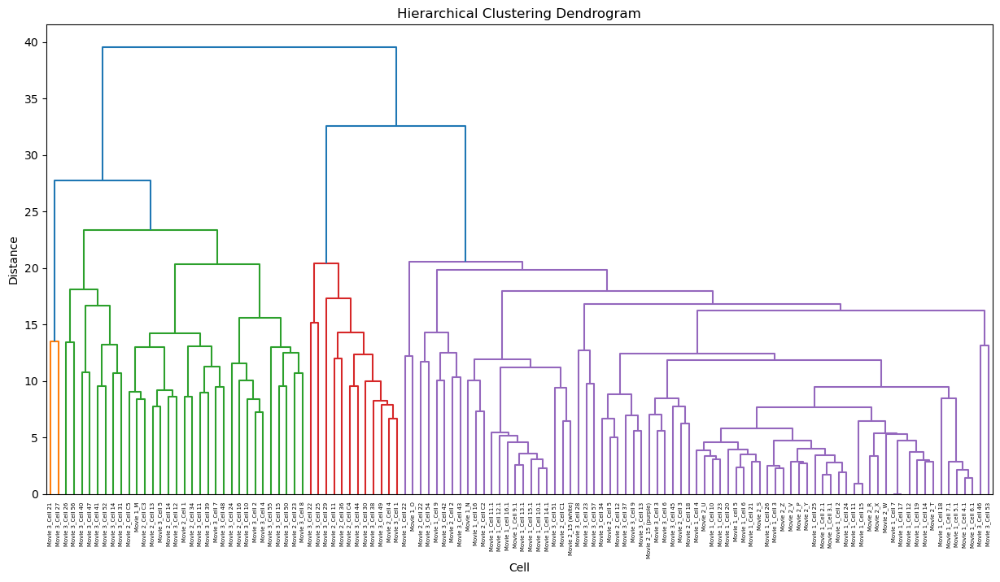

In [101]:
# Hierarchical Clustering using Ward's method
Z = linkage(rolling_mean_delta_results.T, method='ward', metric='euclidean')

# Plot the Dendrogram
plt.figure(figsize=(15, 7.5))
dendrogram(Z, labels=rolling_mean_delta_results.columns, leaf_rotation=90)
plt.xlabel('Cell')
plt.ylabel('Distance')
plt.title('Hierarchical Clustering Dendrogram')
plt.show()

In [102]:
# Determine clusters - here, we choose to form 5 clusters
optimal_k_value = 5
cluster_labels = fcluster(Z, optimal_k_value, criterion='maxclust')

# Assign the hierarchical cluster labels
cluster_labels_df = pd.DataFrame(cluster_labels, index=rolling_mean_delta_results.columns, columns=['Cluster Labels'])

# Create multi-index for columns as you did before
new_columns = pd.MultiIndex.from_tuples(
    [(cell, cluster_labels_df.loc[cell, 'Cluster Labels']) for cell in rolling_mean_delta_results.columns],
    names=['Cell', 'Cluster']
)
rolling_mean_delta_results.columns = new_columns

In [103]:
rolling_mean_delta_results

Cell,Movie 1_Cell 2,Movie 1_Cell 3,Movie 1_Cell 4,Movie 1_cell 5,Movie 1_Cell 6,Movie 1_Cell 7,Movie 1_Cell 9,Movie 1_Cell 10,Movie 1_Cell 11,Movie 1_Cell 12,Movie 1_Cell 14,Movie 1_Cell 15,Movie 1_cell 16,Movie 1_Cell 17,Movie 1_Cell 18,Movie 1_Cell 19,Movie 1_Cell 20,Movie 1_Cell 21,Movie 1_Cell 22,Movie 1_Cell 23,Movie 1_Cell 24,Movie 1_Cell 25,Movie 1_Cell 26,Movie 1_Cell 2.1,Movie 1_Cell 3.1,Movie 1_Cell 4.1,Movie 1_cell 5.1,Movie 1_Cell 6.1,Movie 1_Cell 7.1,Movie 1_Cell 9.1,Movie 1_Cell 10.1,Movie 1_Cell 11.1,Movie 1_Cell 12.1,Movie 1_Cell 13.1,Movie 1_Cell 14.1,Movie 1_Cell 15.1,Movie 1_cell 16.1,Movie 1_M,Movie 1_N,Movie 1_O,Movie 2_P,Movie 2_R,Movie 2_S,Movie 2_T,Movie 2_U,Movie 2_W,Movie 2_V,Movie 2_Y,Movie 2_Z,Movie 2_X,Movie 2_Cell 1,Movie 2_Cell 2,Movie 2_Cell 3,Movie 2_Cell 4,Movie 2_Cell 5,Movie 2_Cell C1,Movie 2_Cell C2,Movie 2_Cell C3,Movie 2_Cell C4,Movie 2_Cell C5,Movie 2_Cell 11,Movie 2_Cell 12,Movie 2_Cell 13,Movie 2_Cell 14,Movie 2_15 (purple),Movie 2_15 (white),Movie 2_Cell 16,Movie 2_Cell 18,Movie 2_Cell 22,Movie 2_Cell 23,Movie 2_Cell 34,Movie 2_Cell 36,Movie 3_Cell 1,Movie 3_Cell 2,Movie 3_Cell 3,Movie 3_Cell 4,Movie 3_Cell 5,Movie 3_Cell 6,Movie 3_Cell 7,Movie 3_Cell 8,Movie 3_Cell 9,Movie 3_Cell 10,Movie 3_Cell 11,Movie 3_Cell 12,Movie 3_Cell 13,Movie 3_Cell 14,Movie 3_Cell 15,Movie 3_Cell 21,Movie 3_Cell 22,Movie 3_Cell 23,Movie 3_Cell 24,Movie 3_Cell 25,Movie 3_Cell 26,Movie 3_Cell 27,Movie 3_Cell 28,Movie 3_Cell 29,Movie 3_Cell 30,Movie 3_Cell 31,Movie 3_Cell 34,Movie 3_Cell 37,Movie 3_Cell 38,Movie 3_Cell 39,Movie 3_Cell 40,Movie 3_Cell 41,Movie 3_Cell 42,Movie 3_Cell 43,Movie 3_Cell 44,Movie 3_Cell 45,Movie 3_Cell 46,Movie 3_Cell 47,Movie 3_Cell 48,Movie 3_Cell 49,Movie 3_Cell 50,Movie 3_Cell 51,Movie 3_Cell 52,Movie 3_Cell 53,Movie 3_Cell 54,Movie 3_Cell 55,Movie 3_Cell 56,Movie 3_Cell 57
Cluster,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,3,5,5,5,5,5,5,5,5,5,5,5,5,3,5,5,4,5,5,5,3,4,3,4,5,3,3,5,5,3,5,5,3,3,4,4,3,5,3,3,5,3,3,5,3,3,3,5,2,3,1,4,5,3,4,2,1,5,4,4,2,5,5,4,3,2,2,5,5,4,5,5,2,3,4,3,5,2,5,5,3,2,5
Interval [min],,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.158100,-2.175000e-01,-1.976200,-0.553333,-0.316333,2.964250e-01,-1.047363,-3.063125e-01,-1.185625e-01,-6.916250e-02,2.766750e-01,-1.185625e-01,-0.118575,2.964250e-01,-0.385350,-0.098800,-1.976125e-01,-0.019750,-0.741062,-4.940375e-01,-0.029650,2.074875e-01,1.919714e-01,-0.249197,0.138963,0.176710,0.214457,0.252204,0.449499,0.500993,0.552488,0.603983,0.655478,0.706973,0.758468,8.099625e-01,0.861457,0.395225,0.602737,-0.069175,-0.316200,-0.237100,2.371000e-01,-7.114000e-01,0.948500,1.976200,4.940000e-02,-7.905000e-01,0.316100,0.632400,2.840550,-5.917813,0.289315,-6.075622,-0.304345,2.196957,-2.275420e+00,2.196957,-4.236989,2.353883,-8.220800,-5.534000e-01,2.450400,3.636100,-3.478000,4.742800,3.003700,0.395200,0.316200,4.426600,4.268500,-5.849400,-6.848000,3.847000,-3.001000,4.770000,5.156000,-1.769800e+00,2.462200,4.539900,-2.000600,6.848300e+00,3.155000e+00,6.463000,-2.001000,5.156000,0.077000,1.161890e+01,-6.232700,-5.001500,6.309600,-5.386200e+00,1.846800e+00,10.233900,0.153900,-6.463600,-6.155700,3.770400,-1.462000,-1.846700,-6.771300e+00,4.001200,0.615600,4.386000,0.384800,-2.462300,-4.462900,-0.384700,-9.234000e-01,3.462600,3.078000e-01,-4.155100,2.539300,1.539000,6.848300,0.153900,-1.000300,7.700000e-02,2.847000,-1.462000
20,0.128450,-2.431500e-01,-1.225250,-0.296429,-0.257042,-2.470375e-01,-0.326081,-1.136562e-01,1.916919e+00,1.743969e+00,3.438575e-01,1.916919e+00,0.067183,-2.470375e-01,1.546325,-0.057300,-1.482106e+00,-0.839875,-4.046181,-9.868750e-03,0.301325,3.013437e-01,7.128571e-02,-0.282563,0.067323,0.095164,0.123005,0.150846,0.544857,0.564248,0.583639,0.603030,0.622421,0.641812,0.661203,6.805940e-01,0.699985,1.541413,0.854719,-1.220287,-0.434750,-0.592850,-7.905000e-01,7.509500e-01,-0.118600,0.988100,-1.480000e-02,-9

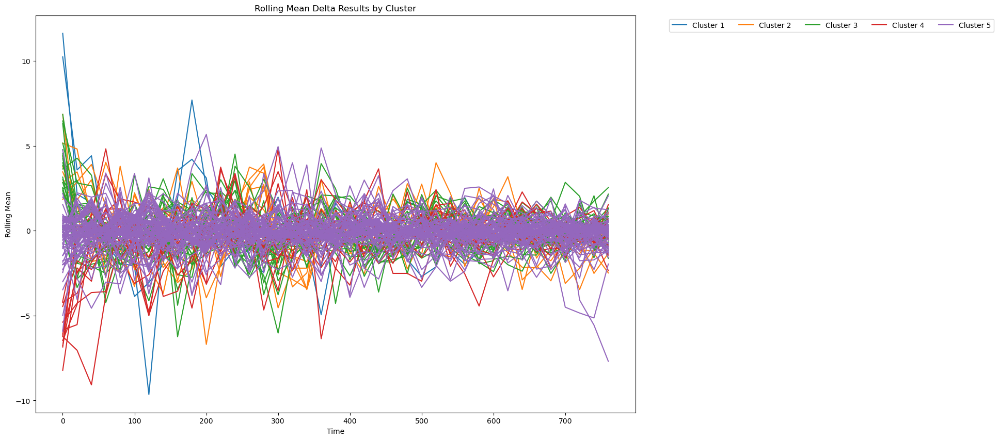

In [104]:
# Set up the color palette (one color for each cluster)
palette = sns.color_palette("tab10", optimal_k_value)

plt.figure(figsize=(15, 10))

# Loop through each cluster and plot the data
for cluster in range(1, optimal_k_value + 1):
    # Get the data for the current cluster
    cluster_cells = rolling_mean_delta_results.columns.get_level_values('Cell')[
        rolling_mean_delta_results.columns.get_level_values('Cluster') == cluster]
    
    # Plot each cell in the current cluster
    for cell in cluster_cells:
        plt.plot(rolling_mean_delta_results[cell].index, rolling_mean_delta_results[cell], 
                 color=palette[cluster-1], label=f'Cluster {cluster}' if cell == cluster_cells[0] else "")
        
# Customize the plot
plt.title('Rolling Mean Delta Results by Cluster')
plt.xlabel('Time')
plt.ylabel('Rolling Mean')
plt.legend(ncol=optimal_k_value, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

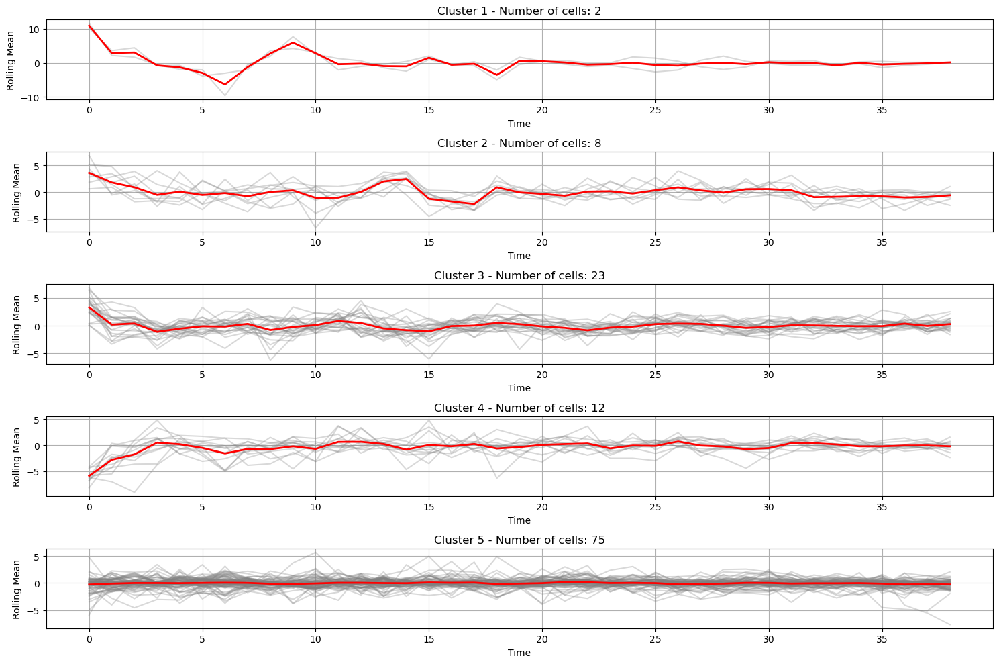

In [105]:
X = rolling_mean_delta_results.T.values  # Transpose the data to match your use case

# Calculate the cluster centers (centroids) by averaging the data points within each cluster
n_clusters = 5 
cluster_centers = []

for i in range(1, n_clusters + 1):
    cluster_centers.append(X[cluster_labels_df['Cluster Labels'] == i].mean(axis=0))

# Plot the clusters
plt.figure(figsize=(15, 10))
for i in range(1, n_clusters + 1):
    plt.subplot(n_clusters, 1, i)
    plt.title(f'Cluster {i} - Number of cells: {(cluster_labels_df["Cluster Labels"] == i).sum()}')
    
    # Plot all curves in the cluster
    for client in X[cluster_labels_df['Cluster Labels'] == i]:
        plt.plot(client, color='grey', alpha=0.3)
    
    # Plot the centroid curve
    plt.plot(cluster_centers[i-1], color='red', linewidth=2)

    plt.xlabel('Time')
    plt.ylabel('Rolling Mean')
    plt.grid(True)

plt.tight_layout()
plt.show()